<a href="https://colab.research.google.com/github/ferrazzijk/Segmenting-Illinois-Schools-by-5-Essentials-Climate-Survey-Data/blob/main/Segmenting_IL_Schools_by_5_Essentials_Climate_Survey_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Segmenting Illinois Schools by 5 Essentials Climate Survey Data**

The data provided is provided compliments of the Illinois State Board of Education. We are examining the Illinois 5-Essentials Survey Restults for the 18-19 school year and training a model to group schools by similarity. 


**What are the 5Essentials and 5Essentials Survey?**

5Essentials is an evidence-based system designed to drive improvement in schools nationwide—it reliably measures changes in a school organization through the 5Essentials Survey and provides individualized, actionable Reports for each school. The 5Essentials system is based on more than 20 years of research by the University of Chicago Consortium on School Research on five components found to be critical for school success:

*   **Effective Leaders:** The principal works with teachers to implement a clear and strategic vision for school success.
*   **Collaborative Teachers:** Teachers collaborate to promote professional growth.
*   **Involved Families:** The entire school staff builds strong relationships with families and communities to support learning.
*   **Supportive Environment:** The school is safe and orderly. Teachers have high expectations for students and support students to realize their goals. Classmates also support one another.
*  **Ambitious Instruction:** Classes are academically demanding and engage students by emphasizing the application of knowledge.

The original data set, including an explanation of terms, can be found [here](https://www.isbe.net/_layouts/Download.aspx?SourceUrl=/Documents/2019-Report-Card-Public-Data-Set.xlsx).

An overview of the 5 Essentials Survey can be founnd [here](https://uchicagoimpact.org/sites/default/files/5EOnePager_Nov2019.pdf).

The framework of the 5 Esstianls Survey can be found [here](https://uchicagoimpact.org/sites/default/files/5eframework_outreach%26marketing%20%281%29.pdf).

The data set was chosen out of direct personal relation with it. I was a teacher at a school in the data set, A. Vito Martinez Middle School, from the 2011-2012 school year through the 2018-2019 school year. 

In [ ]:
#imports
import numpy as np
import pandas as pd
import seaborn as sns
import time
import umap.umap_ as umap

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
%matplotlib inline

from sklearn import preprocessing, metrics
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix, calinski_harabasz_score
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler, LabelEncoder

from scipy.cluster.hierarchy import dendrogram, linkage

import warnings
warnings.filterwarnings("ignore")

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,6)})

In [ ]:
#load data
url = 'https://raw.githubusercontent.com/ferrazzijk/27.1-Unsupervised-Learning-Capstone/main/2018-19-ISBE-5Essentials-Data-File.csv'
df = pd.read_csv(url, encoding='cp1252')

#print the shape
print('Datset cotains {} rows and {} columns.'.format(df.shape[0], df.shape[1]))

#view first five rows
df.head()

Datset cotains 3890 rows and 58 columns.


,ï»¿Contract,school_id,report_school_id,school_name,location,student_response_rate,teacher_response_rate,student_n,teacher_n,acno,cdis,clar,colb,colr,data,emhl,engg,engl,futr,grit,humr,inf3,innv,ins3,math,peer,perc,pgmc,pnfl,pres,prs2,prt4,prti,pssm,qpd2,refd,rigr,safe,scie,scmt,sdis,slap,socz,ssaf,stdy,trpa,trpr,trte,trts,tsaf,uexp,E_ldr,E_tch,E_fam,E_env,E_ins,Category5E,net5e
0,ISBE,3753,070161630022008,21st Century Primary Center,240 S Orchard Dr Park Forest IL 60466,0.0,56.5,2,23,NaN,76.0,NaN,96.0,83.0,99.0,NaN,NaN,NaN,NaN,NaN,NaN,49.0,93.0,96.0,NaN,NaN,NaN,78.0,93.0,NaN,NaN,61.0,46.0,NaN,93.0,99.0,NaN,NaN,NaN,59.0,99.0,NaN,99.0,NaN,NaN,50.0,63.0,99.0,NaN,40.0,NaN,72.0,86.0,68.0,NaN,NaN,5,3.0
1,ISBE,1818,500821870261014,7th Grade Academy,1900 Mousette Ln Cahokia IL 62206,52.2,50.0,232,18,53.0,8.0,7.0,NaN,9.0,NaN,2.0,99.0,69.0,NaN,31.0,24.0,31.0,1.0,33.0,67.0,19.0,54.0,61.0,19.0,68.0,29.0,NaN,1.0,26.0,57.0,26.0,25.0,1.0,30.0,21.0,4.0,NaN,40.0,17.0,34.0,28.0,36.0,50.0,37.0,1.0,NaN,40.0,34.0,24.0,36.0,52.0,1,-3.0
2,ISBE,1819,500821870261015,8th Grade Academy,1900 Mousette Ln Cahokia IL 62206,90.2,85.0,246,20,23.0,1.0,1.0,2.0,1.0,47.0,20.0,44.0,49.0,NaN,20.0,14.0,18.0,1.0,9.0,44.0,4.0,18.0,41.0,3.0,42.0,16.0,1.0,1.0,13.0,22.0,1.0,1.0,1.0,10.0,1.0,1.0,NaN,1.0,25.0,17.0,1.0,39.0,1.0,27.0,1.0,NaN,27.0,5.0,2.0,17.0,34.0,1,-5.0
3,ISBE,2027,070162180160007,A B Shepard High Sch (Campus),13049 S Ridgeland Ave Palos Heights IL 60463,78.3,70.9,1741,182,73.0,70.0,66.0,61.0,41.0,63.0,39.0,86.0,57.0,28.0,28.0,59.0,16.0,42.0,45.0,61.0,60.0,70.0,45.0,57.0,60.0,49.0,40.0,56.0,40.0,64.0,55.0,46.0,40.0,66.0,50.0,50.0,61.0,99.0,45.0,61.0,51.0,44.0,47.0,79.0,41.0,36.0,38.0,53.0,49.0,54.0,57.0,2,-1.0
4,ISBE,4036,060160960022001,A F Ames Elem School,86 Southcote Rd Riverside IL 60546,99.9,80.0,134,40,89.0,87.0,NaN,56.0,57.0,80.0,NaN,NaN,90.0,NaN,NaN,NaN,48.0,80.0,42.0,89.0,NaN,68.0,72.0,76.0,71.0,NaN,72.0,52.0,NaN,60.0,69.0,NaN,68.0,NaN,61.0,97.0,NaN,99.0,NaN,NaN,85.0,46.0,55.0,83.0,58.0,NaN,52.0,58.0,78.0,77.0,87.0,5,3.0


**Column Descriptions**

**Student_Response_Rate:**	Response rate on student survey

**Teacher_Response_Rate:**	Response rate on teacher survey

**Student_N:**	Total number of possible student respondents

**Teacher_N:**	Total number of possible teacher respondents

**acno**	Peer Support for Academic Work: Students demonstrate behaviors that lead to academic achievement

**cdis:**	Classroom Disruptions

**clar:**	Course Clarity

**colb:**	Collaborative Practices

**colr:**	Collective Responsibility

**data:**	Collective Use of Assessment Data

**emhl:**	Emotional Health

**engg:**	Academic Engagement

**engl:**	English Instruction

**grit:**	Grit

**humr:**	Human & Social Resources in the Community

**inf3:**	Teacher Influence

**innv:**	Innovation

**ins2:**	Instructional Leadership

**math:**	Math Instruction

**perc:**	Academic Personalism

**peer:**	Student Peer Relationships

**pgmc:**	Program Coherence

**pnfl:**	Parent Influence on Decision Making in Schools

**pres:**	Academic Press

**prt4:**	Parent Involvement in School

**prti:**	Student Responsibility

**pssm:**	School Connectedness

**qpd2:**	Quality Professional Development

**refd:**	Reflective Dialogue

**rigr:**	Classroom Rigor

**safe:**	Safety

**scie:**	Science Instruction

**scmt:**	School Commitment

**sdis:**	Quality of Student Discussion

**socz:**	Socialization of New Teachers

**ssaf:**	School Safety

**stdy:**	Rigorous Study Habits

**trpa:**	Teacher-Parent Trust

**trpr:**	Teacher-Principal Trust

**trte:**	Teacher-Teacher Trust

**trts:**	Student-Teacher Trust

**tsaf:**	Teacher Safety

**futr:**	Importance of High School for the Future

**slap:**	School-Wide Future Orientation

**uexp:**	Expectations for Postsecondary Education

**E_Ldr	Essential:** Effective Leaders

**E_Tch	Essential:** Collaborative Teachers

**E_Fam	Essential:** Involved Families

**E_Env	Essential:** Supportive Environment

**E_Ins	Essential:** Ambitious Instruction

**Category5E:**	"Category 5E corresponds to how strong a school is on the Essentials. A school's performance determines how well organized they are for improvement. 
*   1-5: 1 if Not Yet Organized, 2 if Partially Organized, 3 if Moderately Organized, 4 if Organized, 5 if Well-Organized"

**Net5E:**	"The overall 5Essentials score is a summary indicator that describes a school’s performance on the 5Essentials as a group.  This score is calculated by adding up the school’s performance on each individual Essential. Being light green (strong) or dark green (very strong) on an Essential counts as +1; yellow (neutral) or missing counts as 0; and orange (weak) or dark red (very weak) counts as -1. ‘


# **Exploratory Data Analysis & Data Cleaning**

In [ ]:
#create a copy of df, in case original df is desired later
illinois_df = df
illinois_df.head()

,ï»¿Contract,school_id,report_school_id,school_name,location,student_response_rate,teacher_response_rate,student_n,teacher_n,acno,cdis,clar,colb,colr,data,emhl,engg,engl,futr,grit,humr,inf3,innv,ins3,math,peer,perc,pgmc,pnfl,pres,prs2,prt4,prti,pssm,qpd2,refd,rigr,safe,scie,scmt,sdis,slap,socz,ssaf,stdy,trpa,trpr,trte,trts,tsaf,uexp,E_ldr,E_tch,E_fam,E_env,E_ins,Category5E,net5e
0,ISBE,3753,070161630022008,21st Century Primary Center,240 S Orchard Dr Park Forest IL 60466,0.0,56.5,2,23,NaN,76.0,NaN,96.0,83.0,99.0,NaN,NaN,NaN,NaN,NaN,NaN,49.0,93.0,96.0,NaN,NaN,NaN,78.0,93.0,NaN,NaN,61.0,46.0,NaN,93.0,99.0,NaN,NaN,NaN,59.0,99.0,NaN,99.0,NaN,NaN,50.0,63.0,99.0,NaN,40.0,NaN,72.0,86.0,68.0,NaN,NaN,5,3.0
1,ISBE,1818,500821870261014,7th Grade Academy,1900 Mousette Ln Cahokia IL 62206,52.2,50.0,232,18,53.0,8.0,7.0,NaN,9.0,NaN,2.0,99.0,69.0,NaN,31.0,24.0,31.0,1.0,33.0,67.0,19.0,54.0,61.0,19.0,68.0,29.0,NaN,1.0,26.0,57.0,26.0,25.0,1.0,30.0,21.0,4.0,NaN,40.0,17.0,34.0,28.0,36.0,50.0,37.0,1.0,NaN,40.0,34.0,24.0,36.0,52.0,1,-3.0
2,ISBE,1819,500821870261015,8th Grade Academy,1900 Mousette Ln Cahokia IL 62206,90.2,85.0,246,20,23.0,1.0,1.0,2.0,1.0,47.0,20.0,44.0,49.0,NaN,20.0,14.0,18.0,1.0,9.0,44.0,4.0,18.0,41.0,3.0,42.0,16.0,1.0,1.0,13.0,22.0,1.0,1.0,1.0,10.0,1.0,1.0,NaN,1.0,25.0,17.0,1.0,39.0,1.0,27.0,1.0,NaN,27.0,5.0,2.0,17.0,34.0,1,-5.0
3,ISBE,2027,070162180160007,A B Shepard High Sch (Campus),13049 S Ridgeland Ave Palos Heights IL 60463,78.3,70.9,1741,182,73.0,70.0,66.0,61.0,41.0,63.0,39.0,86.0,57.0,28.0,28.0,59.0,16.0,42.0,45.0,61.0,60.0,70.0,45.0,57.0,60.0,49.0,40.0,56.0,40.0,64.0,55.0,46.0,40.0,66.0,50.0,50.0,61.0,99.0,45.0,61.0,51.0,44.0,47.0,79.0,41.0,36.0,38.0,53.0,49.0,54.0,57.0,2,-1.0
4,ISBE,4036,060160960022001,A F Ames Elem School,86 Southcote Rd Riverside IL 60546,99.9,80.0,134,40,89.0,87.0,NaN,56.0,57.0,80.0,NaN,NaN,90.0,NaN,NaN,NaN,48.0,80.0,42.0,89.0,NaN,68.0,72.0,76.0,71.0,NaN,72.0,52.0,NaN,60.0,69.0,NaN,68.0,NaN,61.0,97.0,NaN,99.0,NaN,NaN,85.0,46.0,55.0,83.0,58.0,NaN,52.0,58.0,78.0,77.0,87.0,5,3.0


In [ ]:
#check for null values
total_missing = illinois_df.isnull().sum().sort_values(ascending=False)
percent_missing = (illinois_df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total_missing, percent_missing], axis=1, keys=['Total', 'Percent'])
missing_data.head(50)

,Total,Percent
uexp,3239,0.832648
slap,3188,0.819537
futr,3188,0.819537
scie,1613,0.414653
rigr,1605,0.412596
engg,1605,0.412596
clar,1605,0.412596
stdy,1604,0.412339
ssaf,1604,0.412339
grit,1604,0.412339


In [ ]:
#initial inspection shows 3 columns with > 75% NaN values, so let's drop columns 
#using .dropna's thresh parameter
illinois_df.dropna(thresh =illinois_df.shape[0]*0.25, how = 'any', axis = 1, 
inplace= True )

#drop rows with 75% of missing data as well
illinois_df.dropna(thresh =illinois_df.shape[1]*0.25, how = 'any', axis = 0, 
inplace= True )

#print the shape
print('Datset now cotains {} rows and {} columns.'.format(illinois_df.shape[0], 
illinois_df.shape[1]))

Datset now cotains 3687 rows and 55 columns.


In [ ]:
#check for null values
total_missing = illinois_df.isnull().sum().sort_values(ascending=False)
percent_missing = (illinois_df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total_missing, percent_missing], axis=1, keys=['Total', 'Percent'])
missing_data.head(50)

,Total,Percent
scie,1410,0.382425
clar,1402,0.380255
engg,1402,0.380255
rigr,1402,0.380255
stdy,1401,0.379984
emhl,1401,0.379984
grit,1401,0.379984
humr,1401,0.379984
peer,1401,0.379984
prs2,1401,0.379984


In [ ]:
#find unique values of Category5E column so we can eventually fillna
#with means of schools within same Category5E value
illinois_df['Category5E'].unique()

array([5, 1, 2, 4, 3, 0])

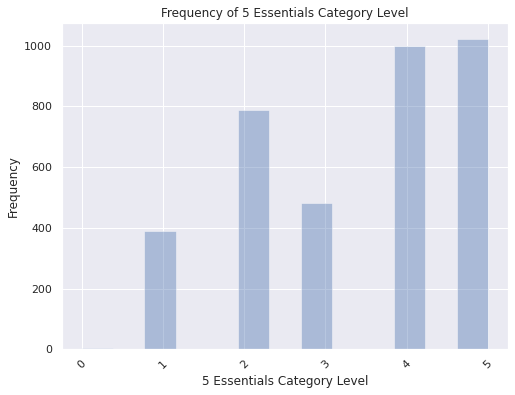

In [ ]:
#view distribution of Category5E values
all_illinois =sns.distplot(illinois_df['Category5E'], kde = False)
plt.xlabel('5 Essentials Category Level')
plt.ylabel('Frequency')
plt.title('Frequency of 5 Essentials Category Level')
plt.xticks(rotation = 45)
plt.show()

In [ ]:
#list of missing data columns for copy/paste use later
missing_data.index

Index(['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 'humr', 'peer',
       'prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 'E_env',
       'perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 'colb',
       'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
       'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr',
       'net5e', 'Category5E', 'teacher_n', 'student_n',
       'teacher_response_rate', 'student_response_rate', 'location',
       'school_name', 'report_school_id', 'school_id', 'ï»¿Contract'],
      dtype='object')

In [ ]:
no_missing_il = illinois_df.dropna()
no_missing_il_df = pd.DataFrame(data=no_missing_il)
#check for null values
total_missing = no_missing_il_df.isnull().sum().sort_values(ascending=False)
percent_missing = (no_missing_il.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total_missing, percent_missing], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
net5e,0,0.0
colr,0,0.0
peer,0,0.0
math,0,0.0
ins3,0,0.0


In [ ]:
#data frame for Category5E of 0
cat_5e_0 = (no_missing_il_df['Category5E']==0)
cat_5e_0_bools = no_missing_il_df.iloc[cat_5e_0.values]
cat_5e_0_bools = pd.DataFrame(data = cat_5e_0_bools)

#data frame for Category5E of 1
cat_5e_1 = (no_missing_il_df['Category5E']==1)
cat_5e_1_bools = no_missing_il_df.iloc[cat_5e_1.values]
cat_5e_1_bools = pd.DataFrame(data = cat_5e_1_bools)

#data frame for Category5E of 2
cat_5e_2 = (no_missing_il_df['Category5E']==2)
cat_5e_2_bools = no_missing_il_df.iloc[cat_5e_2.values]
cat_5e_2_bools = pd.DataFrame(data = cat_5e_2_bools)

#data frame for Category5E of 3
cat_5e_3 = (no_missing_il_df['Category5E']==3)
cat_5e_3_bools = no_missing_il_df.iloc[cat_5e_3.values]
cat_5e_3_bools = pd.DataFrame(data = cat_5e_3_bools)

#data frame for Category5E of 4
cat_5e_4 = (no_missing_il_df['Category5E']==4)
cat_5e_4_bools = no_missing_il_df.iloc[cat_5e_4.values]
cat_5e_4_bools = pd.DataFrame(data = cat_5e_4_bools)

#data frame for Category5E of 5
cat_5e_5 = (no_missing_il_df['Category5E']==0)
cat_5e_5_bools = no_missing_il_df.iloc[cat_5e_5.values]
cat_5e_5_bools = pd.DataFrame(data = cat_5e_5_bools)

In [ ]:
#print means of columns for each Category5E value

print('Category 5E Value 0 Means:')
print(cat_5e_0_bools[['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 
  'humr', 'peer','prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 
  'E_env','perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 
  'colb', 'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
  'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr','net5e']].mean())
print()
print('Category 5E Value 1 Means:')
print(cat_5e_1_bools[['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 
  'humr', 'peer','prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 
  'E_env','perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 
  'colb', 'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
  'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr','net5e']].mean())
print()
print('Category 5E Value 2 Means:')
print(cat_5e_2_bools[['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 
  'humr', 'peer','prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 
  'E_env','perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 
  'colb', 'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
  'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr', 'net5e']].mean())
print()
print('Category 5E Value 3 Means:')
print(cat_5e_3_bools[['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 
  'humr', 'peer','prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 
  'E_env','perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 
  'colb', 'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
  'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr', 'net5e']].mean())
print()
print('Category 5E Value 4 Means:')
print(cat_5e_4_bools[['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 
  'humr', 'peer','prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 
  'E_env','perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 
  'colb', 'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
  'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr', 'net5e']].mean())
print()
print('Category 5E Value 5 Means:')
print(cat_5e_5_bools[['scie', 'clar', 'engg', 'rigr', 'stdy', 'emhl', 'grit', 
  'humr', 'peer','prs2', 'ssaf', 'pssm', 'engl', 'math', 'trts', 'acno', 'pres', 
  'E_env','perc', 'safe', 'E_ins', 'cdis', 'sdis', 'prti', 'prt4', 'data', 
  'colb', 'E_fam', 'inf3', 'pnfl', 'trpa', 'trte', 'innv', 'socz', 'ins3', 'qpd2',
  'pgmc', 'E_ldr', 'E_tch', 'refd', 'tsaf', 'scmt', 'colr', 'trpr', 'net5e']].mean())

Category 5E Value 0 Means:
scie    NaN
clar    NaN
engg    NaN
rigr    NaN
stdy    NaN
emhl    NaN
grit    NaN
humr    NaN
peer    NaN
prs2    NaN
ssaf    NaN
pssm    NaN
engl    NaN
math    NaN
trts    NaN
acno    NaN
pres    NaN
E_env   NaN
perc    NaN
safe    NaN
E_ins   NaN
cdis    NaN
sdis    NaN
prti    NaN
prt4    NaN
data    NaN
colb    NaN
E_fam   NaN
inf3    NaN
pnfl    NaN
trpa    NaN
trte    NaN
innv    NaN
socz    NaN
ins3    NaN
qpd2    NaN
pgmc    NaN
E_ldr   NaN
E_tch   NaN
refd    NaN
tsaf    NaN
scmt    NaN
colr    NaN
trpr    NaN
net5e   NaN
dtype: float64

Category 5E Value 1 Means:
scie     46.200680
clar     26.714286
engg     49.265306
rigr     20.397959
stdy     29.255102
emhl     23.642857
grit     14.673469
humr     45.224490
peer     33.649660
prs2     34.404762
ssaf     44.401361
pssm     28.785714
engl     46.952381
math     54.761905
trts     48.105442
acno     39.935374
pres     43.768707
E_env    37.891156
perc     40.197279
safe     30.217687
E_ins    4

In [ ]:
#create dictionaries of above values.

missing_5e_0_dict = {'scie':45.785953,'clar':26.424749,'engg':48.973244,
'rigr':20.207358,'stdy':29.304348,'emhl':23.521739,'grit':14.775920,
'humr':45.217391,'peer':33.545151,'prs2':34.501672,'ssaf':44.501672,
'pssm':28.862876,'engl':47.256484,'math':53.904899,'trts':49.391931,
'acno':43.239193,'pres':44.786744,'E_env':39.919308,'perc':41.651297,
'safe':31.172911,'E_ins':43.265130,'cdis':54.517241,'sdis':26.265252,
'prti':34.122016,'prt4':27.443864,'data':37.980157,'colb':16.050131,
'E_fam':26.573643,'inf3':31.056701,'pnfl':27.117526,'trpa':32.623256,
'trte':40.388660,'innv':13.478350,'socz':55.122365,'ins3':17.206170,
'qpd2':35.762468,'pgmc':40.658612,'E_ldr':31.030848,'E_tch':29.266324,
'refd':30.600000,'tsaf':34.600000,'scmt':40.800000,'colr':29.200000,
'trpr':36.600000,'net5e':-3.473008}

missing_5e_1_dict = {'scie':45.785953,'clar':26.424749,'engg':48.973244,
'rigr':20.207358,'stdy':29.304348,'emhl':23.521739,'grit':14.775920,
'humr':45.217391,'peer':33.545151,'prs2':34.501672,'ssaf':44.501672,
'pssm':28.862876,'engl':47.256484,'math':53.904899,'trts':49.391931,
'acno':43.239193,'pres':44.786744,'E_env':39.919308,'perc':41.651297,
'safe':31.172911,'E_ins':43.265130,'cdis':54.517241,'sdis':26.265252,
'prti':34.122016,'prt4':27.443864,'data':43.300261,'colb':24.083551,
'E_fam':26.573643,'inf3':31.056701,'pnfl':27.896907,'trpa':24.279070,
'trte':33.471649,'innv':15.195876,'socz':63.305913,'ins3':20.007712,
'qpd2':31.203085,'pgmc':35.573265,'E_ldr':30.038560,'E_tch':27.665810,
'refd':28.506427,'tsaf':24.172237,'scmt':25.041131,'colr':24.526992,
'trpr':33.000000,'net5e':-3.473008}

missing_5e_2_dict = {'scie':47.406114,'clar':38.067391,'engg':54.195652,
'rigr':29.091304,'stdy':37.076087,'emhl':32.078261,'grit':19.976087,
'humr':52.623913,'peer':45.134783,'prs2':42.204348,'ssaf':53.284783,
'pssm':37.593478,'engl':53.303120,'math':59.864785,'trts':63.196137,
'acno':57.961367,'pres':55.838039,'E_env':52.988113,'perc':54.169391,
'safe':40.099554,'E_ins':52.066865,'cdis':67.471154,'sdis':37.835165,
'prti':42.603022,'prt4':38.794118,'data':47.628838,'colb':30.349800,
'E_fam':37.337784,'inf3':35.936085,'pnfl':35.140957,'trpa':37.985392,
'trte':40.552318,'innv':26.374339,'socz':72.354497,'ins3':30.625330,
'qpd2':40.280053,'pgmc':44.206077,'E_ldr':37.753298,'E_tch':36.200000,
'refd':35.302632,'tsaf':33.660526,'scmt':36.238158,'colr':33.753947,
'trpr':39.894737,'net5e':-1.438530}

missing_5e_3_dict = {'scie':49.250859,'clar':44.300341,'engg':59.549488,
'rigr':36.716724,'stdy':43.125850,'emhl':40.176871,'grit':26.619048,
'humr':54.867347,'peer':53.000000,'prs2':46.503401,'ssaf':59.996599,
'pssm':46.523810,'engl':56.400000,'math':63.002410,'trts':66.320482,
'acno':62.281928,'pres':59.496386,'E_env':56.771084,'perc':57.559036,
'safe':44.178313,'E_ins':56.797590,'cdis':73.347926,'sdis':46.619816,
'prti':49.572414,'prt4':47.264977,'data':51.552995,'colb':38.578341,
'E_fam':46.186788,'inf3':38.968254,'pnfl':43.641723,'trpa':47.868778,
'trte':48.258503,'innv':36.852608,'socz':76.857143,'ins3':41.879195,
'qpd2':50.185268,'pgmc':53.078125,'E_ldr':45.593750,'E_tch':45.372768,
'refd':43.325893,'tsaf':40.122768,'scmt':46.055804,'colr':43.220982,
'trpr':47.861607,'net5e':0.000000}

missing_5e_4_dict = {'scie':53.292894,'clar':54.213793,'engg':64.967241,
'rigr':43.455172,'stdy':50.122414,'emhl':47.577586,'grit':31.589655,
'humr':62.384483,'peer':62.053448,'prs2':54.417241,'ssaf':66.831034,
'pssm':54.267241,'engl':59.812705,'math':67.442013,'trts':74.994530,
'acno':71.094092,'pres':65.170678,'E_env':64.840263,'perc':65.078775,
'safe':51.212254,'E_ins':62.403720,'cdis':77.987269,'sdis':54.887731,
'prti':55.655491,'prt4':53.346728,'data':56.881745,'colb':45.411697,
'E_fam':53.966781,'inf3':42.672707,'pnfl':51.173273,'trpa':57.412032,
'trte':54.294915,'innv':44.061017,'socz':82.929944,'ins3':49.370495,
'qpd2':57.003371,'pgmc':58.120090,'E_ldr':50.839506,'E_tch':51.949438,
'refd':48.905724,'tsaf':45.145740,'scmt':52.533632,'colr':50.289238,
'trpr':52.478163,'net5e':1.462000}

missing_5e_5_dict = {'scie':45.785953,'clar':26.424749,'engg':48.973244,
'rigr':20.207358,'stdy':29.304348,'emhl':23.521739,'grit':14.775920,
'humr':45.217391,'peer':33.545151,'prs2':34.501672,'ssaf':44.501672,
'pssm':28.862876,'engl':47.256484,'math':53.904899,'trts':49.391931,
'acno':43.239193,'pres':44.786744,'E_env':39.919308,'perc':41.651297,
'safe':31.172911,'E_ins':43.265130,'cdis':54.517241,'sdis':26.265252,
'prti':34.122016,'prt4':27.443864,'data':37.980157,'colb':16.050131,
'E_fam':26.573643,'inf3':31.056701,'pnfl':27.117526,'trpa':32.623256,
'trte':40.388660,'innv':13.478350,'socz':55.122365,'ins3':17.206170,
'qpd2':35.762468,'pgmc':40.658612,'E_ldr':31.030848,'E_tch':29.266324,
'refd':30.600000,'tsaf':34.600000,'scmt':40.800000,'colr':29.200000,
'trpr':36.600000,'net5e':-3.473008}

#create conditional statements
condition_0 = (illinois_df['Category5E']==0)
condition_1 = (illinois_df['Category5E']==1)
condition_2 = (illinois_df['Category5E']==2)
condition_3 = (illinois_df['Category5E']== 3)
condition_4 = (illinois_df['Category5E']==4)
condition_5 = (illinois_df['Category5E']==5)

#fillna of missing columns with conditional statements in mind
for i, avg in missing_5e_0_dict.items():
  illinois_df.loc[condition_0, i] = df.loc[condition_0, i].fillna(avg)

for i,avg in missing_5e_1_dict.items():
  illinois_df.loc[condition_1, i] = df.loc[condition_1, i].fillna(avg)

for i,avg in missing_5e_2_dict.items():
  illinois_df.loc[condition_2, i] = df.loc[condition_2, i].fillna(avg)

for i,avg in missing_5e_3_dict.items():
  illinois_df.loc[condition_3, i] = df.loc[condition_3, i].fillna(avg)

for i,avg in missing_5e_4_dict.items():
  illinois_df.loc[condition_4, i] = df.loc[condition_4, i].fillna(avg)

for i,avg in missing_5e_5_dict.items():
  illinois_df.loc[condition_5, i] = df.loc[condition_5, i].fillna(avg)

#missing data check
total_missing = illinois_df.isnull().sum().sort_values(ascending=False)
percent_missing = (illinois_df.isnull().sum()/illinois_df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total_missing, percent_missing], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
net5e,0,0.0
colr,0,0.0
peer,0,0.0
math,0,0.0
ins3,0,0.0


In [ ]:
#investigate all elements within each feature
for column in illinois_df:
  unique_vals = np.unique(illinois_df[column])
  len_uvals = len(unique_vals)
  if len_uvals <10:
    print('The number of values for feature {} is: {}. The unique values are: {}'.format(column, len_uvals, unique_vals))
  else:
    print('The number of values for feature {} is: {}.'.format(column, len_uvals))

The number of values for feature ï»¿Contract is: 2. The unique values are: ['CPS' 'ISBE']
The number of values for feature school_id is: 3687.
The number of values for feature report_school_id is: 3687.
The number of values for feature school_name is: 3435.
The number of values for feature location is: 3474.
The number of values for feature student_response_rate is: 461.
The number of values for feature teacher_response_rate is: 478.
The number of values for feature student_n is: 954.
The number of values for feature teacher_n is: 201.
The number of values for feature acno is: 103.
The number of values for feature cdis is: 103.
The number of values for feature clar is: 103.
The number of values for feature colb is: 104.
The number of values for feature colr is: 102.
The number of values for feature data is: 103.
The number of values for feature emhl is: 103.
The number of values for feature engg is: 100.
The number of values for feature engl is: 102.
The number of values for feature gr

In [ ]:
#investigate data types
illinois_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3687 entries, 0 to 3889
Data columns (total 55 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ï»¿Contract            3687 non-null   object 
 1   school_id              3687 non-null   int64  
 2   report_school_id       3687 non-null   object 
 3   school_name            3687 non-null   object 
 4   location               3687 non-null   object 
 5   student_response_rate  3687 non-null   float64
 6   teacher_response_rate  3687 non-null   float64
 7   student_n              3687 non-null   int64  
 8   teacher_n              3687 non-null   int64  
 9   acno                   3687 non-null   float64
 10  cdis                   3687 non-null   float64
 11  clar                   3687 non-null   float64
 12  colb                   3687 non-null   float64
 13  colr                   3687 non-null   float64
 14  data                   3687 non-null   float64
 15  emhl

In [ ]:
#feature titles to copy/paste
illinois_df.columns

Index(['ï»¿Contract', 'school_id', 'report_school_id', 'school_name',
       'location', 'student_response_rate', 'teacher_response_rate',
       'student_n', 'teacher_n', 'acno', 'cdis', 'clar', 'colb', 'colr',
       'data', 'emhl', 'engg', 'engl', 'grit', 'humr', 'inf3', 'innv', 'ins3',
       'math', 'peer', 'perc', 'pgmc', 'pnfl', 'pres', 'prs2', 'prt4', 'prti',
       'pssm', 'qpd2', 'refd', 'rigr', 'safe', 'scie', 'scmt', 'sdis', 'socz',
       'ssaf', 'stdy', 'trpa', 'trpr', 'trte', 'trts', 'tsaf', 'E_ldr',
       'E_tch', 'E_fam', 'E_env', 'E_ins', 'Category5E', 'net5e'],
      dtype='object')

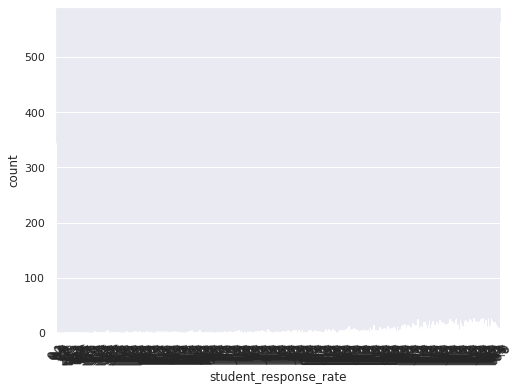

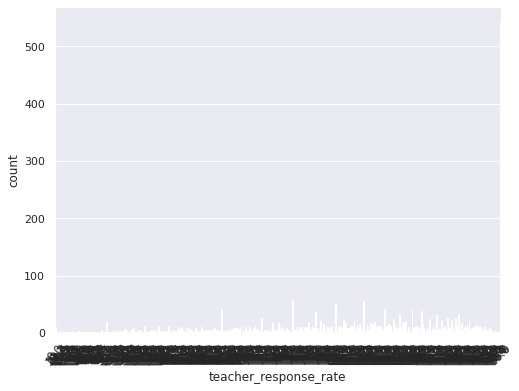

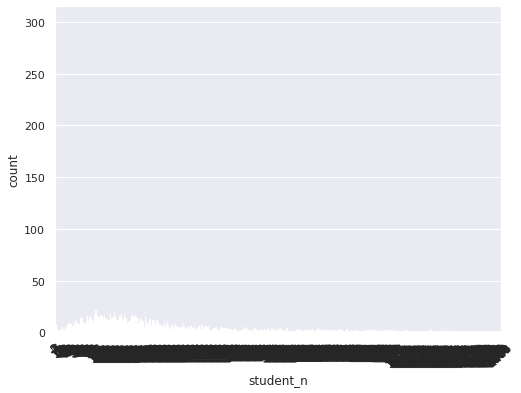

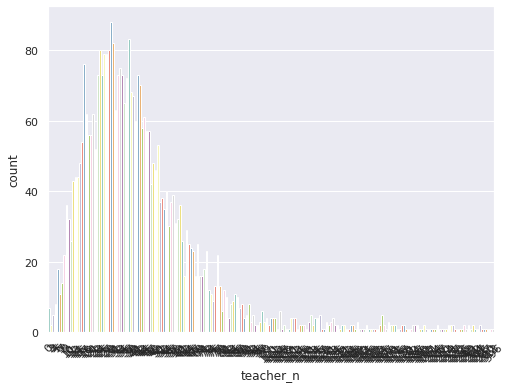

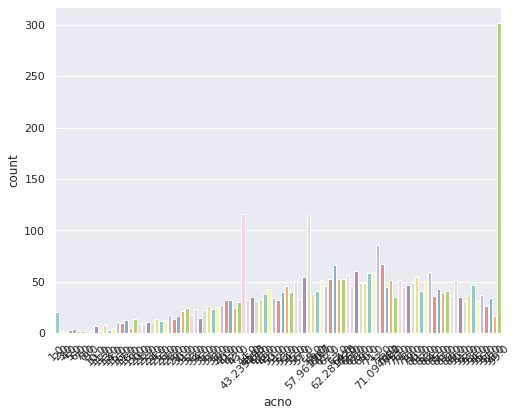

...

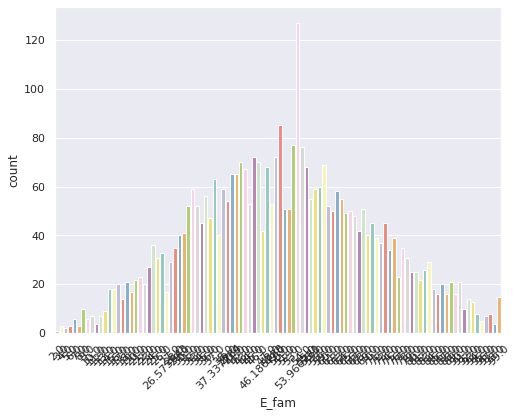

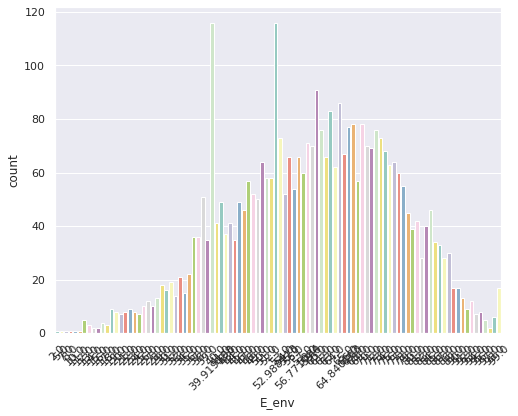

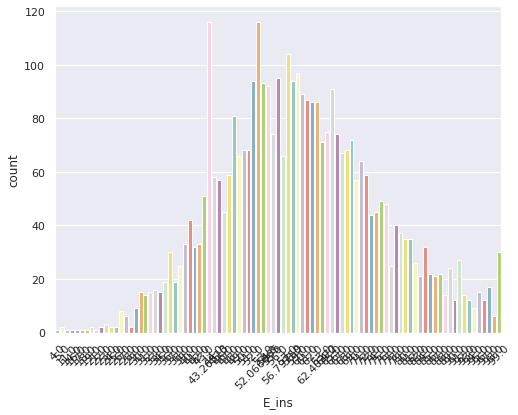

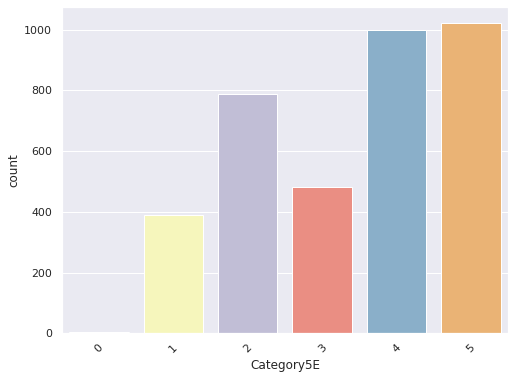

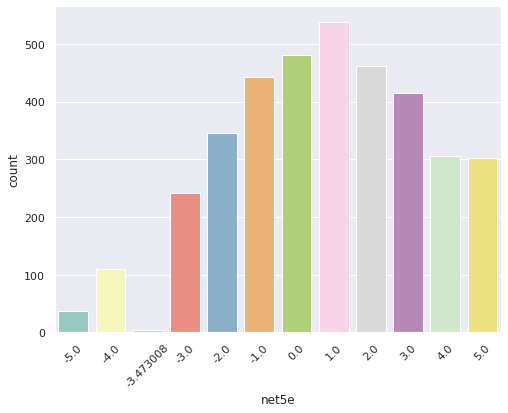

In [ ]:
#iterate over all features to view distributions
features = ['student_response_rate', 'teacher_response_rate',
       'student_n', 'teacher_n', 'acno', 'cdis', 'clar', 'colb', 'colr',
       'data', 'emhl', 'engg', 'engl', 'grit', 'humr', 'inf3', 'innv', 'ins3',
       'math', 'peer', 'perc', 'pgmc', 'pnfl', 'pres', 'prs2', 'prt4', 'prti',
       'pssm', 'qpd2', 'refd', 'rigr', 'safe', 'scie', 'scmt', 'sdis', 'socz',
       'ssaf', 'stdy', 'trpa', 'trpr', 'trte', 'trts', 'tsaf', 'E_ldr',
       'E_tch', 'E_fam', 'E_env', 'E_ins', 'Category5E', 'net5e']

for f in features:
  sns.countplot(x=f, data = illinois_df, palette='Set3')
  plt.xticks(rotation = 45)
  plt.show()

# **Feature Engineering**

*italicized text*

In [ ]:
#creating a zip code feature
illinois_df['zip_code'] = illinois_df['location'].str[-5:]
print(len(illinois_df['zip_code'].unique()))
illinois_df.head()

NameError: ignored

In [ ]:
#new df with only numeric columns- drop the location columns for now, 
#as we do not want them to impact results (for now)
il_num_df = illinois_df[features]
print('Numeric Data Frame Shape: ', il_num_df.shape)
il_num_df.info()

NameError: ignored

**Investigate Correlation**

In [ ]:
#investigate correlations
corr_df = il_num_df.corr(method='pearson')

#create a mask to display only lower triangle of the matrix
mask = np.zeros_like(corr_df)
mask[np.triu_indices_from(mask)] = True

#create heatmap
plt.figure(figsize=(10,10))
sns.heatmap(corr_df, cmap='Accent', vmax=1.0, vmin= -1.0, mask=mask,
            linewidths = 2.5)
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.show()

In [ ]:
#models can often be thrown off by highly correlated features, let's create
#another df that drops out some highly correlated features for later model
#comparison
corr = il_num_df.corr()

#select upper triangle of correlation matrix
upper = corr.where(np.triu(np.ones(corr.shape), k = 1).astype(np.bool))

#find index of feature columns  with correlations > 0.75
to_drop = [column for column in upper.columns if any(upper[column]>0.75)]

to_drop

In [ ]:
#create a new df by dropping these columns
corr_df = il_num_df.drop(il_num_df[to_drop], axis = 1)
corr_df = pd.DataFrame(data = corr_df)
print('The shape of the Data Frame with dropped correlated features is ',corr_df.shape)
print('The shape of the Data Frame with all features is ', il_num_df.shape)

**Clean/Combine Variables to try to improve results later on.**

In [ ]:
#descriptive statistics of il_num_df
illinois_df.describe()

In [ ]:
#for columns that had >10 unique values, let's combine ranges to make 
#less unique values.

#cleaning the student_response_rate column by 10%'s
illinois_df['range_student_response_rate'] = 0
range_student_response_rate_filter_method = lambda x:1 if x<10 else 2 if (x >= 10 and x <20) else 3 if (x>=20 and x<30) else 4 if (x>=30 and x<40) else 5 if (x>=40 and x<50) else 6 if (x>=50 and x<60) else 7 if (x>=60 and x<70) else 8 if (x>=70 and x<80) else 9 if (x>=80 and x<90) else 10 if (x>=90 and x<=100) else None
illinois_df['range_student_response_rate']=illinois_df['student_response_rate'].apply(range_student_response_rate_filter_method)
illinois_df.head()

In [ ]:
#cleaning the teacher_response_rate column by 10%'s
illinois_df['range_teacher_response_rate'] = 0
range_teacher_response_rate_filter_method = lambda x:1 if x<10 else 2 if (x >= 10 and x <20) else 3 if (x>=20 and x<30) else 4 if (x>=30 and x<40) else 5 if (x>=40 and x<50) else 6 if (x>=50 and x<60) else 7 if (x>=60 and x<70) else 8 if (x>=70 and x<80) else 9 if (x>=80 and x<90) else 10 if (x>=90 and x<=100) else None
illinois_df['range_teacher_response_rate']=illinois_df['teacher_response_rate'].apply(range_teacher_response_rate_filter_method)
illinois_df.head()

In [ ]:
#cleaning the student_n column by 10%'s
illinois_df['range_student_n'] = 0
range_student_n_filter_method = lambda x:1 if x<500 else 2 if (x >= 500 and x <1000) else 3 if (x>=1000 and x<1500) else 4 if (x>=1500 and x<2000) else 5 if (x>=2000 and x<2500) else 6 if (x>=2500 and x<3000) else 7 if (x>=3000 and x<3500) else 8 if (x>=3500 and x<4000) else 9 if (x>=4000 and x<4500) else 10 if (x>=4500 and x<=5000) else None
illinois_df['range_student_n']=illinois_df['student_n'].apply(range_student_n_filter_method)
illinois_df.head()

In [ ]:
#cleaning the teacher_n column by 10%'s
illinois_df['range_teacher_n'] = 0
range_teacher_n_filter_method = lambda x:1 if x<40 else 2 if (x >= 40 and x <80) else 3 if (x>=80 and x<120) else 4 if (x>=120 and x<160) else 5 if (x>=160 and x<200) else 6 if (x>=200 and x<240) else 7 if (x>=240 and x<280) else 8 if (x>=280 and x<320) else 9 if (x>=320 and x<360) else 10 if (x>=360 and x<=400) else None
illinois_df['range_teacher_n']=illinois_df['teacher_n'].apply(range_teacher_n_filter_method)
illinois_df.head()

In [ ]:
range_columns_dict={'acno': 'range_acno',
'cdis': 'range_cdis',
'clar': 'range_clar',
'colb': 'range_colb',
'colr': 'range_colr',
'data': 'range_data',
'emhl': 'range_emhl',
'engg': 'range_engg',
'engl': 'range_engl',
'grit': 'range_grit',
'humr': 'range_humr',
'inf3': 'range_inf3',
'innv': 'range_innv',
'ins3': 'range_ins3',
'math': 'range_math',
'peer': 'range_peer',
'perc': 'range_perc',
'pgmc': 'range_pgmc',
'pnfl': 'range_pnfl',
'pres': 'range_pres',
'prs2': 'range_prs2',
'prt4': 'range_prt4',
'prti': 'range_prti',
'pssm': 'range_pssm',
'qpd2': 'range_qpd2',
'refd': 'range_refd',
'rigr': 'range_rigr',
'safe': 'range_safe',
'scie': 'range_scie',
'scmt': 'range_scmt',
'sdis': 'range_sdis',
'socz': 'range_socz',
'ssaf': 'range_ssaf',
'stdy': 'range_stdy',
'trpa': 'range_trpa',
'trpr': 'range_trpr',
'trte': 'range_trte',
'trts': 'range_trts',
'tsaf': 'range_tsaf',
'E_ldr': 'range_E_ldr',
'E_tch': 'range_E_tch',
'E_fam': 'range_E_fam',
'E_env': 'range_E_env',
'E_ins': 'range_E_ins'}

for col, fil in range_columns_dict.items():
  illinois_df[fil] = 0
  method = lambda x:1 if x<10 else 2 if (x>=10 and x <20) else 3 if (x>=20 and x<30) else 4 if (x>=30 and x<40) else 5 if (x>=40 and x<50) else 6 if (x>=50 and x<60) else 7 if (x>=60 and x<70) else 8 if (x>=70 and x<80) else 9 if (x>=80 and x<90) else 10 if (x>=90 and x<=100) else None
  illinois_df[fil] = illinois_df[col].apply(method)

illinois_df.head()

In [ ]:
illinois_df.columns

In [ ]:
#create df of cleaned_data
cleaned_data =pd.DataFrame(data=illinois_df[[ 'Category5E', 'net5e', 'range_student_response_rate',
       'range_teacher_response_rate', 'range_student_n', 'range_teacher_n',
       'range_acno', 'range_cdis', 'range_clar', 'range_colr', 'range_data',
       'range_colb', 'range_emhl', 'range_engg', 'range_engl', 'range_grit',
       'range_humr', 'range_inf3', 'range_innv', 'range_ins3', 'range_math',
       'range_peer', 'range_perc', 'range_pgmc', 'range_pnfl', 'range_pres',
       'range_prs2', 'range_prt4', 'range_prti', 'range_pssm', 'range_qpd2',
       'range_refd', 'range_rigr', 'range_safe', 'range_scie', 'range_scmt',
       'range_sdis', 'range_socz', 'range_ssaf', 'range_stdy', 'range_trpa',
       'range_trpr', 'range_trte', 'range_trts', 'range_tsaf', 'range_E_ldr',
       'range_E_tch', 'range_E_fam', 'range_E_env', 'range_E_ins']])
cleaned_data.head()


In [ ]:
#iterate over cleaned features to view distributions
cleaned_features = ['Category5E', 'net5e', 'range_student_response_rate',
       'range_teacher_response_rate', 'range_student_n', 'range_teacher_n',
       'range_acno', 'range_cdis', 'range_clar', 'range_colr', 'range_data',
       'range_colb', 'range_emhl', 'range_engg', 'range_engl', 'range_grit',
       'range_humr', 'range_inf3', 'range_innv', 'range_ins3', 'range_math',
       'range_peer', 'range_perc', 'range_pgmc', 'range_pnfl', 'range_pres',
       'range_prs2', 'range_prt4', 'range_prti', 'range_pssm', 'range_qpd2',
       'range_refd', 'range_rigr', 'range_safe', 'range_scie', 'range_scmt',
       'range_sdis', 'range_socz', 'range_ssaf', 'range_stdy', 'range_trpa',
       'range_trpr', 'range_trte', 'range_trts', 'range_tsaf', 'range_E_ldr',
       'range_E_tch', 'range_E_fam', 'range_E_env', 'range_E_ins']
for f in cleaned_features:
  sns.countplot(x=f, data = cleaned_data, palette='Set3')
  plt.xticks(rotation = 45)
  plt.show()

**Investigate Cleaned Correlations**

In [ ]:
#investigate correlations
cleaned_corr_df = cleaned_data.corr(method='pearson')

#create a mask to display only lower triangle of the matrix
mask = np.zeros_like(cleaned_corr_df)
mask[np.triu_indices_from(mask)] = True

#create heatmap
plt.figure(figsize=(10,10))
sns.heatmap(cleaned_corr_df, cmap='Accent', vmax=1.0, vmin= -1.0, mask=mask,
            linewidths = 2.5)
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.show()

In [ ]:
#models can often be thrown off by highly correlated features, let's create
#another df that drops out some highly correlated features for later model
#comparison
cleaned_corr = cleaned_data.corr()

#select upper triangle of correlation matrix
upper = cleaned_corr.where(np.triu(np.ones(cleaned_corr.shape), k = 1).astype(np.bool))

#find index of feature columns  with correlations > 0.75
cleaned_to_drop = [column for column in upper.columns if any(upper[column]>0.75)]

cleaned_to_drop

In [ ]:
#create a new df by dropping these columns
corr_cleaned_data_df = cleaned_data.drop(cleaned_data[cleaned_to_drop], axis = 1)
corr_cleaned_data_df = pd.DataFrame(data = corr_cleaned_data_df)
print('The shape of the Cleaned Data Frame with dropped correlated features is ',corr_cleaned_data_df.shape)
print('The shape of the Cleaned Data Frame with all features is ', cleaned_data.shape)

# **Building Models**

**Model 1: K Means Clustering All Numeric Data**

Explained Variance Ratio (2 Compoenents):  [0.34894756 0.13976537]


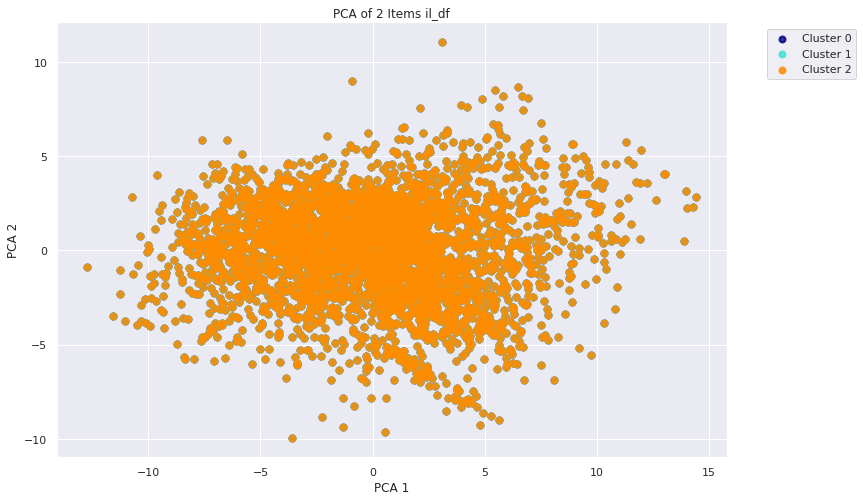

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, target_name in zip(colors, target_names):
  plt.scatter(pca_results[:,0], pca_results[:,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items il_df')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

Text(0, 0.5, 'Inertia')

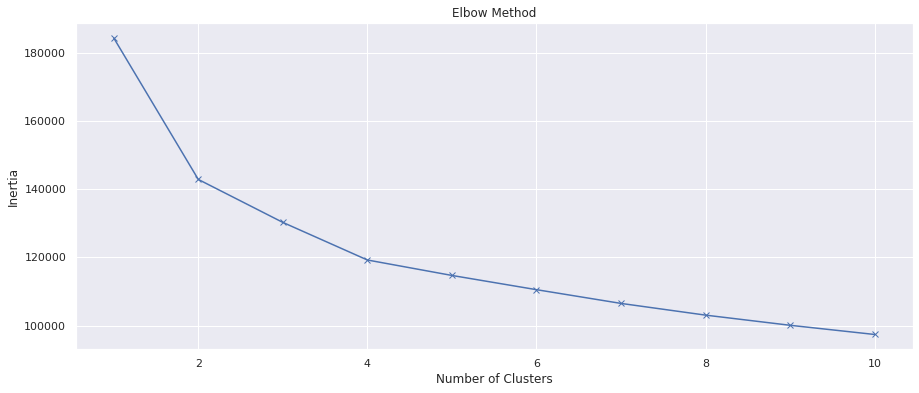

In [ ]:
#Tune Hyperparameters for KMeans
#find ideal number of k iteration
inertia = []
for i in range (1,11):
  kmeans = KMeans(n_clusters = i, init='k-means++', random_state=123)
  kmeans.fit(X_std)
  inertia.append(kmeans.inertia_)

#plot elbow curve
plt.figure(figsize=(15,6))
plt.plot(range(1,11), inertia, 'bx-')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

In [ ]:
#run k means on 3 clusters where there was sharpest decline in inertia
kmeans = KMeans(n_clusters=3, random_state=123)
model1_clusters = kmeans.fit_predict(X_std)

#Silhouette Score
model1_sscore = metrics.silhouette_score(X_std, model1_clusters, metric='euclidean')
print('Silhouette Score for Model 1: ', model1_sscore)
print()
#Calinski Harabasz Score
model1_chscore = metrics.calinski_harabasz_score(X_std, model1_clusters )
print('Calinski Harbasz Score for Model 1: ', model1_chscore)
print()
#Inertia for 3 Clusters
model1_inertia = kmeans.inertia_
print('Inertia for Model 1: ', model1_inertia)


Silhouette Score for Model 1:  0.15763957010560023

Calinski Harbasz Score for Model 1:  765.0587217119859

Inertia for Model 1:  130251.30464674633


Explained Variance Ratio (2 Compoenents):  [0.34894756 0.13976537]


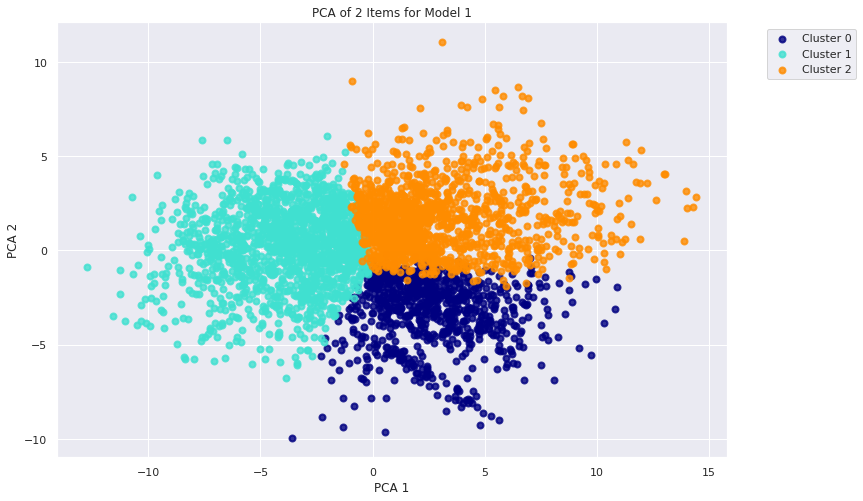

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model1_clusters == i,0], pca_results[model1_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items for Model 1')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model1_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 1 is: ', model1_explained_variance_ratio)

The Explained Variance Ratio of Model 1 is:  0.48871293872547183


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model1_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model1_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model1_cl_counts_df)
print('Number of Observations in Model 1: ',model1_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        772       1557       1358
Number of Observations in Model 1:  3687


**Model 2: K-Means with PCA**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#identify the ideal number of components to get 95% variance
n_components = X_std.shape[1]

#run PCA with all components
pca = PCA(n_components=n_components, random_state=123)
pca_results = pca.fit_transform(X_std)

#calculating the 95% variance
total_variance = sum(pca.explained_variance_)
print('Total Varaince in Dataset is: ', total_variance)
var_95 = total_variance * 0.95
print('The 95% variance we want to have is: ', var_95)

#create a df with the components and explained variance
a = zip(range(0, n_components), pca.explained_variance_)
a = pd.DataFrame(a, columns=['PCA Comp', 'Explained Variance'])

#trying to hit 95%
print("Variance explained with 5 n_compononets: ", sum(a["Explained Variance"][0:5]))
print("Variance explained with 10 n_compononets: ", sum(a["Explained Variance"][0:10]))
print("Variance explained with 15 n_compononets: ", sum(a["Explained Variance"][0:15]))
print("Variance explained with 20 n_compononets: ", sum(a["Explained Variance"][0:20]))
print("Variance explained with 25 n_compononets: ", sum(a["Explained Variance"][0:25]))
print("Variance explained with 30 n_compononets: ", sum(a["Explained Variance"][0:30]))
print("Variance explained with 35 n_compononets: ", sum(a["Explained Variance"][0:35]))
print("Variance explained with 40 n_compononets: ", sum(a["Explained Variance"][0:40]))


Total Varaince in Dataset is:  50.01356483993488
The 95% variance we want to have is:  47.512886597938135
Variance explained with 5 n_compononets:  33.83721439963639
Variance explained with 10 n_compononets:  39.99630373893289
Variance explained with 15 n_compononets:  43.53503397637678
Variance explained with 20 n_compononets:  45.60059852450261
Variance explained with 25 n_compononets:  46.99412453795724
Variance explained with 30 n_compononets:  48.059144582276666
Variance explained with 35 n_compononets:  48.936609310100565
Variance explained with 40 n_compononets:  49.596428939140566


In [ ]:
#trying to hit 95%. We know it's in between 25 & 30 components from above
print("Variance explained with 26 n_compononets: ", sum(a["Explained Variance"][0:26]))
print("Variance explained with 27 n_compononets: ", sum(a["Explained Variance"][0:27]))
print("Variance explained with 28 n_compononets: ", sum(a["Explained Variance"][0:28]))
print("Variance explained with 29 n_compononets: ", sum(a["Explained Variance"][0:29]))

Variance explained with 26 n_compononets:  47.22980550705103
Variance explained with 27 n_compononets:  47.45329244540858
Variance explained with 28 n_compononets:  47.670831611534844
Variance explained with 29 n_compononets:  47.86740761971339


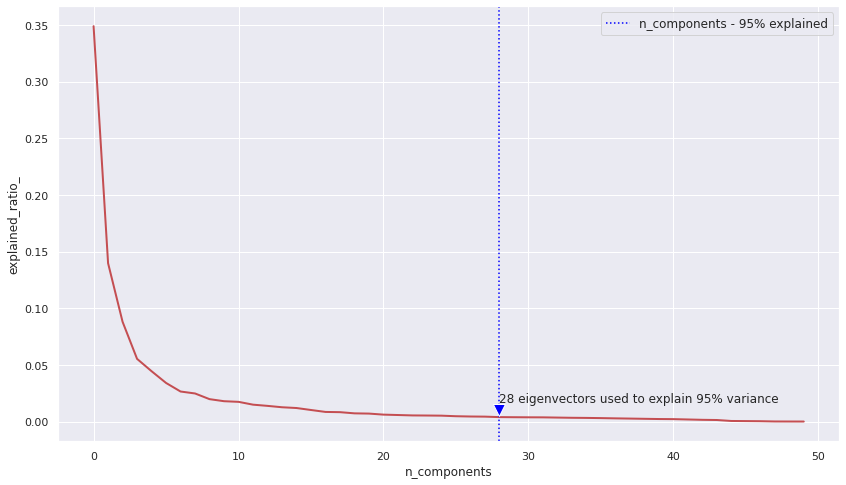

In [ ]:
# Plotting the Data
plt.figure(1, figsize=(14, 8))
plt.plot(pca.explained_variance_ratio_, linewidth=2, c="r")
plt.xlabel('n_components')
plt.ylabel('explained_ratio_')

# Plotting line with 95% e.v.
plt.axvline(28,linestyle=':', label='n_components - 95% explained', c ="blue")
plt.legend(prop=dict(size=12))

# adding arrow
plt.annotate('28 eigenvectors used to explain 95% variance', 
            xy=(28, pca.explained_variance_ratio_[28]), 
            xytext=(28, pca.explained_variance_ratio_[10]),
            arrowprops=dict(facecolor='blue', shrink=0.05))

plt.show()

Text(0.5, 1.0, 'Inertia Plot per k')

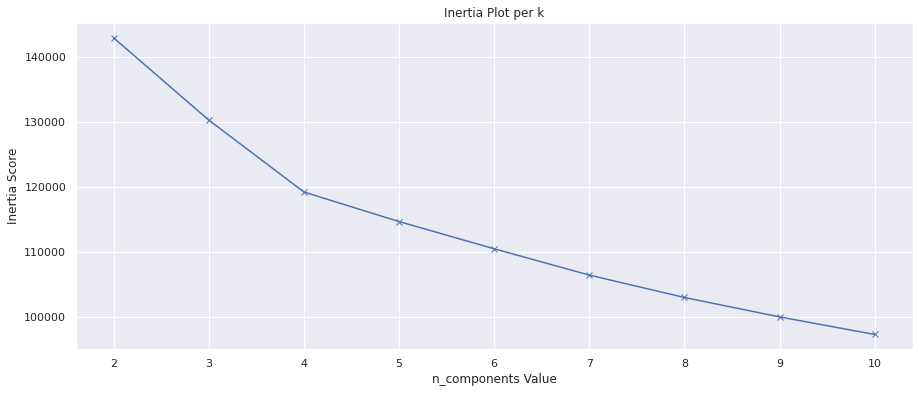

In [ ]:
#Running PCA again
pca = PCA(n_components=28, random_state=123)
pca_results = pca.fit_transform(X_std)

inertia = []
num_clusters = range(2,11)
#running K-Means
for f in num_clusters:
  kmeans = KMeans(n_clusters=f, random_state=123)
  kmeans = kmeans.fit(X_std)
  u = kmeans.inertia_
  inertia.append(u)

#Create an elbow/scree plot for Inertia
fig, (ax1) = plt.subplots(1, figsize=(15,6))
xx = np.arange(len(num_clusters))
ax1.plot(xx, inertia, 'bx-')
ax1.set_xticks(xx)
ax1.set_xticklabels(num_clusters)
plt.xlabel('n_components Value')
plt.ylabel('Inertia Score')
plt.title("Inertia Plot per k")

In [ ]:
#Run PCA again
pca = PCA(n_components=28, random_state=123)
pca_results = pca.fit_transform(X_std)

#Run KMeans with PCA
kmeans = KMeans(n_clusters=3, random_state=123)
#'predictions' for new data
model2_clusters = kmeans.fit_predict(pca_results)

#Silhouette Score
model2_sscore = metrics.silhouette_score(pca_results, model2_clusters, metric='euclidean')
print('Silhouette Score for Model 2: ', model2_sscore)
print()
#Calinski Harabasz Score
model2_chscore = metrics.calinski_harabasz_score(pca_results, model2_clusters )
print('Calinski Harbasz Score for Model 2: ', model2_chscore)
print()
#Inertia for 3 Clusters
model2_inertia = kmeans.inertia_
print('Inertia for Model 2: ', model2_inertia)
print()
#explained variance ration
model2_explained_variance_ratio = sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 2 is: ', model2_explained_variance_ratio)

Silhouette Score for Model 2:  0.16605854621701577

Calinski Harbasz Score for Model 2:  818.8389521563823

Inertia for Model 2:  121637.18111125325

The Explained Variance Ratio of Model 2 is:  0.9531300647293581


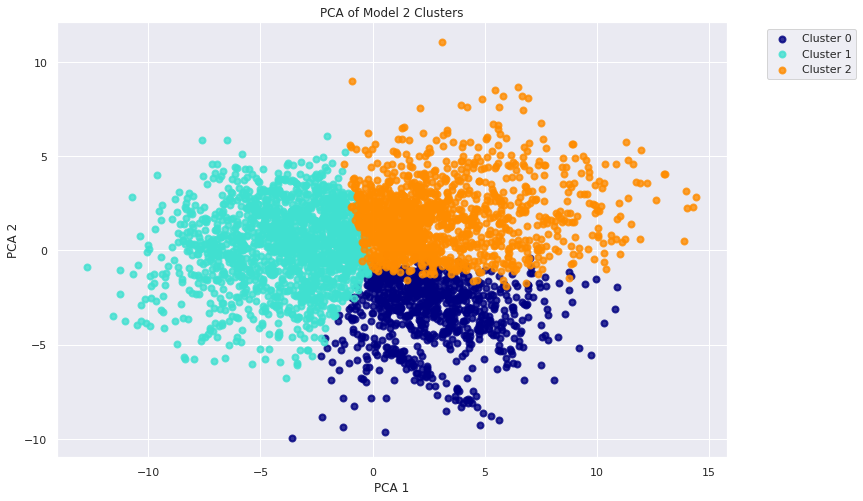

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model2_clusters == i,0], pca_results[model2_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 2 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model2_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model2_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model2_cl_counts_df)
print('Number of Observations in Model 2: ',model2_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        773       1556       1358
Number of Observations in Model 2:  3687


**Model 3: KMeans on All Cleaned Data**

Explained Variance Ratio (2 Compoenents):  [0.34188531 0.13691726]


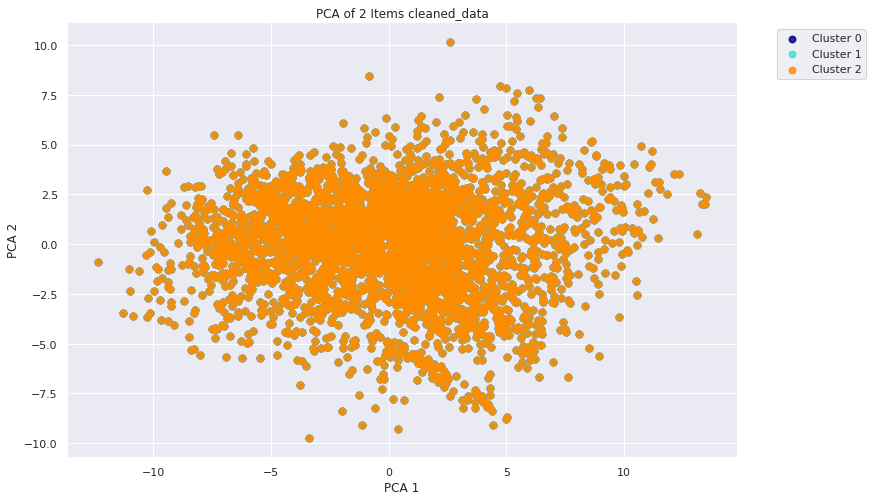

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, target_name in zip(colors, target_names):
  plt.scatter(pca_results[:,0], pca_results[:,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items cleaned_data')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

Text(0, 0.5, 'Inertia')

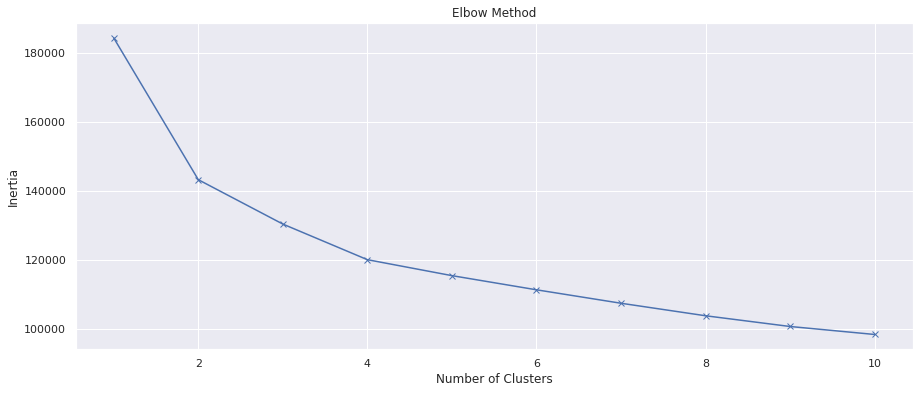

In [ ]:
#Tune Hyperparameters for KMeans
#find ideal number of k iteration
inertia = []
for i in range (1,11):
  kmeans = KMeans(n_clusters = i, init='k-means++', random_state=123)
  kmeans.fit(X_std)
  inertia.append(kmeans.inertia_)

#plot elbow curve
plt.figure(figsize=(15,6))
plt.plot(range(1,11), inertia, 'bx-')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

In [ ]:
#'predictions' for new 
kmeans = KMeans(n_clusters=3, random_state=123)
kmeans = kmeans.fit(X_std)
#'predictions' for new data
model3_clusters = kmeans.predict(X_std)

#Silhouette Score
model3_sscore = metrics.silhouette_score(X_std, model3_clusters, metric='euclidean')
print('Silhouette Score for Model 3: ', model3_sscore)
print()
#Calinski Harabasz Score
model3_chscore = metrics.calinski_harabasz_score(X_std, model3_clusters )
print('Calinski Harbasz Score for Model 3: ', model3_chscore)
print()
#Inertia for 3 Clusters
model3_inertia = kmeans.inertia_
print('Inertia for Model 3: ', model3_inertia)

Silhouette Score for Model 3:  0.15918079480290667

Calinski Harbasz Score for Model 3:  763.4404010864702

Inertia for Model 3:  130332.16950900054


Explained Variance Ratio (2 Compoenents):  [0.34188531 0.13691726]


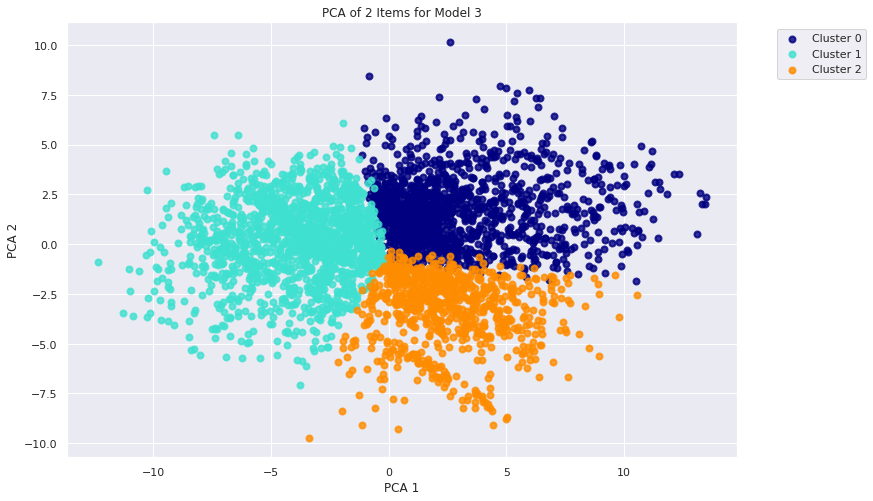

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model3_clusters == i,0], pca_results[model3_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items for Model 3')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model3_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 3 is: ', model3_explained_variance_ratio)

The Explained Variance Ratio of Model 3 is:  0.4788025692096543


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model3_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model3_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model3_cl_counts_df)
print('Number of Observations in Model 3: ',model3_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1370       1550        767
Number of Observations in Model 3:  3687


**Model 4: K-Means Clustering with Cleaned Data & PCA**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#identify the ideal number of components to get 95% variance
n_components = X_std.shape[1]

#run PCA with all components
pca = PCA(n_components=n_components, random_state=123)
pca_results = pca.fit_transform(X_std)

#calculating the 95% variance
total_variance = sum(pca.explained_variance_)
print('Total Varaince in Dataset is: ', total_variance)
var_95 = total_variance * 0.95
print('The 95% variance we want to have is: ', var_95)

#create a df with the components and explained variance
a = zip(range(0, n_components), pca.explained_variance_)
a = pd.DataFrame(a, columns=['PCA Comp', 'Explained Variance'])

#trying to hit 95%
print("Variance explained with 5 n_compononets: ", sum(a["Explained Variance"][0:5]))
print("Variance explained with 10 n_compononets: ", sum(a["Explained Variance"][0:10]))
print("Variance explained with 15 n_compononets: ", sum(a["Explained Variance"][0:15]))
print("Variance explained with 20 n_compononets: ", sum(a["Explained Variance"][0:20]))
print("Variance explained with 25 n_compononets: ", sum(a["Explained Variance"][0:25]))
print("Variance explained with 30 n_compononets: ", sum(a["Explained Variance"][0:30]))
print("Variance explained with 35 n_compononets: ", sum(a["Explained Variance"][0:35]))
print("Variance explained with 40 n_compononets: ", sum(a["Explained Variance"][0:40]))

Total Varaince in Dataset is:  50.01356483993494
The 95% variance we want to have is:  47.51288659793819
Variance explained with 5 n_compononets:  33.23270171063011
Variance explained with 10 n_compononets:  39.32895480802032
Variance explained with 15 n_compononets:  42.896490042689216
Variance explained with 20 n_compononets:  45.03261644756665
Variance explained with 25 n_compononets:  46.52425023555487
Variance explained with 30 n_compononets:  47.67975990722968
Variance explained with 35 n_compononets:  48.62650478777171
Variance explained with 40 n_compononets:  49.37497396905264


In [ ]:
print("Variance explained with 26 n_compononets: ", sum(a["Explained Variance"][0:26]))
print("Variance explained with 27 n_compononets: ", sum(a["Explained Variance"][0:27]))
print("Variance explained with 28 n_compononets: ", sum(a["Explained Variance"][0:28]))
print("Variance explained with 29 n_compononets: ", sum(a["Explained Variance"][0:29]))

Variance explained with 26 n_compononets:  46.779922896484244
Variance explained with 27 n_compononets:  47.016511237772896
Variance explained with 28 n_compononets:  47.25185719349398
Variance explained with 29 n_compononets:  47.46841768025431


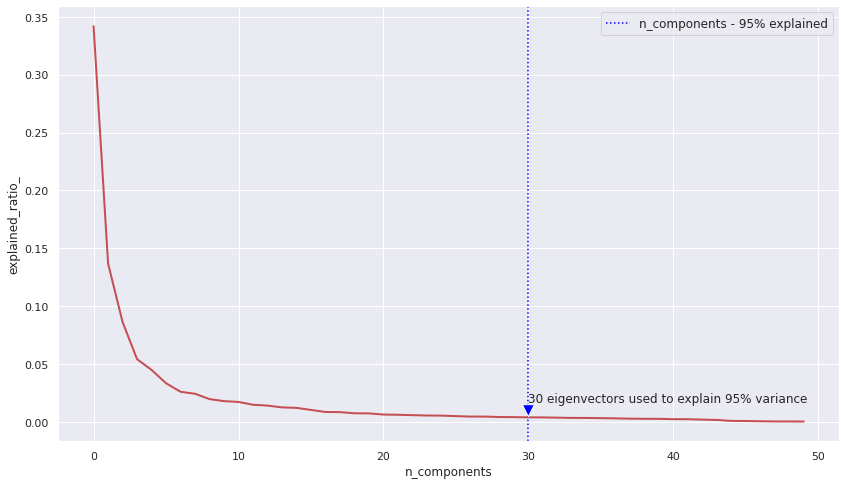

In [ ]:
# Plotting the Data
plt.figure(1, figsize=(14, 8))
plt.plot(pca.explained_variance_ratio_, linewidth=2, c="r")
plt.xlabel('n_components')
plt.ylabel('explained_ratio_')

# Plotting line with 95% e.v.
plt.axvline(30,linestyle=':', label='n_components - 95% explained', c ="blue")
plt.legend(prop=dict(size=12))

# adding arrow
plt.annotate('30 eigenvectors used to explain 95% variance',
             xy=(30, pca.explained_variance_ratio_[30]),
             xytext=(30, pca.explained_variance_ratio_[10]),
             arrowprops=dict(facecolor='blue', shrink=0.05))

plt.show()

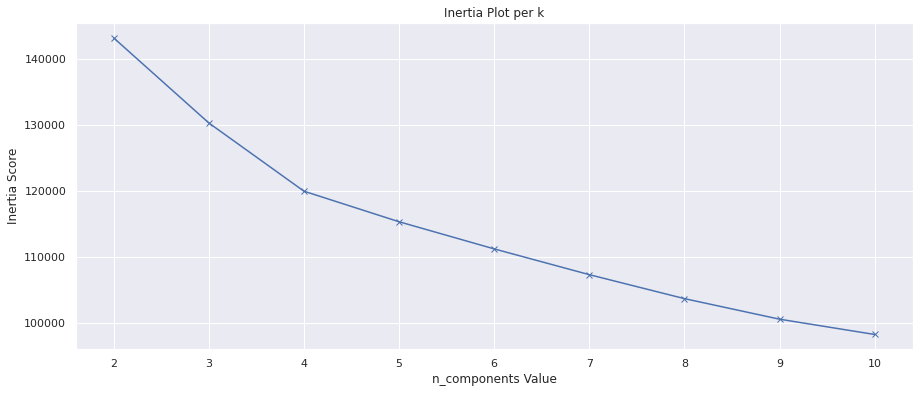

In [ ]:
#Running PCA again
pca = PCA(n_components=30, random_state=123)
pca_results = pca.fit_transform(X_std)

inertia = []
num_clusters = range(2,11)
#running K-Means
for f in num_clusters:
  kmeans = KMeans(n_clusters=f, random_state=123)
  kmeans = kmeans.fit(X_std)
  u = kmeans.inertia_
  inertia.append(u)

#Create an elbow/scree plot for Inertia
fig, (ax1) = plt.subplots(1, figsize=(15,6))
xx = np.arange(len(num_clusters))
ax1.plot(xx, inertia, 'bx-')
ax1.set_xticks(xx)
ax1.set_xticklabels(num_clusters)
plt.xlabel('n_components Value')
plt.ylabel('Inertia Score')
plt.title("Inertia Plot per k")
plt.show()

In [ ]:
#Run PCA again
pca = PCA(n_components=30, random_state=123)
pca_results = pca.fit_transform(X_std)

#Run KMeans with PCA
kmeans = KMeans(n_clusters=3, random_state=123)
#'predictions' for new data
model4_clusters = kmeans.fit_predict(pca_results)

#Silhouette Score
model4_sscore = metrics.silhouette_score(pca_results, model4_clusters, metric='euclidean')
print('Silhouette Score for Model 4: ', model4_sscore)
print()
#Calinski Harabasz Score
model4_chscore = metrics.calinski_harabasz_score(pca_results, model4_clusters )
print('Calinski Harbasz Score for Model 4: ', model4_chscore)
print()
#Inertia for 3 Clusters
model4_inertia = kmeans.inertia_
print('Inertia for Model 4: ', model4_inertia)
print()
#explained variance ration
model4_explained_variance_ratio = sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 4 is: ', model4_explained_variance_ratio)

Silhouette Score for Model 4:  0.1678200546678938

Calinski Harbasz Score for Model 4:  816.8714359018891

Inertia for Model 4:  121748.75517709857

The Explained Variance Ratio of Model 4 is:  0.9532989180137271


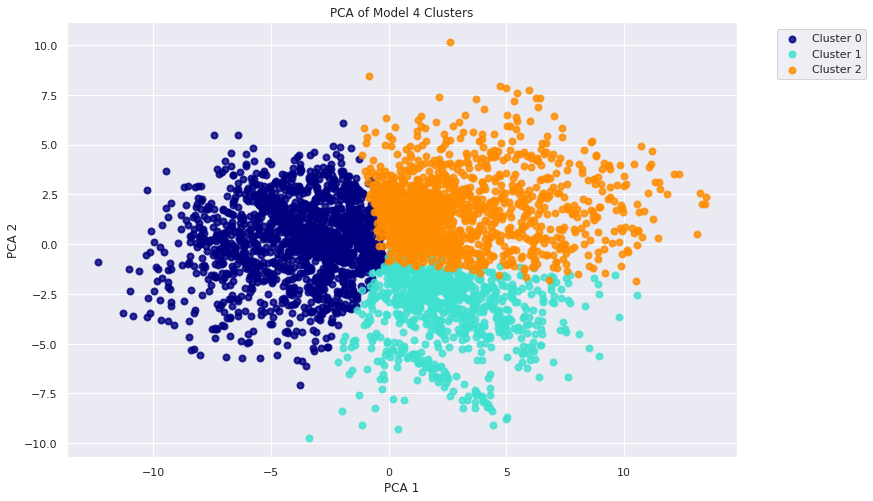

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model4_clusters == i,0], pca_results[model4_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 4 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model4_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model4_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model4_cl_counts_df)
print('Number of Observations in Model 4: ',model4_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1555        766       1366
Number of Observations in Model 4:  3687


**Model 5: KMeans on Lower Associated Data**

Explained Variance Ratio (2 Compoenents):  [0.28965774 0.13141593]


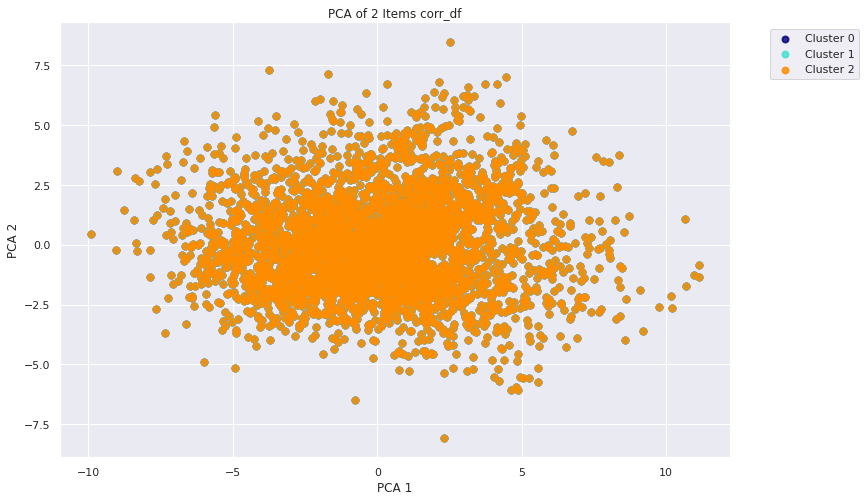

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, target_name in zip(colors, target_names):
  plt.scatter(pca_results[:,0], pca_results[:,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items corr_df')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()


Text(0, 0.5, 'Inertia')

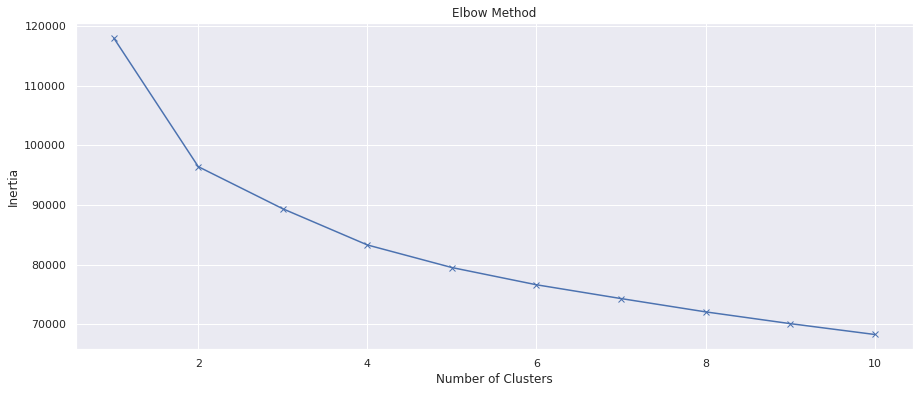

In [ ]:
#Tune Hyperparameters for KMeans
#find ideal number of k iteration
inertia = []
for i in range (1,11):
  kmeans = KMeans(n_clusters = i, init='k-means++', random_state=123)
  kmeans.fit(X_std)
  inertia.append(kmeans.inertia_)

#plot elbow curve
plt.figure(figsize=(15,6))
plt.plot(range(1,11), inertia, 'bx-')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

In [ ]:
#'predictions' for new 
kmeans = KMeans(n_clusters=3, random_state=123)
kmeans = kmeans.fit(X_std)
#'predictions' for new data
model5_clusters = kmeans.predict(X_std)

#Silhouette Score
model5_sscore = metrics.silhouette_score(X_std, model5_clusters, metric='euclidean')
print('Silhouette Score for Model 5: ', model5_sscore)
print()
#Calinski Harabasz Score
model5_chscore = metrics.calinski_harabasz_score(X_std, model5_clusters )
print('Calinski Harbasz Score for Model 5: ', model5_chscore)
print()
#Inertia for 3 Clusters
model5_inertia = kmeans.inertia_
print('Inertia for Model 5: ', model5_inertia)

Silhouette Score for Model 5:  0.10947740108046916

Calinski Harbasz Score for Model 5:  590.1854873509639

Inertia for Model 5:  89354.51819194971


Explained Variance Ratio (2 Compoenents):  [0.28965774 0.13141593]


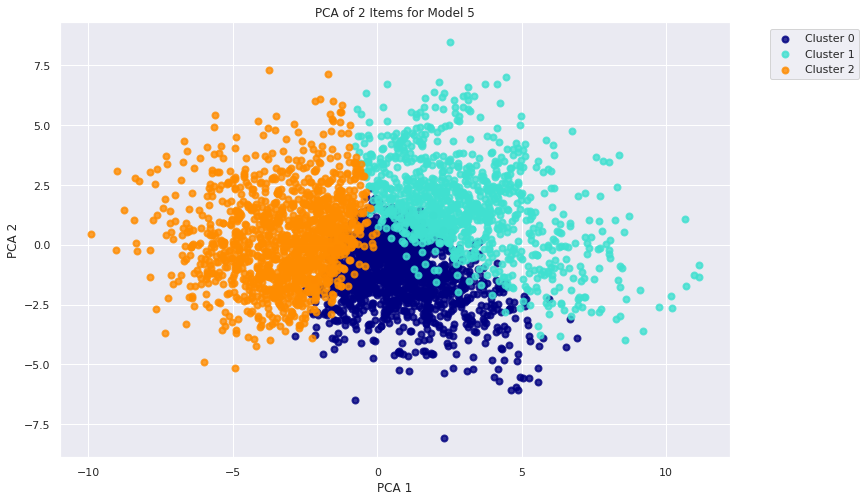

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model5_clusters == i,0], pca_results[model5_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items for Model 5')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model5_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 5 is: ', model5_explained_variance_ratio)

The Explained Variance Ratio of Model 5 is:  0.4210736626529859


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model5_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model5_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model5_cl_counts_df)
print('Number of Observations in Model 5: ',model5_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1422        977       1288
Number of Observations in Model 5:  3687


**Model 6: K-Means Clustering with Lower Associated Data & PCA**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#identify the ideal number of components to get 95% variance
n_components = X_std.shape[1]

#run PCA with all components
pca = PCA(n_components=n_components, random_state=123)
pca_results = pca.fit_transform(X_std)

#calculating the 95% variance
total_variance = sum(pca.explained_variance_)
print('Total Varaince in Dataset is: ', total_variance)
var_95 = total_variance * 0.95
print('The 95% variance we want to have is: ', var_95)

#create a df with the components and explained variance
a = zip(range(0, n_components), pca.explained_variance_)
a = pd.DataFrame(a, columns=['PCA Comp', 'Explained Variance'])

#trying to hit 95%
print("Variance explained with 5 n_compononets: ", sum(a["Explained Variance"][0:5]))
print("Variance explained with 10 n_compononets: ", sum(a["Explained Variance"][0:10]))
print("Variance explained with 15 n_compononets: ", sum(a["Explained Variance"][0:15]))
print("Variance explained with 20 n_compononets: ", sum(a["Explained Variance"][0:20]))
print("Variance explained with 25 n_compononets: ", sum(a["Explained Variance"][0:25]))
print("Variance explained with 30 n_compononets: ", sum(a["Explained Variance"][0:30]))
print("Variance explained with 35 n_compononets: ", sum(a["Explained Variance"][0:35]))
print("Variance explained with 40 n_compononets: ", sum(a["Explained Variance"][0:40]))

Total Varaince in Dataset is:  32.00868149755829
The 95% variance we want to have is:  30.408247422680375
Variance explained with 5 n_compononets:  20.325360469970406
Variance explained with 10 n_compononets:  25.38447799421876
Variance explained with 15 n_compononets:  28.02967437038471
Variance explained with 20 n_compononets:  29.698947091080562
Variance explained with 25 n_compononets:  30.884591930874137
Variance explained with 30 n_compononets:  31.72896086570188
Variance explained with 35 n_compononets:  32.00868149755829
Variance explained with 40 n_compononets:  32.00868149755829


In [ ]:
print("Variance explained with 21 n_compononets: ", sum(a["Explained Variance"][0:21]))
print("Variance explained with 22 n_compononets: ", sum(a["Explained Variance"][0:22]))
print("Variance explained with 23 n_compononets: ", sum(a["Explained Variance"][0:23]))
print("Variance explained with 24 n_compononets: ", sum(a["Explained Variance"][0:24]))

Variance explained with 21 n_compononets:  29.96961571552497
Variance explained with 22 n_compononets:  30.211946442191994
Variance explained with 23 n_compononets:  30.449042022951247
Variance explained with 24 n_compononets:  30.679800574899012


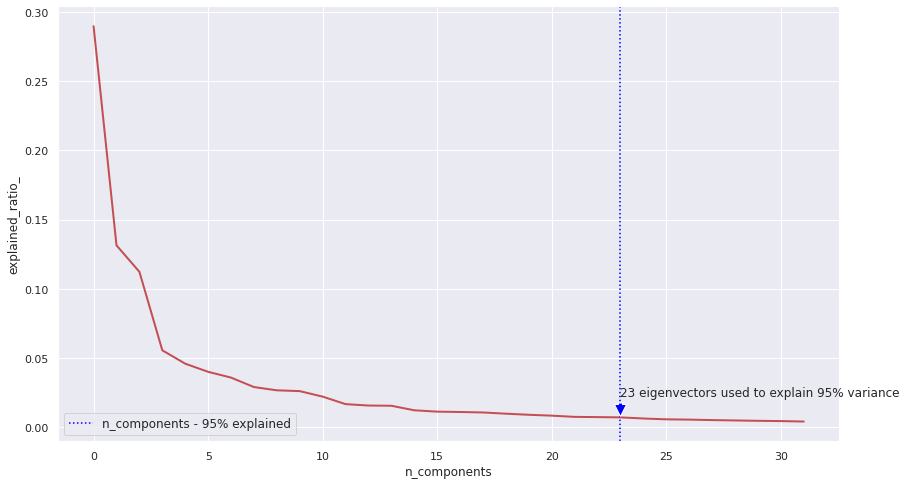

In [ ]:
# Plotting the Data
plt.figure(1, figsize=(14, 8))
plt.plot(pca.explained_variance_ratio_, linewidth=2, c="r")
plt.xlabel('n_components')
plt.ylabel('explained_ratio_')

# Plotting line with 95% e.v.
plt.axvline(23,linestyle=':', label='n_components - 95% explained', c ="blue")
plt.legend(prop=dict(size=12))

# adding arrow
plt.annotate('23 eigenvectors used to explain 95% variance', 
            xy=(23, pca.explained_variance_ratio_[23]), 
            xytext=(23, pca.explained_variance_ratio_[10]),
            arrowprops=dict(facecolor='blue', shrink=0.05))

plt.show()

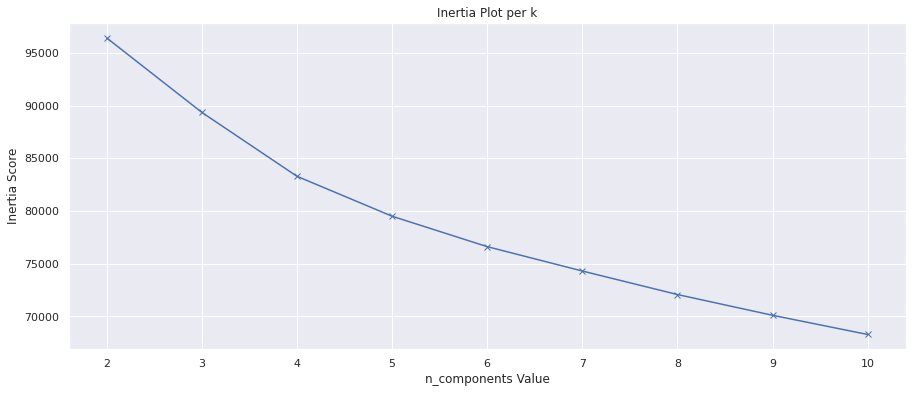

In [ ]:
#Running PCA again
pca = PCA(n_components=23, random_state=123)
pca_results = pca.fit_transform(X_std)

inertia = []
num_clusters = range(2,11)
#running K-Means
for f in num_clusters:
  kmeans = KMeans(n_clusters=f, random_state=123)
  kmeans = kmeans.fit(X_std)
  u = kmeans.inertia_
  inertia.append(u)

#Create an elbow/scree plot for Inertia
fig, (ax1) = plt.subplots(1, figsize=(15,6))
xx = np.arange(len(num_clusters))
ax1.plot(xx, inertia, 'bx-')
ax1.set_xticks(xx)
ax1.set_xticklabels(num_clusters)
plt.xlabel('n_components Value')
plt.ylabel('Inertia Score')
plt.title("Inertia Plot per k")
plt.show()

In [ ]:
#Run PCA again
pca = PCA(n_components=23, random_state=123)
pca_results = pca.fit_transform(X_std)

#Run KMeans with PCA
kmeans = KMeans(n_clusters=3, random_state=123)
#'predictions' for new data
model6_clusters = kmeans.fit_predict(pca_results)

#Silhouette Score
model6_sscore = metrics.silhouette_score(pca_results, model6_clusters, metric='euclidean')
print('Silhouette Score for Model 6: ', model6_sscore)
print()
#Calinski Harabasz Score
model6_chscore = metrics.calinski_harabasz_score(pca_results, model6_clusters )
print('Calinski Harbasz Score for Model 6: ', model6_chscore)
print()
#Inertia for 3 Clusters
model6_inertia = kmeans.inertia_
print('Inertia for Model 6: ', model6_inertia)
print()
#explained variance ration
model6_explained_variance_ratio = sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 6 is: ', model6_explained_variance_ratio)

Silhouette Score for Model 6:  0.11646720147340174

Calinski Harbasz Score for Model 6:  630.5044706800463

Inertia for Model 6:  83614.48222201703

The Explained Variance Ratio of Model 6 is:  0.9512744854946291


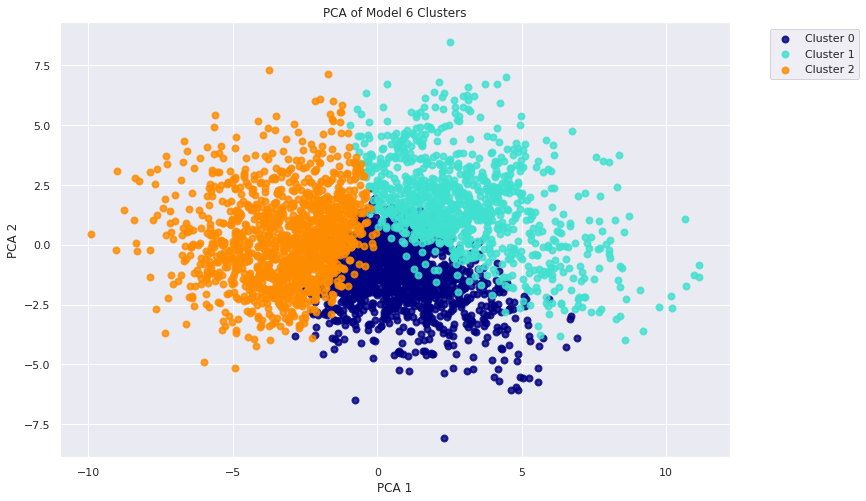

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model6_clusters == i,0], pca_results[model6_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 6 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model6_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model6_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model6_cl_counts_df)
print('Number of Observations in Model 6: ',model6_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1424        975       1288
Number of Observations in Model 6:  3687


**Model 7: KMeans on Lower Associated Cleaned Data**

Explained Variance Ratio (2 Compoenents):  [0.29759388 0.12628928]


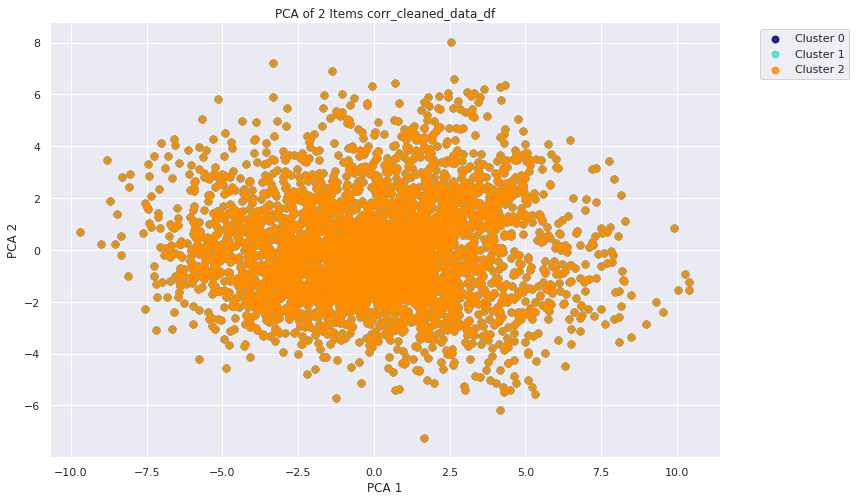

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, target_name in zip(colors, target_names):
  plt.scatter(pca_results[:,0], pca_results[:,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items corr_cleaned_data_df')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()


Text(0, 0.5, 'Inertia')

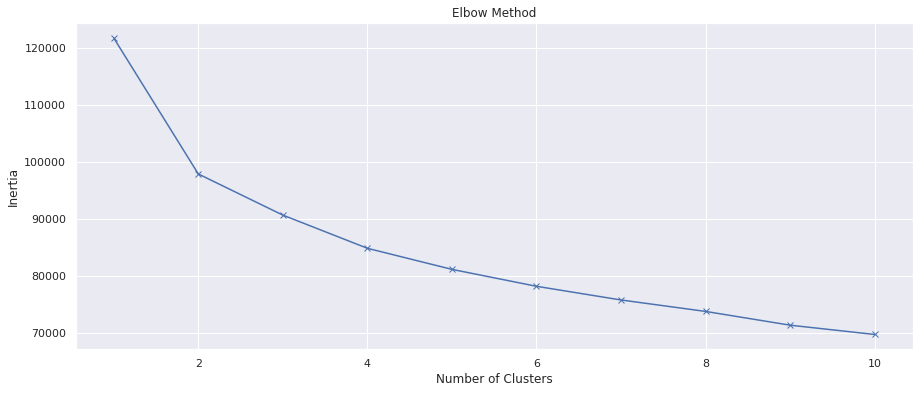

In [ ]:
#Tune Hyperparameters for KMeans
#find ideal number of k iteration
inertia = []
for i in range (1,11):
  kmeans = KMeans(n_clusters = i, init='k-means++', random_state=123)
  kmeans.fit(X_std)
  inertia.append(kmeans.inertia_)

#plot elbow curve
plt.figure(figsize=(15,6))
plt.plot(range(1,11), inertia, 'bx-')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

In [ ]:
#'predictions' for new 
kmeans = KMeans(n_clusters=3, random_state=123)
kmeans = kmeans.fit(X_std)
#'predictions' for new data
model7_clusters = kmeans.predict(X_std)

#Silhouette Score
model7_sscore = metrics.silhouette_score(X_std, model7_clusters, metric='euclidean')
print('Silhouette Score for Model 7: ', model7_sscore)
print()
#Calinski Harabasz Score
model7_chscore = metrics.calinski_harabasz_score(X_std, model7_clusters )
print('Calinski Harbasz Score for Model 7: ', model7_chscore)
print()
#Inertia for 3 Clusters
model7_inertia = kmeans.inertia_
print('Inertia for Model 7: ', model7_inertia)

Silhouette Score for Model 7:  0.12810516799669222

Calinski Harbasz Score for Model 7:  629.5408639983622

Inertia for Model 7:  90679.45639281515


Explained Variance Ratio (2 Compoenents):  [0.29759388 0.12628928]


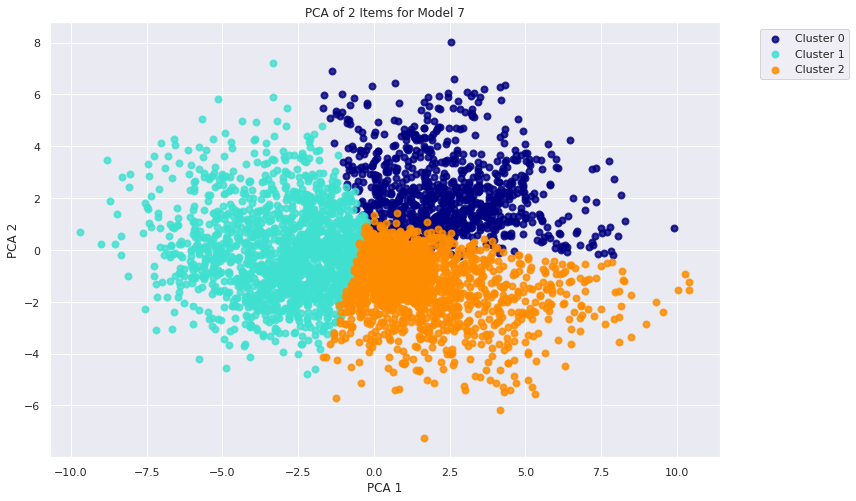

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model7_clusters == i,0], pca_results[model7_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of 2 Items for Model 7')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model7_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 7 is: ', model7_explained_variance_ratio)

The Explained Variance Ratio of Model 7 is:  0.423883158657148


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model7_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model7_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model7_cl_counts_df)
print('Number of Observations in Model 7: ',model7_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        870       1464       1353
Number of Observations in Model 7:  3687


**Model 8: K-Means Clustering with Lower Associated Cleaned Data & PCA**

In [ ]:
#set features
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#identify the ideal number of components to get 95% variance
n_components = X_std.shape[1]

#run PCA with all components
pca = PCA(n_components=n_components, random_state=123)
pca_results = pca.fit_transform(X_std)

#calculating the 95% variance
total_variance = sum(pca.explained_variance_)
print('Total Varaince in Dataset is: ', total_variance)
var_95 = total_variance * 0.95
print('The 95% variance we want to have is: ', var_95)

#create a df with the components and explained variance
a = zip(range(0, n_components), pca.explained_variance_)
a = pd.DataFrame(a, columns=['PCA Comp', 'Explained Variance'])

#trying to hit 95%
print("Variance explained with 5 n_compononets: ", sum(a["Explained Variance"][0:5]))
print("Variance explained with 10 n_compononets: ", sum(a["Explained Variance"][0:10]))
print("Variance explained with 15 n_compononets: ", sum(a["Explained Variance"][0:15]))
print("Variance explained with 20 n_compononets: ", sum(a["Explained Variance"][0:20]))
print("Variance explained with 25 n_compononets: ", sum(a["Explained Variance"][0:25]))
print("Variance explained with 30 n_compononets: ", sum(a["Explained Variance"][0:30]))
print("Variance explained with 35 n_compononets: ", sum(a["Explained Variance"][0:35]))
print("Variance explained with 40 n_compononets: ", sum(a["Explained Variance"][0:40]))

Total Varaince in Dataset is:  33.00895279435705
The 95% variance we want to have is:  31.358505154639197
Variance explained with 5 n_compononets:  20.768540182541066
Variance explained with 10 n_compononets:  25.823675204237905
Variance explained with 15 n_compononets:  28.55264742074008
Variance explained with 20 n_compononets:  30.309328464708862
Variance explained with 25 n_compononets:  31.60187193110812
Variance explained with 30 n_compononets:  32.551247388240824
Variance explained with 35 n_compononets:  33.00895279435705
Variance explained with 40 n_compononets:  33.00895279435705


In [ ]:
print("Variance explained with 21 n_compononets: ", sum(a["Explained Variance"][0:21]))
print("Variance explained with 22 n_compononets: ", sum(a["Explained Variance"][0:22]))
print("Variance explained with 23 n_compononets: ", sum(a["Explained Variance"][0:23]))
print("Variance explained with 24 n_compononets: ", sum(a["Explained Variance"][0:24]))

Variance explained with 21 n_compononets:  30.601904105411677
Variance explained with 22 n_compononets:  30.867456551477254
Variance explained with 23 n_compononets:  31.12696624061744
Variance explained with 24 n_compononets:  31.380622908937625


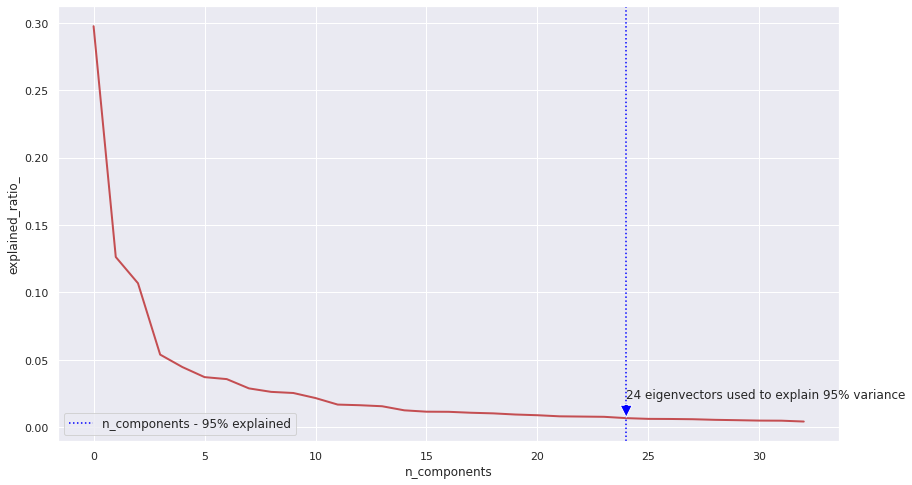

In [ ]:
# Plotting the Data
plt.figure(1, figsize=(14, 8))
plt.plot(pca.explained_variance_ratio_, linewidth=2, c="r")
plt.xlabel('n_components')
plt.ylabel('explained_ratio_')

# Plotting line with 95% e.v.
plt.axvline(24,linestyle=':', label='n_components - 95% explained', c ="blue")
plt.legend(prop=dict(size=12))

# adding arrow
plt.annotate('24 eigenvectors used to explain 95% variance', 
            xy=(24, pca.explained_variance_ratio_[24]), 
            xytext=(24, pca.explained_variance_ratio_[10]),
            arrowprops=dict(facecolor='blue', shrink=0.05))

plt.show()

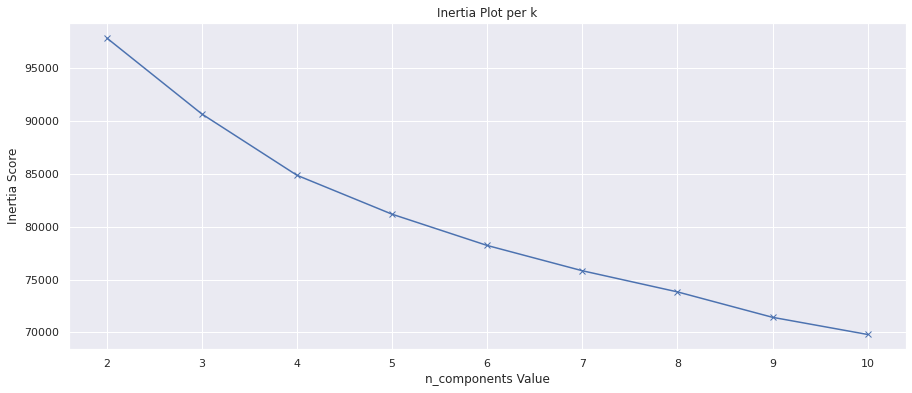

In [ ]:
#Running PCA again
pca = PCA(n_components=24, random_state=123)
pca_results = pca.fit_transform(X_std)

inertia = []
num_clusters = range(2,11)
#running K-Means
for f in num_clusters:
  kmeans = KMeans(n_clusters=f, random_state=123)
  kmeans = kmeans.fit(X_std)
  u = kmeans.inertia_
  inertia.append(u)

#Create an elbow/scree plot for Inertia
fig, (ax1) = plt.subplots(1, figsize=(15,6))
xx = np.arange(len(num_clusters))
ax1.plot(xx, inertia, 'bx-')
ax1.set_xticks(xx)
ax1.set_xticklabels(num_clusters)
plt.xlabel('n_components Value')
plt.ylabel('Inertia Score')
plt.title("Inertia Plot per k")
plt.show()

In [ ]:
#Run PCA again
pca = PCA(n_components=24, random_state=123)
pca_results = pca.fit_transform(X_std)

#Run KMeans with PCA
kmeans = KMeans(n_clusters=3, random_state=123)
#'predictions' for new data
model8_clusters = kmeans.fit_predict(pca_results)

#Silhouette Score
model8_sscore = metrics.silhouette_score(pca_results, model8_clusters, metric='euclidean')
print('Silhouette Score for Model 8: ', model8_sscore)
print()
#Calinski Harabasz Score
model8_chscore = metrics.calinski_harabasz_score(pca_results, model8_clusters )
print('Calinski Harbasz Score for Model 8: ', model8_chscore)
print()
#Inertia for 3 Clusters
model8_inertia = kmeans.inertia_
print('Inertia for Model 8: ', model8_inertia)
print()
#explained variance ration
model8_explained_variance_ratio = sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 8 is: ', model8_explained_variance_ratio)

Silhouette Score for Model 8:  0.13511322273215665

Calinski Harbasz Score for Model 8:  672.4384779055121

Inertia for Model 8:  84735.59241132687

The Explained Variance Ratio of Model 8 is:  0.9506700531954528


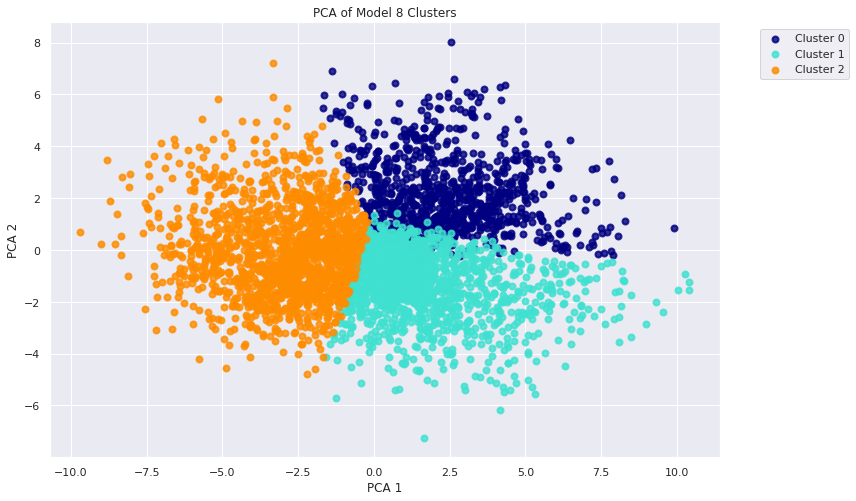

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model8_clusters == i,0], pca_results[model8_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 8 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model8_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model8_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model8_cl_counts_df)
print('Number of Observations in Model 8: ',model8_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        861       1359       1467
Number of Observations in Model 8:  3687


**Model 9: KMeans with 2 Component t-SNE Dimensionality Reduction**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

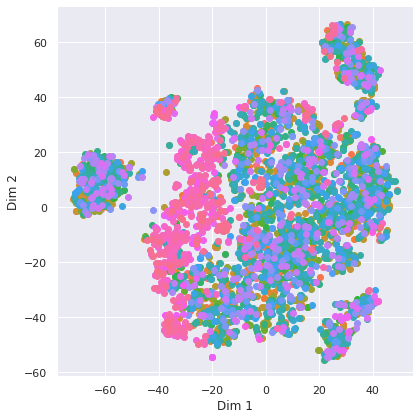

In [ ]:
#start with a model of default hyperparameters to compare for best ones
model = TSNE(n_components=2, random_state=123, perplexity=30, learning_rate=200, n_iter=1000)

#fit model
tsne_data = model.fit_transform(X_std)

#df to help visualize data
labels = range(1,3688)
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns = ['Dim 1', 'Dim 2', 'label'])

#plot
sns.FacetGrid(tsne_df, hue = 'label', size=6).map(plt.scatter, 'Dim 1', 'Dim 2')
plt.show()

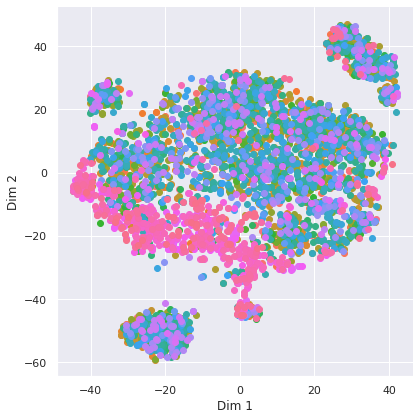

In [ ]:
#model with perplexity of 50
model = TSNE(n_components=2, random_state=123, perplexity=50, learning_rate=200, n_iter=1000)

#fit model
tsne_data = model.fit_transform(X_std)

#df to help visualize data
labels = range(1,3688)
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns = ['Dim 1', 'Dim 2', 'label'])

#plot
sns.FacetGrid(tsne_df, hue = 'label', size=6).map(plt.scatter, 'Dim 1', 'Dim 2')
plt.show()

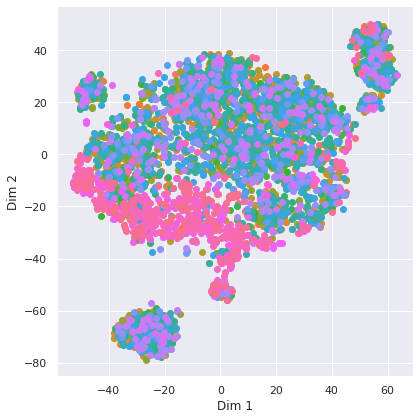

In [ ]:
#perplexity=50 seems stable, let's change number of iterations. 
model = TSNE(n_components=2, random_state=123, perplexity=50, learning_rate=200, n_iter=5000)

#fit model
tsne_data = model.fit_transform(X_std)

#df to help visualize data
labels = range(1,3688)
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns = ['Dim 1', 'Dim 2', 'label'])

#plot
sns.FacetGrid(tsne_df, hue = 'label', size=6).map(plt.scatter, 'Dim 1', 'Dim 2')
plt.show()

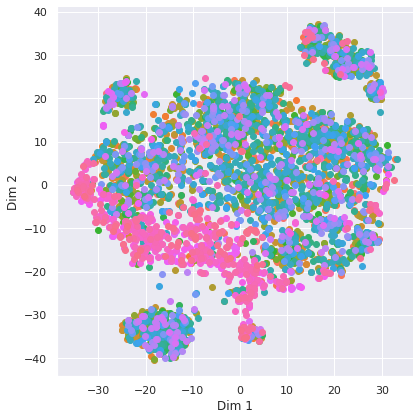

In [ ]:
#5000 iterations looked just as stable as 1000, so let's try lower number 
#to see if we can save time later.  
model = TSNE(n_components=2, random_state=123, perplexity=50, learning_rate=200, n_iter=500)

#fit model
tsne_data = model.fit_transform(X_std)

#df to help visualize data
labels = range(1,3688)
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns = ['Dim 1', 'Dim 2', 'label'])

#plot
sns.FacetGrid(tsne_df, hue = 'label', size=6).map(plt.scatter, 'Dim 1', 'Dim 2')
plt.show()

In [ ]:
#500 iterations looked practically as stable as 1000, so let's stick with 5000 to save time. 
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.027s...
[t-SNE] Computed neighbors for 3687 samples in 1.530s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.973412
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.912140
[t-SNE] KL divergence after 500 iterations: 1.585652
t-SNE done! Time elapsed: 17.448529481887817 seconds.


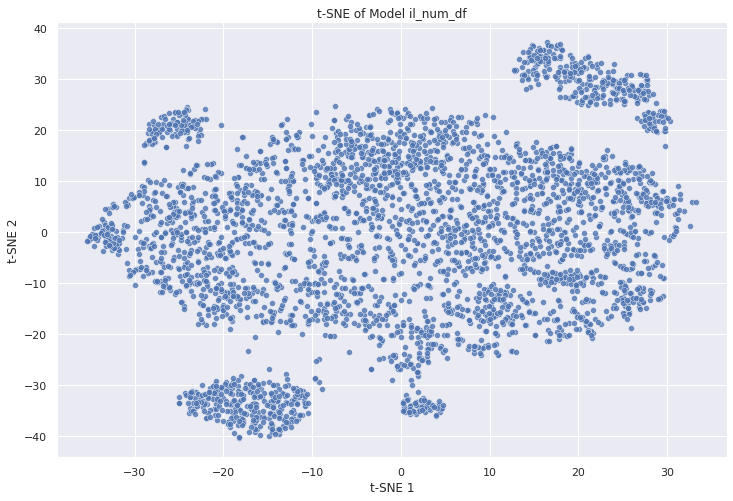

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE of Model il_num_df')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model9_clusters = kmeans.fit_predict(tsne_results)

model9_inertia = kmeans.inertia_
print('Interia for Model 9: ', model9_inertia)
print()
#Calinski Harabasz Score
model9_chscore = metrics.calinski_harabasz_score(X_std, model9_clusters )
print('Calinski Harbasz Score for Model 9: ', model9_chscore)
print()
model9_sscore = metrics.silhouette_score(tsne_results, model9_clusters, metric='euclidean')
print('Silhouette Score for Model 9: ', model9_sscore)

Interia for Model 9:  835386.4782613445

Calinski Harbasz Score for Model 9:  536.4512735332116

Silhouette Score for Model 9:  0.39642945


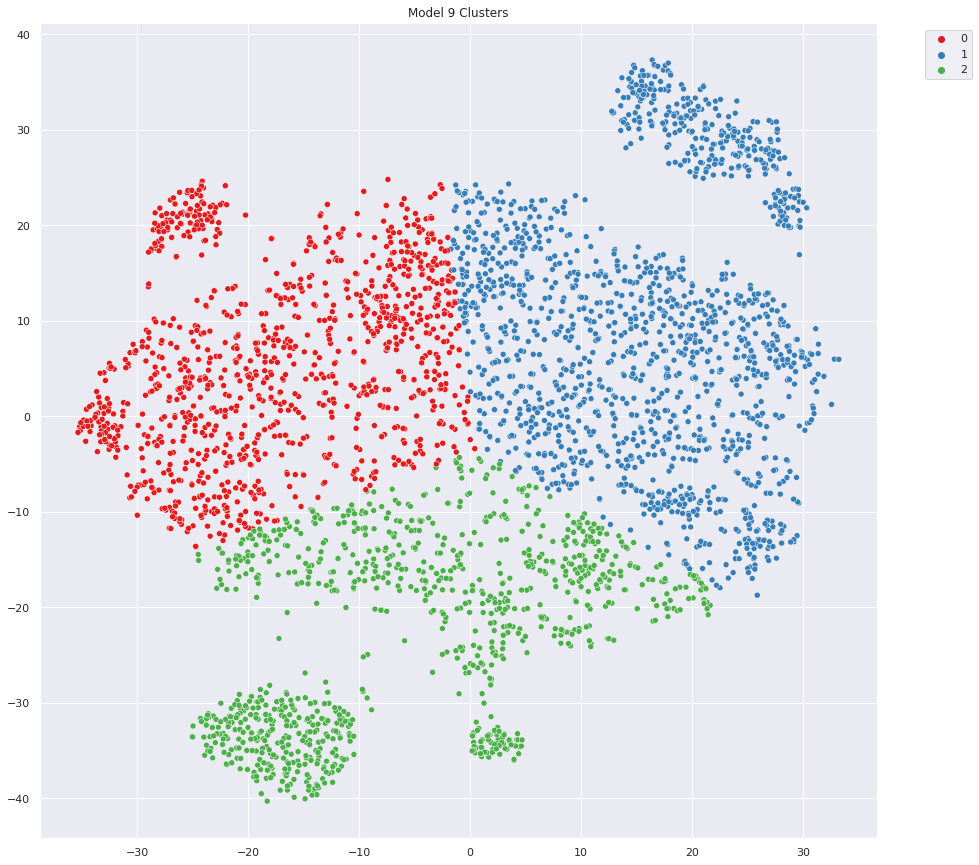

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 9 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model9_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model9_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model9_cl_counts_df)
print('Number of Observations in Model 9: ',model9_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1133       1555        999
Number of Observations in Model 9:  3687


**Model 10: KMeans with 2 Component t-SNE Dimensionality Reduction on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.033s...
[t-SNE] Computed neighbors for 3687 samples in 1.538s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.986978
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.890594
[t-SNE] KL divergence after 500 iterations: 1.586420
t-SNE done! Time elapsed: 19.32709002494812 seconds.


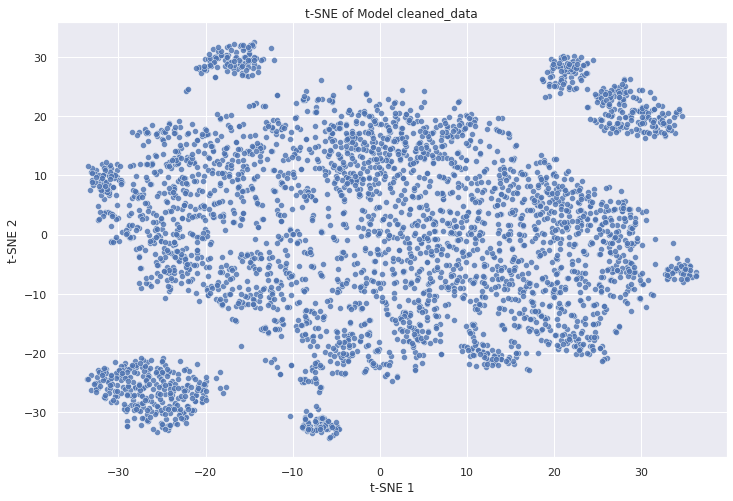

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE of Model cleaned_data')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model10_clusters = kmeans.fit_predict(tsne_results)

model10_inertia = kmeans.inertia_
print('Interia for Model 10: ', model10_inertia)
print()
#Calinski Harabasz Score
model10_chscore = metrics.calinski_harabasz_score(X_std, model10_clusters )
print('Calinski Harbasz Score for Model 10: ', model10_chscore)
print()
model10_sscore = metrics.silhouette_score(tsne_results, model10_clusters, metric='euclidean')
print('Silhouette Score for Model 10: ', model10_sscore)

Interia for Model 10:  795464.5551228387

Calinski Harbasz Score for Model 10:  577.5002461840216

Silhouette Score for Model 10:  0.40772638


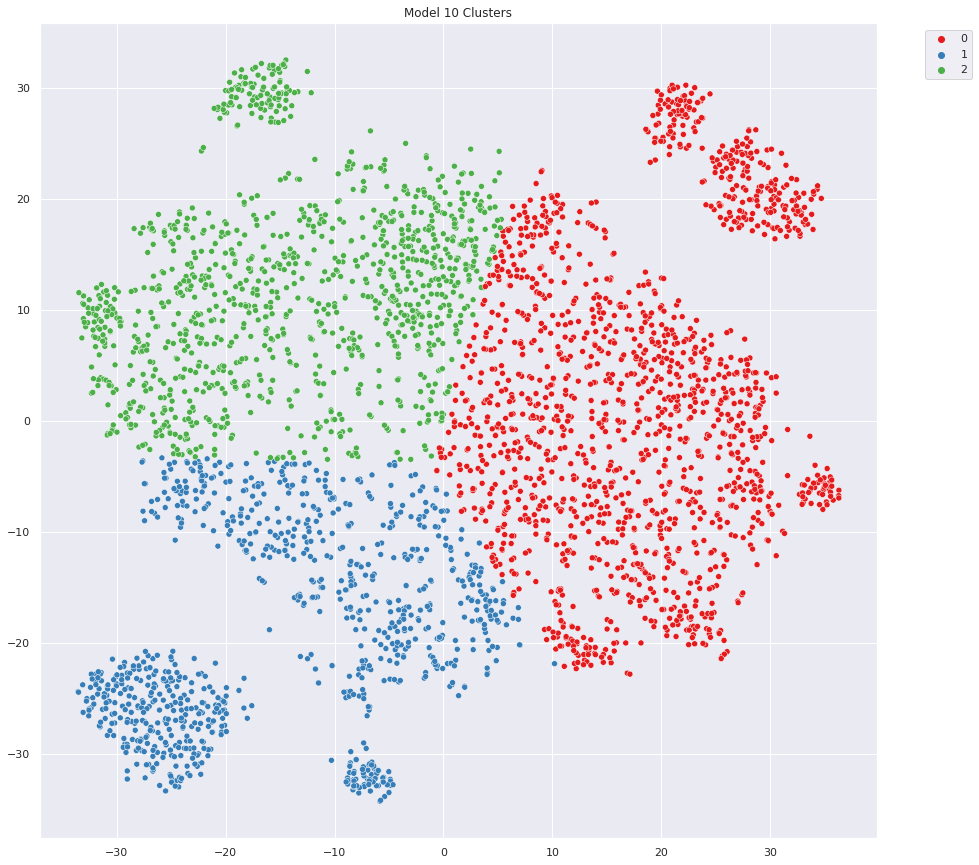

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 10 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model10_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model10_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model10_cl_counts_df)
print('Number of Observations in Model 10: ',model10_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1589        916       1182
Number of Observations in Model 10:  3687


**Model 11: KMeans with  with 2 Component t-SNE Dimensionality Reduction on Less Correlated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.018s...
[t-SNE] Computed neighbors for 3687 samples in 1.008s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.664779
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.390793
[t-SNE] KL divergence after 500 iterations: 1.687913
t-SNE done! Time elapsed: 17.325032234191895 seconds.


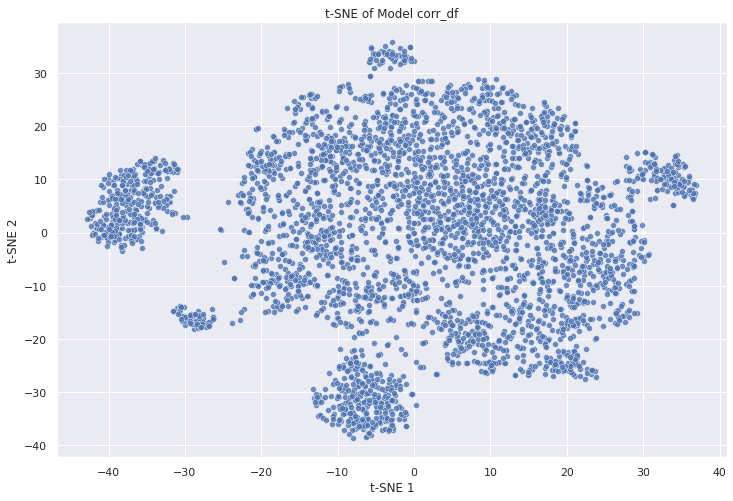

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE of Model corr_df')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model11_clusters = kmeans.fit_predict(tsne_results)

model11_inertia = kmeans.inertia_
print('Interia for Model 11: ', model11_inertia)
print()
#Calinski Harabasz Score
model11_chscore = metrics.calinski_harabasz_score(X_std, model11_clusters )
print('Calinski Harbasz Score for Model 11: ', model11_chscore)
print()
model11_sscore = metrics.silhouette_score(tsne_results, model11_clusters, metric='euclidean')
print('Silhouette Score for Model 11: ', model11_sscore)

Interia for Model 11:  825854.3324338766

Calinski Harbasz Score for Model 11:  404.4050924056848

Silhouette Score for Model 11:  0.38895863


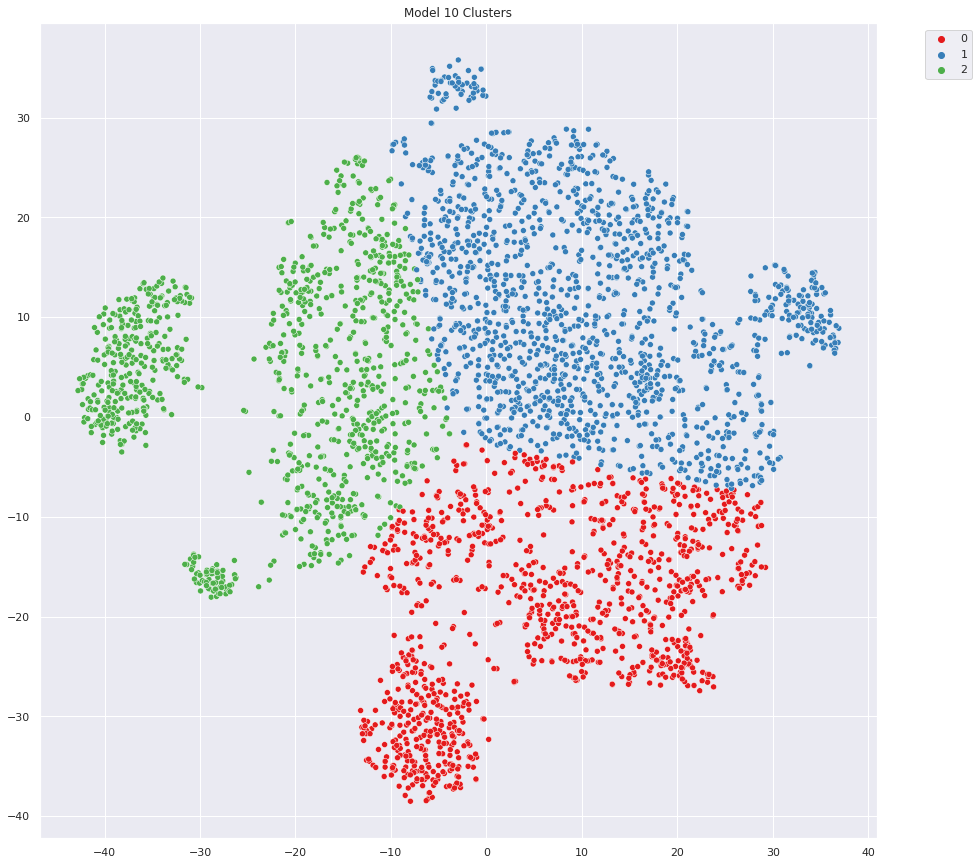

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 10 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model11_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model11_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model11_cl_counts_df)
print('Number of Observations in Model 11: ',model11_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1103       1542       1042
Number of Observations in Model 11:  3687


**Model 12: KMeans with  with 2 Component t-SNE Dimensionality Reduction on Cleaned Less Correlated Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.030s...
[t-SNE] Computed neighbors for 3687 samples in 1.055s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.692832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.080231
[t-SNE] KL divergence after 500 iterations: 1.672923
t-SNE done! Time elapsed: 19.059366703033447 seconds.


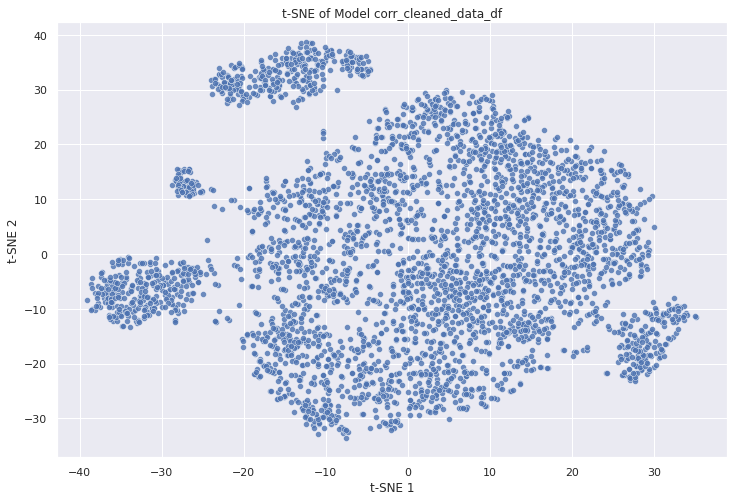

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE of Model corr_cleaned_data_df')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model12_clusters = kmeans.fit_predict(tsne_results)

model12_inertia = kmeans.inertia_
print('Interia for Model 12: ', model12_inertia)
print()
#Calinski Harabasz Score
model12_chscore = metrics.calinski_harabasz_score(X_std, model12_clusters )
print('Calinski Harbasz Score for Model 12: ', model12_chscore)
print()
model12_sscore = metrics.silhouette_score(tsne_results, model12_clusters, metric='euclidean')
print('Silhouette Score for Model 12: ', model12_sscore)

Interia for Model 12:  799761.0235669834

Calinski Harbasz Score for Model 12:  428.3056758103347

Silhouette Score for Model 12:  0.39463666


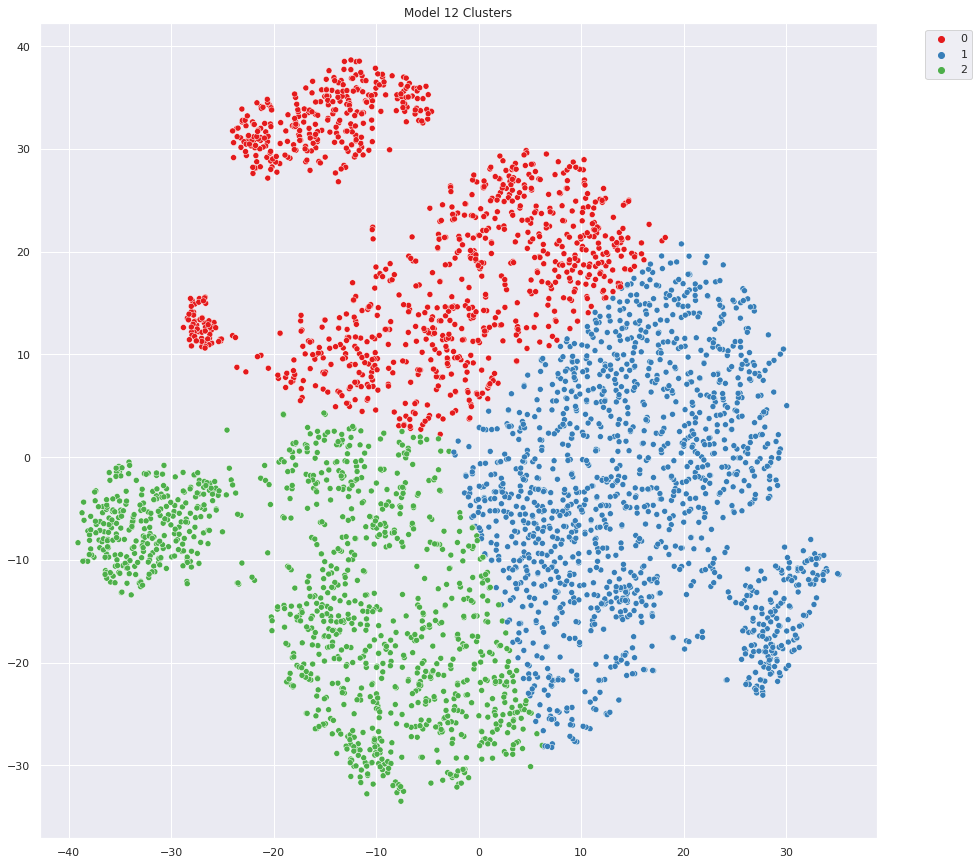

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 12 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model12_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model12_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model12_cl_counts_df)
print('Number of Observations in Model 12: ',model12_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1080       1469       1138
Number of Observations in Model 12:  3687


**Model 13: KMeans with 3 Component t-SNE Dimensionality Reduction**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.022s...
[t-SNE] Computed neighbors for 3687 samples in 1.535s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.973412
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.021019
[t-SNE] KL divergence after 500 iterations: 1.362319
t-SNE done! Time elapsed: 69.34223866462708 seconds.


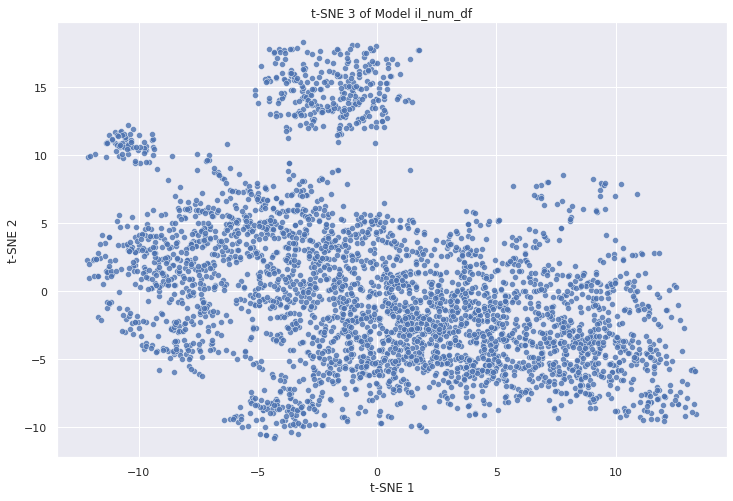

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE 3 of Model il_num_df')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model13_clusters = kmeans.fit_predict(tsne_results)

model13_inertia = kmeans.inertia_
print('Interia for Model 13: ', model13_inertia)
print()
#Calinski Harabasz Score
model13_chscore = metrics.calinski_harabasz_score(X_std, model13_clusters )
print('Calinski Harbasz Score for Model 13: ', model13_chscore)
print()
model13_sscore = metrics.silhouette_score(tsne_results, model13_clusters, metric='euclidean')
print('Silhouette Score for Model 13: ', model13_sscore)

Interia for Model 13:  222376.79633532456

Calinski Harbasz Score for Model 13:  428.99106131569704

Silhouette Score for Model 13:  0.319581


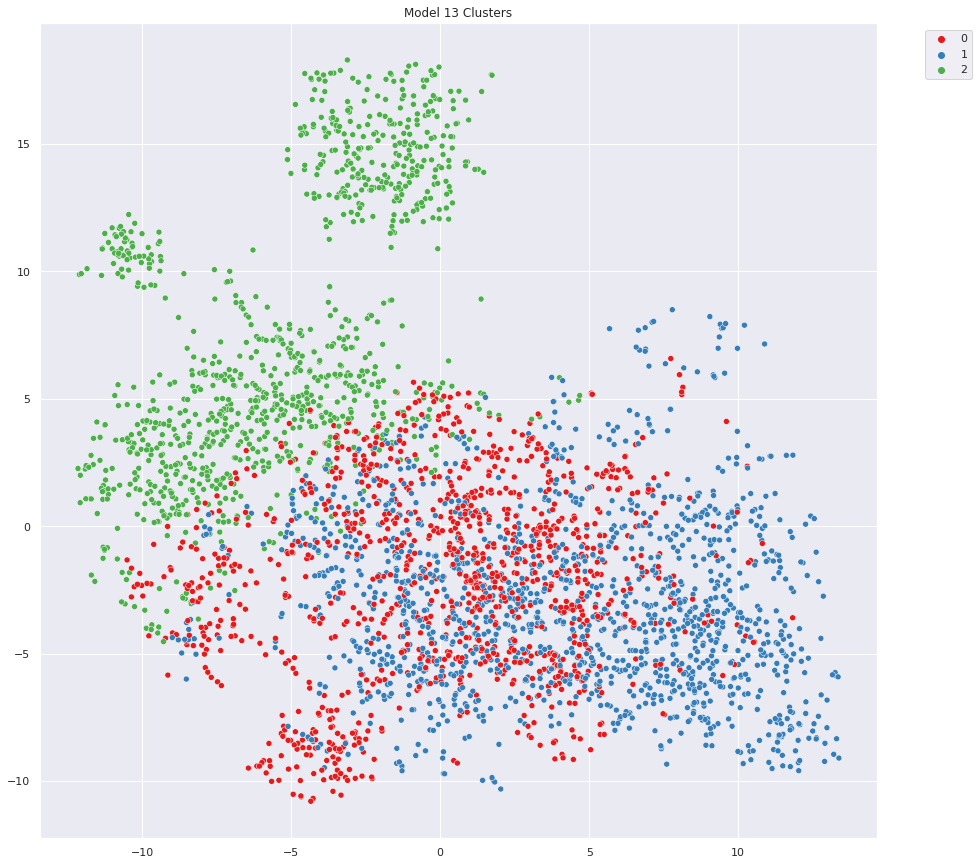

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 13 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model13_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model13_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model13_cl_counts_df)
print('Number of Observations in Model 13: ',model13_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1134       1484       1069
Number of Observations in Model 13:  3687


**Model 14: KMeans with 3 Component t-SNE Dimensionality Reduction on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.056s...
[t-SNE] Computed neighbors for 3687 samples in 1.521s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.986978
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.006767
[t-SNE] KL divergence after 500 iterations: 1.407917
t-SNE done! Time elapsed: 73.39994740486145 seconds.


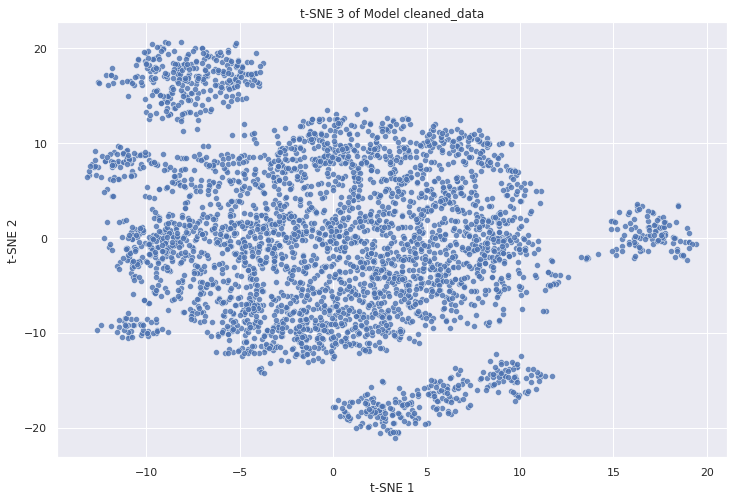

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE 3 of Model cleaned_data')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model14_clusters = kmeans.fit_predict(tsne_results)

model14_inertia = kmeans.inertia_
print('Interia for Model 14: ', model14_inertia)
print()
#Calinski Harabasz Score
model14_chscore = metrics.calinski_harabasz_score(X_std, model14_clusters )
print('Calinski Harbasz Score for Model 14: ', model14_chscore)
print()
model14_sscore = metrics.silhouette_score(tsne_results, model14_clusters, metric='euclidean')
print('Silhouette Score for Model 14: ', model14_sscore)

Interia for Model 14:  257828.05200519966

Calinski Harbasz Score for Model 14:  604.1569317364674

Silhouette Score for Model 14:  0.3413088


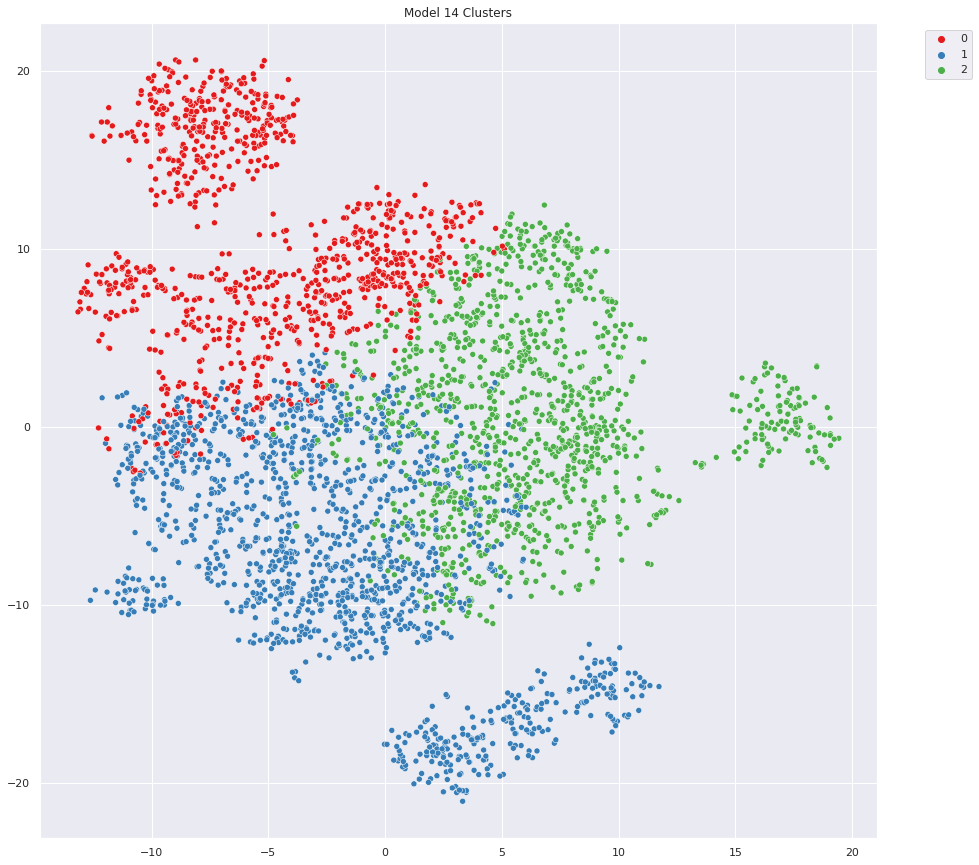

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 14 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model14_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model14_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model14_cl_counts_df)
print('Number of Observations in Model 14: ',model14_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        953       1478       1256
Number of Observations in Model 14:  3687


**Model 15: KMeans with  with 3 Component t-SNE Dimensionality Reduction on Less Correlated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.015s...
[t-SNE] Computed neighbors for 3687 samples in 1.024s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.664779
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.435318
[t-SNE] KL divergence after 500 iterations: 1.503309
t-SNE done! Time elapsed: 63.36667609214783 seconds.


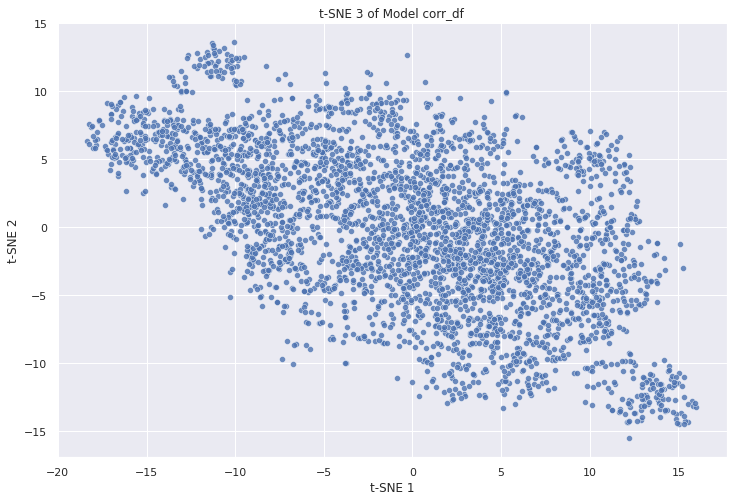

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE 3 of Model corr_df')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model15_clusters = kmeans.fit_predict(tsne_results)

model15_inertia = kmeans.inertia_
print('Interia for Model 15: ', model15_inertia)
print()
#Calinski Harabasz Score
model15_chscore = metrics.calinski_harabasz_score(X_std, model15_clusters )
print('Calinski Harbasz Score for Model 15: ', model15_chscore)
print()
model15_sscore = metrics.silhouette_score(tsne_results, model15_clusters, metric='euclidean')
print('Silhouette Score for Model 15: ', model15_sscore)

Interia for Model 15:  262219.8612190276

Calinski Harbasz Score for Model 15:  450.7854262591524

Silhouette Score for Model 15:  0.33236572


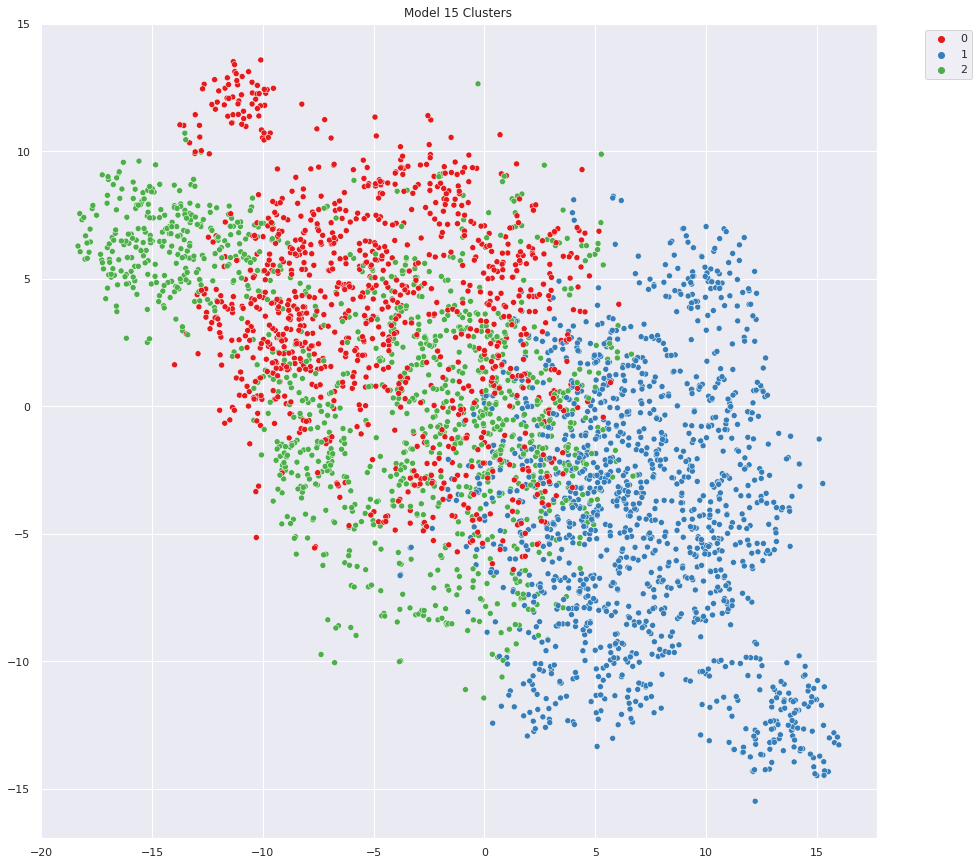

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 15 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model15_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model15_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model15_cl_counts_df)
print('Number of Observations in Model 15: ',model15_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1028       1417       1242
Number of Observations in Model 15:  3687


**Model 16: KMeans with  with 3 Component t-SNE Dimensionality Reduction on Cleaned Less Correlated Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.027s...
[t-SNE] Computed neighbors for 3687 samples in 1.079s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.692832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.157974
[t-SNE] KL divergence after 500 iterations: 1.475605
t-SNE done! Time elapsed: 65.79518604278564 seconds.


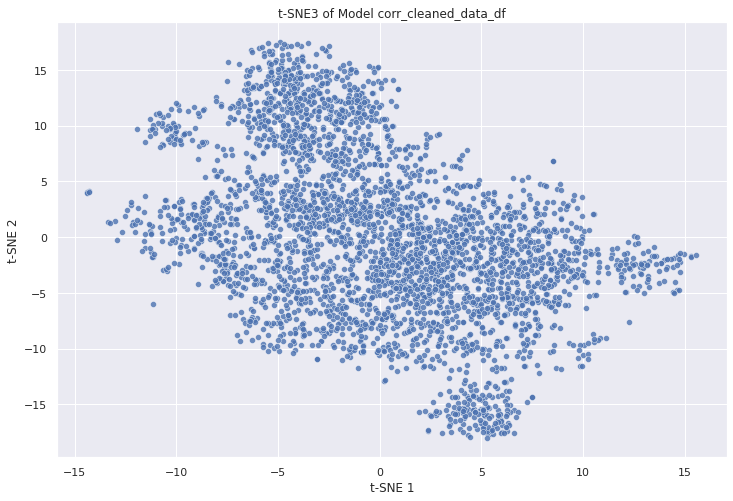

In [ ]:
# Plotting the data
plt.figure(figsize=(12,8))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], palette = 'Set3', alpha=.8)   
plt.title('t-SNE3 of Model corr_cleaned_data_df')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [ ]:
#inertia & silhouette score
kmeans = KMeans(n_clusters=3, random_state=123)
model16_clusters = kmeans.fit_predict(tsne_results)

model16_inertia = kmeans.inertia_
print('Interia for Model 16: ', model16_inertia)
print()
#Calinski Harabasz Score
model16_chscore = metrics.calinski_harabasz_score(X_std, model16_clusters )
print('Calinski Harbasz Score for Model 16: ', model16_chscore)
print()
model16_sscore = metrics.silhouette_score(tsne_results, model16_clusters, metric='euclidean')
print('Silhouette Score for Model 16: ', model16_sscore)

Interia for Model 16:  247062.78754266782

Calinski Harbasz Score for Model 16:  490.70293772613473

Silhouette Score for Model 16:  0.31498545


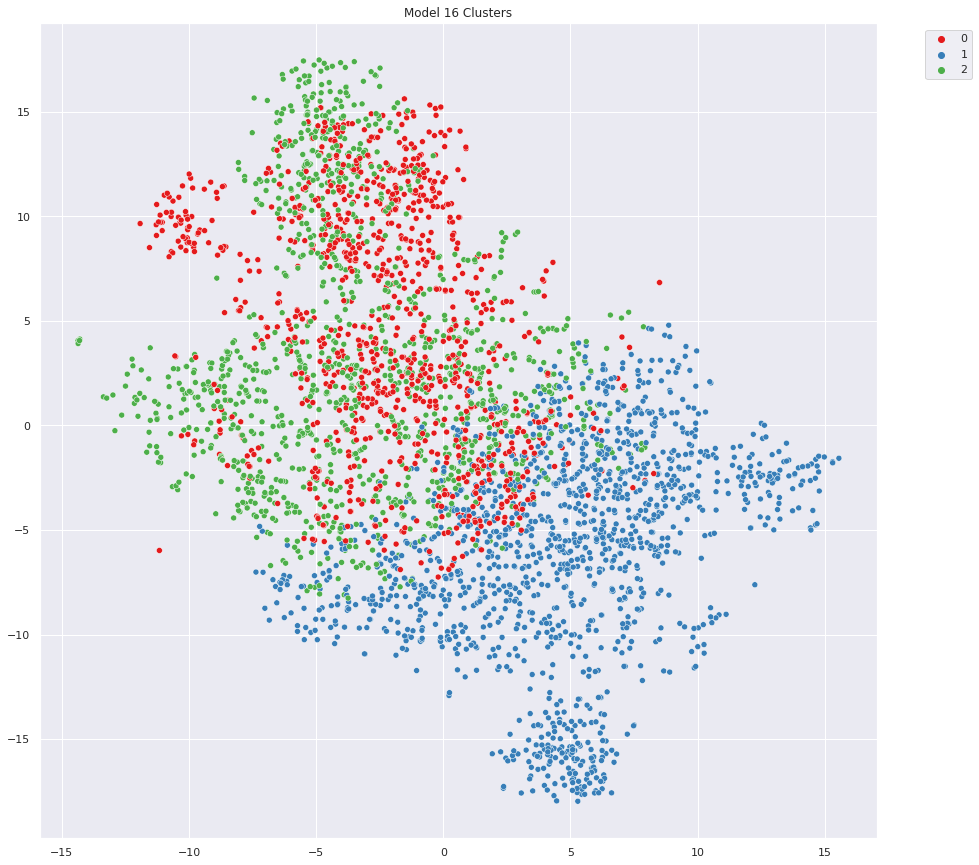

In [ ]:
plt.figure(figsize=(15,15))
target_names = kmeans.labels_
sns.scatterplot(tsne_results[:,0], tsne_results[:,1], palette='Set1', hue=target_names)
plt.title('Model 16 Clusters')
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.6)
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model16_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model16_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model16_cl_counts_df)
print('Number of Observations in Model 16: ',model16_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1004       1441       1242
Number of Observations in Model 16:  3687


**Model 17: KMeans with UMAP Dimensionality Reduction**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model17_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model17_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.452800273895264 seconds.


<Figure size 720x360 with 0 Axes>

<Figure size 576x432 with 0 Axes>

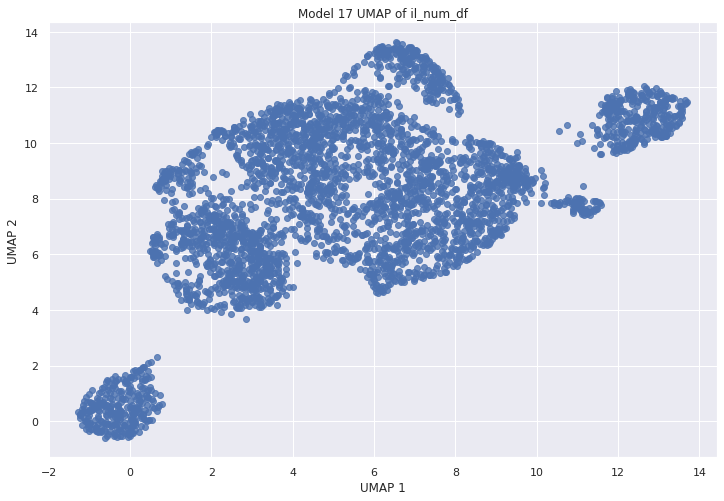

In [ ]:
#Plotting the Data
plt.figure(figsize=(10,5))
plt.figure()
plt.figure(figsize=(12,8))
plt.scatter(umap_results[:,0],umap_results[:,1], alpha=.8, )   
plt.title('Model 17 UMAP of il_num_df')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=123)
model17_clusters = kmeans.fit_predict(umap_results)

#Silhouette Score
model17_sscore = metrics.silhouette_score(umap_results, model17_clusters, metric='euclidean')
print('Silhouette Score for Model 17: ', model17_sscore)
print()
#Calinski Harabasz Score
model17_chscore = metrics.calinski_harabasz_score(umap_results, model17_clusters )
print('Calinski Harbasz Score for Model 17: ', model17_chscore)
print()
#Inertia for 3 Clusters
model17_inertia = kmeans.inertia_
print('Inertia for Model 17: ', model17_inertia)

Silhouette Score for Model 17:  0.41822135

Calinski Harbasz Score for Model 17:  3759.8847328901697

Inertia for Model 17:  26589.58418299309


Explained Variance Ratio (2 Compoenents):  [0.34894756 0.13976537]


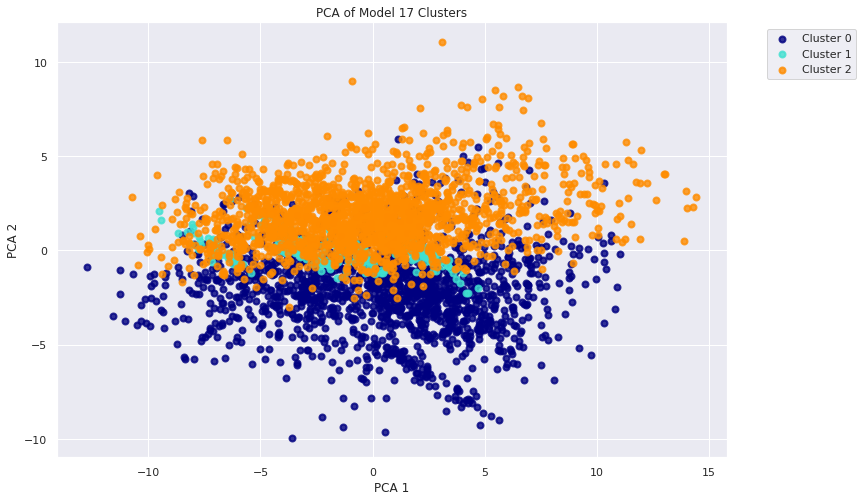

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model17_clusters == i,0], pca_results[model17_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 17 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model17_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 17 is: ', model17_explained_variance_ratio)

The Explained Variance Ratio of Model 17 is:  0.48871293872547183


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model17_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model17_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model17_cl_counts_df)
print('Number of Observations in Model 17: ',model17_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1551        304       1832
Number of Observations in Model 17:  3687


**Model 18: KMeans with UMAP Dimensionality Reduction on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model18_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model18_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.62770414352417 seconds.


<Figure size 720x360 with 0 Axes>

<Figure size 576x432 with 0 Axes>

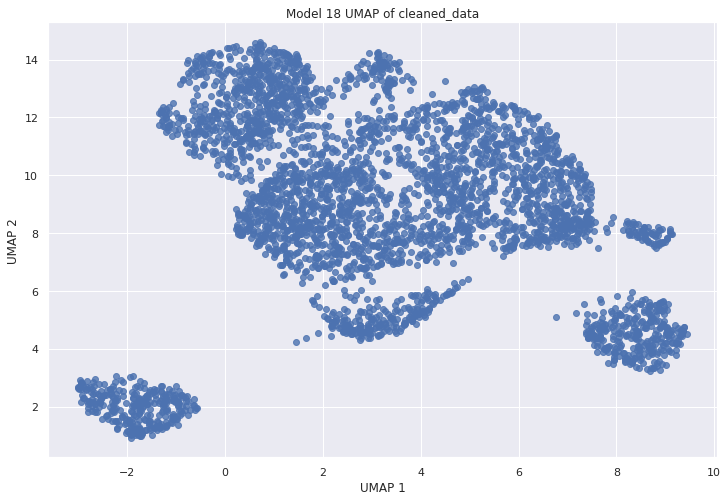

In [ ]:
#Plotting the Data
plt.figure(figsize=(10,5))
plt.figure()
plt.figure(figsize=(12,8))
plt.scatter(umap_results[:,0],umap_results[:,1], alpha=.8, )   
plt.title('Model 18 UMAP of cleaned_data')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=123)
model18_clusters = kmeans.fit_predict(umap_results)

#Silhouette Score
model18_sscore = metrics.silhouette_score(umap_results, model18_clusters, metric='euclidean')
print('Silhouette Score for Model 18: ', model18_sscore)
print()
#Calinski Harabasz Score
model18_chscore = metrics.calinski_harabasz_score(umap_results, model18_clusters )
print('Calinski Harbasz Score for Model 18: ', model18_chscore)
print()
#Inertia for 3 Clusters
model18_inertia = kmeans.inertia_
print('Inertia for Model 18: ', model18_inertia)

Silhouette Score for Model 18:  0.43785867

Calinski Harbasz Score for Model 18:  3402.495191810098

Inertia for Model 18:  26035.274879826837


Explained Variance Ratio (2 Compoenents):  [0.34188531 0.13691726]


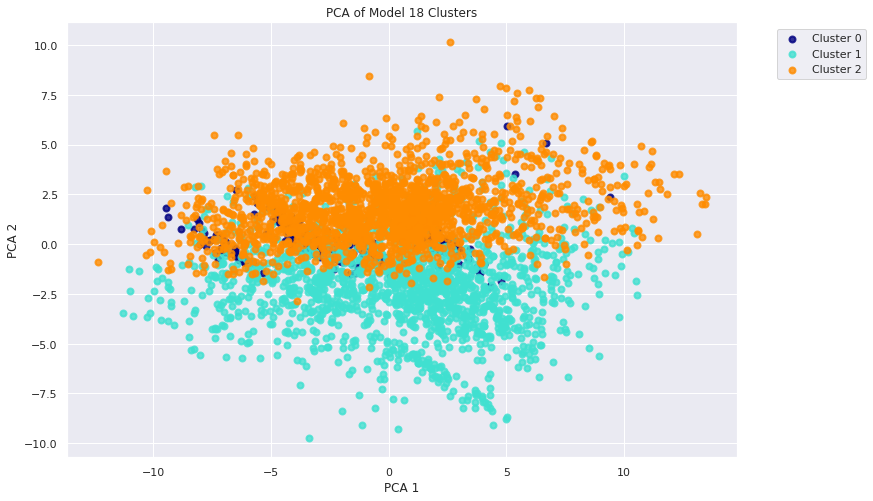

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model18_clusters == i,0], pca_results[model18_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 18 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model18_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 18 is: ', model18_explained_variance_ratio)

The Explained Variance Ratio of Model 18 is:  0.4788025692096543


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model18_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model18_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model18_cl_counts_df)
print('Number of Observations in Model 18: ',model18_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        310       1529       1848
Number of Observations in Model 18:  3687


**Model 19: KMeans with UMAP Dimensionality Reduction on  Less Correlated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model19_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model19_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.353245735168457 seconds.


<Figure size 720x360 with 0 Axes>

<Figure size 576x432 with 0 Axes>

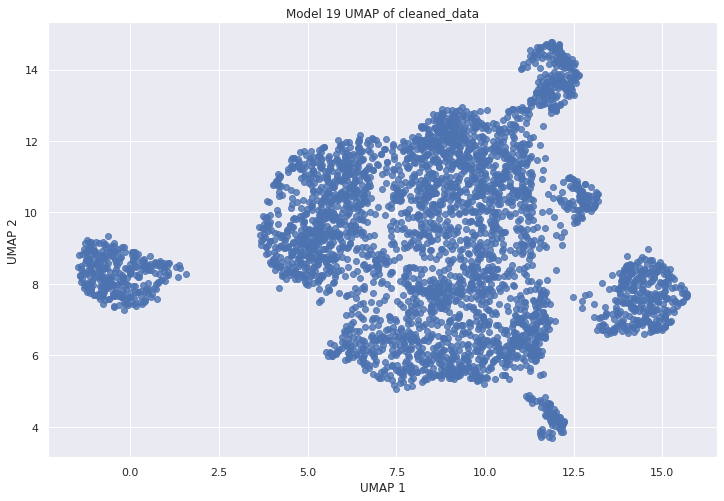

In [ ]:
#Plotting the Data
plt.figure(figsize=(10,5))
plt.figure()
plt.figure(figsize=(12,8))
plt.scatter(umap_results[:,0],umap_results[:,1], alpha=.8, )   
plt.title('Model 19 UMAP of cleaned_data')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=123)
model19_clusters = kmeans.fit_predict(umap_results)

#Silhouette Score
model19_sscore = metrics.silhouette_score(umap_results, model19_clusters, metric='euclidean')
print('Silhouette Score for Model 19: ', model19_sscore)
print()
#Calinski Harabasz Score
model19_chscore = metrics.calinski_harabasz_score(umap_results, model19_clusters )
print('Calinski Harbasz Score for Model 19: ', model19_chscore)
print()
#Inertia for 3 Clusters
model19_inertia = kmeans.inertia_
print('Inertia for Model 19: ', model19_inertia)

Silhouette Score for Model 19:  0.41130868

Calinski Harbasz Score for Model 19:  3314.0298453038827

Inertia for Model 19:  25509.895238330348


Explained Variance Ratio (2 Compoenents):  [0.28965774 0.13141593]


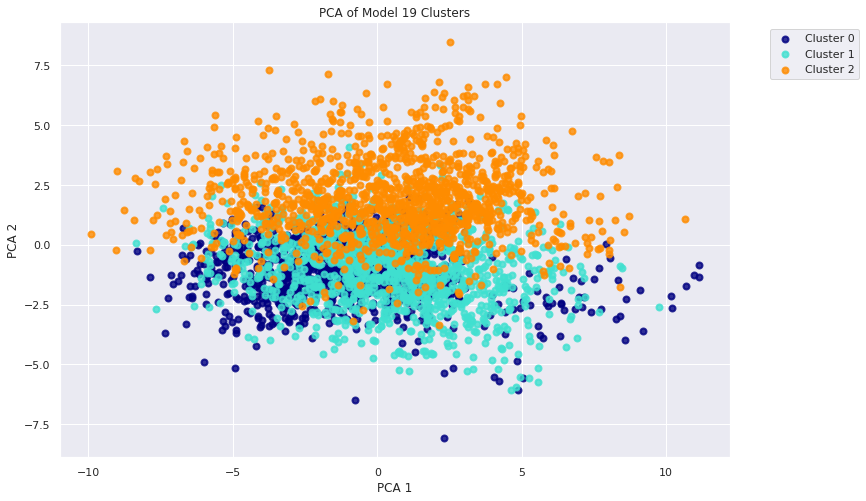

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model19_clusters == i,0], pca_results[model19_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 19 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model19_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 19 is: ', model19_explained_variance_ratio)

The Explained Variance Ratio of Model 19 is:  0.4210736626529859


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model19_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model19_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model19_cl_counts_df)
print('Number of Observations in Model 19: ',model19_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1103       1280       1304
Number of Observations in Model 19:  3687


**Model 20: KMeans with UMAP Dimensionality Reduction on on Cleaned Less Correlated Data**


In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model20_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model20_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.178038358688354 seconds.


<Figure size 720x360 with 0 Axes>

<Figure size 576x432 with 0 Axes>

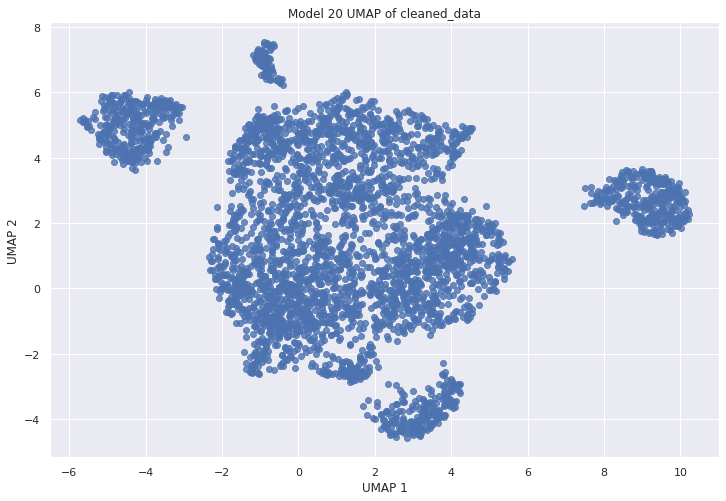

In [ ]:
#Plotting the Data
plt.figure(figsize=(10,5))
plt.figure()
plt.figure(figsize=(12,8))
plt.scatter(umap_results[:,0],umap_results[:,1], alpha=.8, )   
plt.title('Model 20 UMAP of cleaned_data')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=123)
model20_clusters = kmeans.fit_predict(umap_results)

#Silhouette Score
model20_sscore = metrics.silhouette_score(umap_results, model19_clusters, metric='euclidean')
print('Silhouette Score for Model 20: ', model20_sscore)
print()
#Calinski Harabasz Score
model20_chscore = metrics.calinski_harabasz_score(umap_results, model20_clusters )
print('Calinski Harbasz Score for Model 20: ', model20_chscore)
print()
#Inertia for 3 Clusters
model20_inertia = kmeans.inertia_
print('Inertia for Model 20: ', model20_inertia)

Silhouette Score for Model 20:  0.36728105

Calinski Harbasz Score for Model 20:  3207.239945397595

Inertia for Model 20:  24171.314261297513


Explained Variance Ratio (2 Compoenents):  [0.29759388 0.12628928]


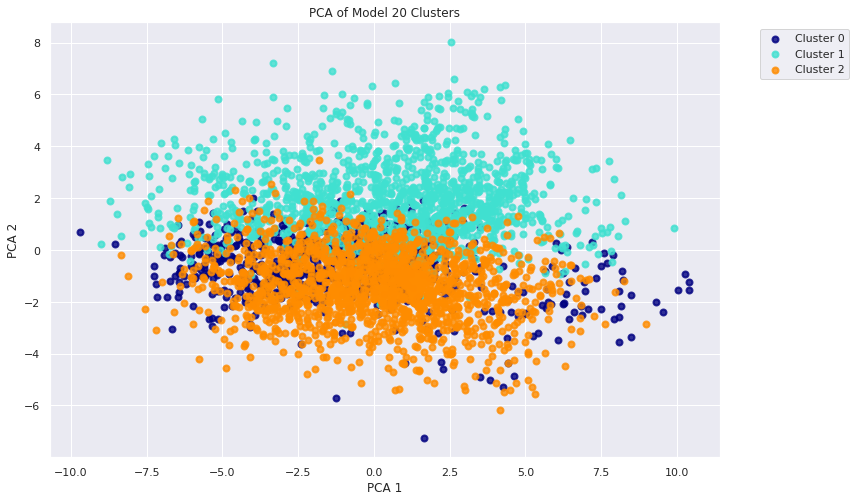

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model20_clusters == i,0], pca_results[model20_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 20 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model20_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 20 is: ', model20_explained_variance_ratio)

The Explained Variance Ratio of Model 20 is:  0.423883158657148


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model20_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model20_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model20_cl_counts_df)
print('Number of Observations in Model 20: ',model20_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        777       1326       1584
Number of Observations in Model 20:  3687


**Model 21: Hierarchical/Agglomerative Clustering with All Data**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

In [ ]:
# #create dendrograms
# #list of methods
# link_method = ['complete', 'average', 'ward']

# #for loop to create dendrograms
# for m in link_method:
#   plt.figure(figsize=(20,10))
#   plt.title('Dendrogram Linkage Method: {}'.format(m))
#   dendrogram(linkage(X_std, method = m))
#   plt.show()

Dendrograms Saved as Pictures because the code takes a long time to run. 

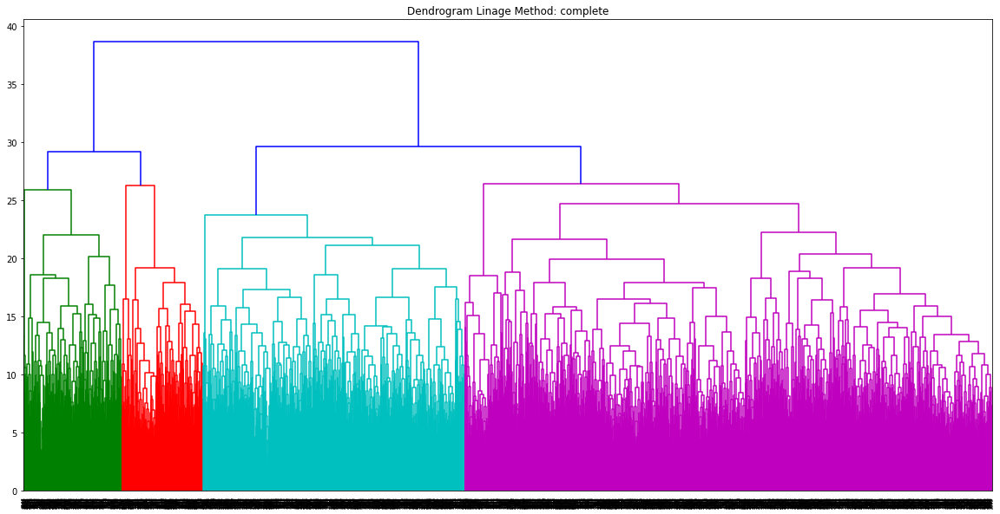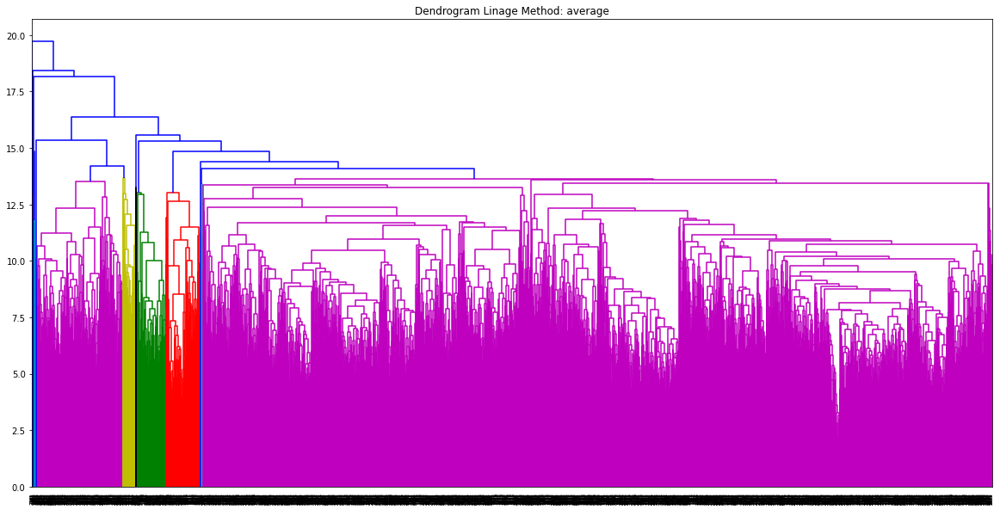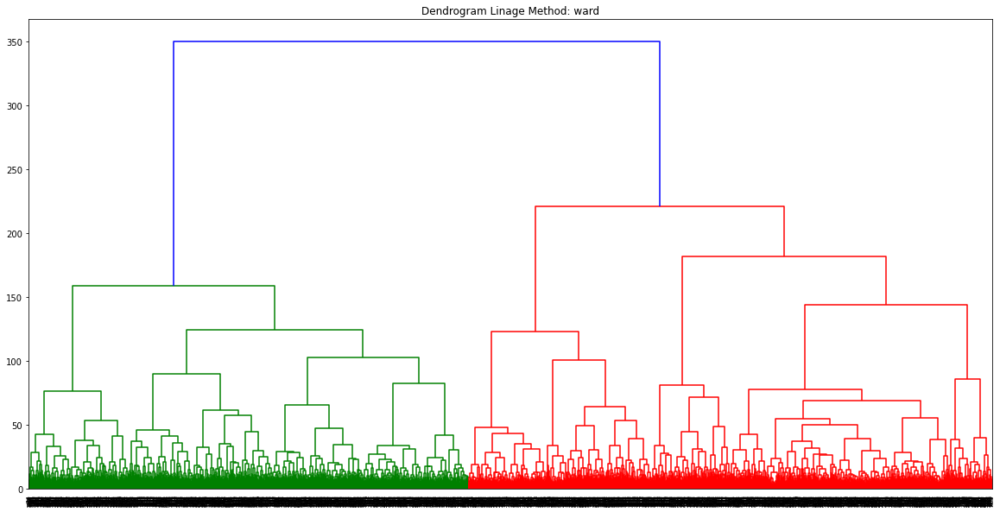

In [ ]:
#agglomerative clustering with 3 clusters

#dictionary of methods and affinities
link_affinity = {'complete':'cosine' , 'average':'cosine', 'ward':'euclidean'}

#loop to run agglomerative clustering, ARI, & Silhouette scores
for m, a in link_affinity.items():
  agg_cluster = AgglomerativeClustering(linkage = m, affinity = a, n_clusters = 3)
  #fit model
  clusters = agg_cluster.fit_predict(X_std)
  print('Silhouette Score of {} Linkage Method: {}'.format(m, metrics.silhouette_score(X_std, clusters, metric = a)))
  print()

Silhouette Score of complete Linkage Method: 0.2317022231843054

Silhouette Score of average Linkage Method: 0.23242248993076758

Silhouette Score of ward Linkage Method: 0.13467248551919336



In [ ]:
#create instance of model
agg = AgglomerativeClustering(n_clusters = 3, affinity= 'cosine', linkage='complete')
model21_clusters = agg.fit_predict(X_std)

model21_sscore = metrics.silhouette_score(X_std, model21_clusters, metric='cosine')
print('Silhouette Score for Model 21: ', model21_sscore)
print()
#Calinski Harabasz Score
model21_chscore = metrics.calinski_harabasz_score(X_std, model21_clusters )
print('Calinski Harbasz Score for Model 21: ', model21_chscore)

Silhouette Score for Model 21:  0.2317022231843054

Calinski Harbasz Score for Model 21:  655.0121556834837


Explained Variance Ratio (2 Compoenents):  [0.34894756 0.13976537]


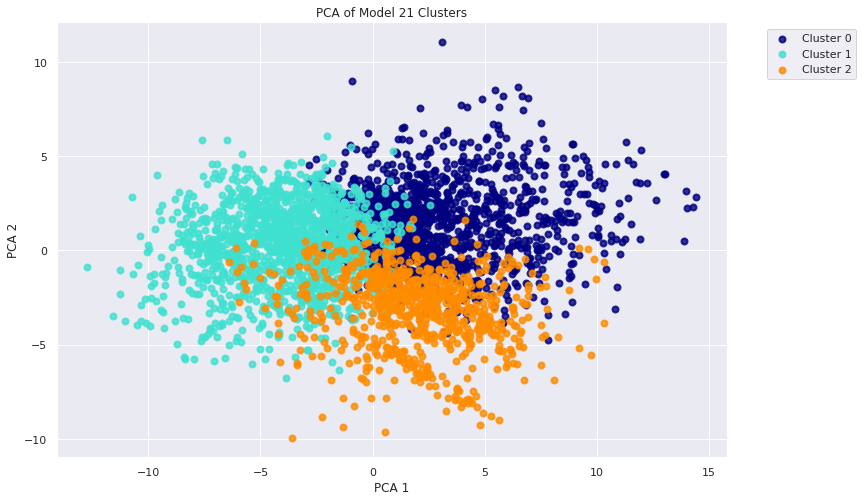

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model21_clusters == i,0], pca_results[model21_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 21 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model21_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 21 is: ', model21_explained_variance_ratio)

The Explained Variance Ratio of Model 21 is:  0.48871293872547183


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model21_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model21_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model21_cl_counts_df)
print('Number of Observations in Model 21: ',model21_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1462       1440        785
Number of Observations in Model 21:  3687


**Model 22: Agglomerative with PCA**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

In [ ]:
#Running PCA again, 28 components was found to be ideal number for df in model 2
pca = PCA(n_components=28, random_state=123)
pca_results = pca.fit_transform(X_std)

#create instance of model
agg = AgglomerativeClustering(n_clusters = 3, affinity= 'euclidean', linkage='ward')
model22_clusters = agg.fit_predict(pca_results)

model22_sscore = metrics.silhouette_score(pca_results, model22_clusters, metric='euclidean')
print('Silhouette Score for Model 22: ', model22_sscore)
#Calinski Harabasz Score
model22_chscore = metrics.calinski_harabasz_score(pca_results, model22_clusters )
print('Calinski Harbasz Score for Model 22: ', model22_chscore)

Silhouette Score for Model 22:  0.14008378055259688
Calinski Harbasz Score for Model 22:  700.3228983772351


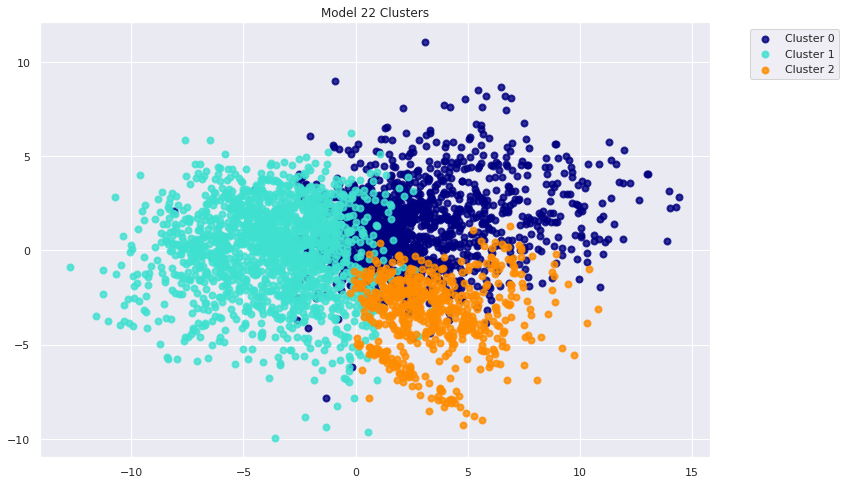

In [ ]:
#plot results
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model22_clusters == i, 0], pca_results[model22_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 22 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model22_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model22_cl_counts_df)
print('Number of Observations in Model 22: ',model22_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1808       1447        432
Number of Observations in Model 22:  3687


**Model 23: Hierarchical/Agglomerative on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

In [ ]:
#agglomerative clustering with 3 clusters

#dictionary of methods and affinities
link_affinity = {'complete':'cosine' , 'average':'cosine', 'ward':'euclidean'}

#loop to run agglomerative clustering, ARI, & Silhouette scores
for m, a in link_affinity.items():
  agg_cluster = AgglomerativeClustering(linkage = m, affinity = a, n_clusters = 3)
  #fit model
  clusters = agg_cluster.fit_predict(X_std)
  print('Silhouette Score of {} Linkage Method: {}'.format(m, metrics.silhouette_score(X_std, clusters, metric = a)))
  print()

Silhouette Score of complete Linkage Method: 0.1594449723788459

Silhouette Score of average Linkage Method: 0.23014637210116887

Silhouette Score of ward Linkage Method: 0.13114066363842983



In [ ]:
#create instance of model
agg = AgglomerativeClustering(n_clusters = 3, affinity= 'cosine', linkage='average')
model23_clusters = agg.fit_predict(X_std)

model23_sscore = metrics.silhouette_score(X_std, model23_clusters, metric='cosine')
print('Silhouette Score for Model 23: ', model23_sscore)
print()
#Calinski Harabasz Score
model23_chscore = metrics.calinski_harabasz_score(X_std, model23_clusters )
print('Calinski Harbasz Score for Model 23: ', model23_chscore)

Silhouette Score for Model 23:  0.23014637210116887

Calinski Harbasz Score for Model 23:  648.4245372932842


Explained Variance Ratio (2 Compoenents):  [0.34188531 0.13691726]


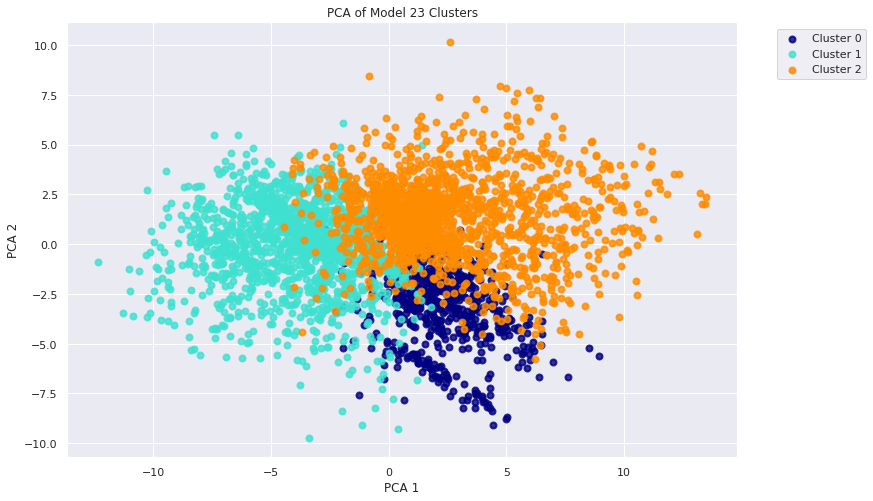

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model23_clusters == i,0], pca_results[model23_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 23 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
model23_explained_variance_ratio =sum(pca.explained_variance_ratio_)
print('The Explained Variance Ratio of Model 23 is: ', model23_explained_variance_ratio)

The Explained Variance Ratio of Model 23 is:  0.4788025692096543


In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model23_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model23_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model23_cl_counts_df)
print('Number of Observations in Model 23: ',model23_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        592       1477       1618
Number of Observations in Model 23:  3687


**Model 24: Agglomerative with PCA on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

In [ ]:
#Running PCA again, 30 components was found to be ideal number for df in model 4
pca = PCA(n_components=30, random_state=123)
pca_results = pca.fit_transform(X_std)

#create instance of model
agg = AgglomerativeClustering(n_clusters = 3, affinity= 'euclidean', linkage='ward')
model24_clusters = agg.fit_predict(pca_results)

#Silhouette Score
model24_sscore = metrics.silhouette_score(pca_results, model24_clusters, metric='euclidean')
print('Silhouette Score for Model 24: ', model24_sscore)
print()
#Calinski Harabasz Score
model24_chscore = metrics.calinski_harabasz_score(pca_results, model22_clusters )
print('Calinski Harbasz Score for Model 24: ', model24_chscore)

Silhouette Score for Model 24:  0.14035565791237548

Calinski Harbasz Score for Model 24:  695.5212726393005


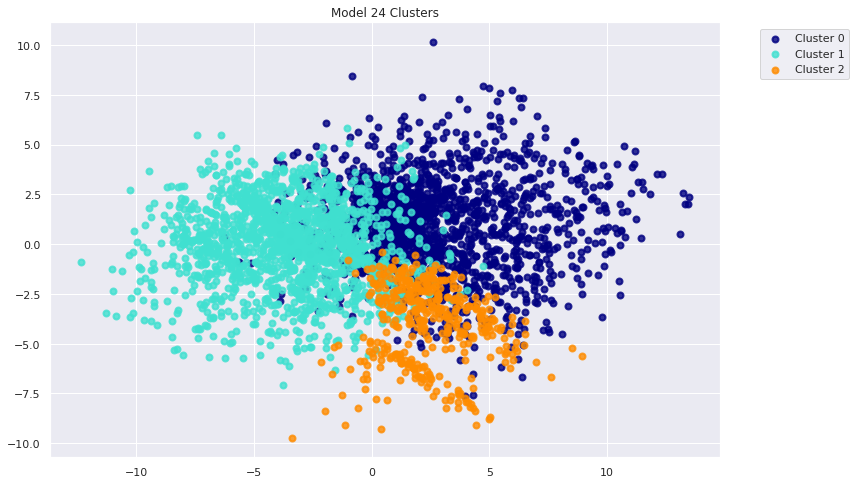

In [ ]:
#plot results
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model24_clusters == i, 0], pca_results[model24_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 24 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model24_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model24_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model24_cl_counts_df)
print('Number of Observations in Model 24: ',model24_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1703       1578        406
Number of Observations in Model 24:  3687


Agglomerative Clustering is continuously performing lower than the KMeans clustering models of the same dataframes, so further testing is not necessary on Agglomerative clustering. 

**Model 25 DBSCAN Clustering with All Data**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

In [ ]:
#Find optimal value for eps
#calculate distances from each point to closest neighbor
neigh = NearestNeighbors(n_neighbors= 2)
nrbrs = neigh.fit(X_std)
distances, indices = nrbrs.kneighbors(X_std)

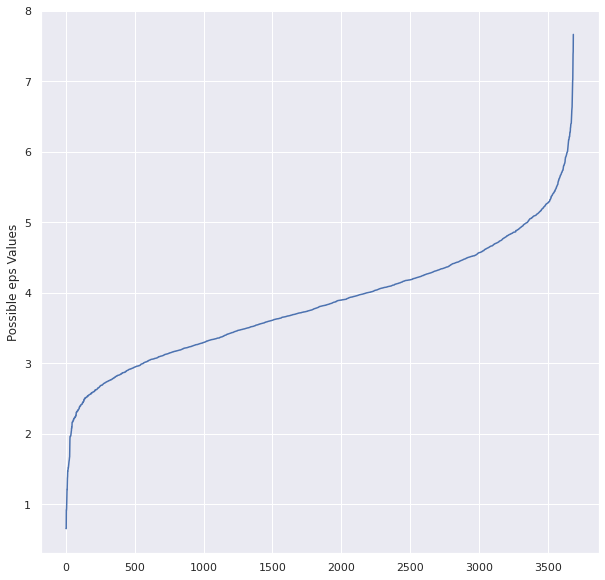

In [ ]:
#sort distances, plot results.
plt.figure(figsize=(10,10))
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.ylabel('Possible eps Values')
plt.plot(distances)
plt.show()

In [ ]:
#model should be set to point of max curvature, which looks to be between 4 & 5.
#find optimal min_samples
min_samples = range(5,21)
for i in min_samples:
  print('min_samples value is: ', i)
  db = DBSCAN(eps = 4, min_samples=i).fit(X_std)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_]=True
  #Ignoring label -1 for outliers
  labels = set([label for label in db.labels_ if label >=0])
  print(set(labels))
  print('For min_samples value: ', i, 'the total number of clusters is: ', len(set(labels)))
  print()

min_samples value is:  5
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}
For min_samples value:  5 the total number of clusters is:  16

min_samples value is:  6
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}
For min_samples value:  6 the total number of clusters is:  16

min_samples value is:  7
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}
For min_samples value:  7 the total number of clusters is:  15

min_samples value is:  8
{0, 1, 2, 3, 4, 5, 6, 7, 8}
For min_samples value:  8 the total number of clusters is:  9

min_samples value is:  9
{0, 1, 2, 3, 4, 5, 6}
For min_samples value:  9 the total number of clusters is:  7

min_samples value is:  10
{0, 1, 2, 3, 4, 5, 6}
For min_samples value:  10 the total number of clusters is:  7

min_samples value is:  11
{0, 1, 2, 3, 4}
For min_samples value:  11 the total number of clusters is:  5

min_samples value is:  12
{0, 1, 2, 3, 4}
For min_samples value:  12 the total number of clusters is:  5

min_samples value is: 

In [ ]:
#model should be set to point of max curvature, which looks to be between 4 & 5.
#find optimal min_samples
min_samples = range(5,21)
for i in min_samples:
  print('min_samples value is: ', i)
  db = DBSCAN(eps = 7, min_samples=i).fit(X_std)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_]=True
  #Ignoring label -1 for outliers
  labels = set([label for label in db.labels_ if label >=0])
  print(set(labels))
  print('For min_samples value: ', i, 'the total number of clusters is: ', len(set(labels)))
  print()

min_samples value is:  5
{0}
For min_samples value:  5 the total number of clusters is:  1

min_samples value is:  6
{0}
For min_samples value:  6 the total number of clusters is:  1

min_samples value is:  7
{0}
For min_samples value:  7 the total number of clusters is:  1

min_samples value is:  8
{0}
For min_samples value:  8 the total number of clusters is:  1

min_samples value is:  9
{0}
For min_samples value:  9 the total number of clusters is:  1

min_samples value is:  10
{0}
For min_samples value:  10 the total number of clusters is:  1

min_samples value is:  11
{0}
For min_samples value:  11 the total number of clusters is:  1

min_samples value is:  12
{0}
For min_samples value:  12 the total number of clusters is:  1

min_samples value is:  13
{0}
For min_samples value:  13 the total number of clusters is:  1

min_samples value is:  14
{0}
For min_samples value:  14 the total number of clusters is:  1

min_samples value is:  15
{0}
For min_samples value:  15 the total num

In [ ]:
#min_samples = 20, eps = 4 was when we got 3 clusters like KMeans
#create instance of model
dbscan = DBSCAN(eps=4, min_samples=20, metric='euclidean')
#fit_transform data
model25_clusters = dbscan.fit_predict(X_std)

#Silhouette Score
model25_sscore = metrics.silhouette_score(X_std, model25_clusters, metric='euclidean')
print('Silhouette Score for Model 25: ', model25_sscore)
print()
#Calinski Harabasz Score
model25_chscore = metrics.calinski_harabasz_score(X_std, model25_clusters )
print('Calinski Harbasz Score for Model 25: ', model25_chscore)

Silhouette Score for Model 25:  -0.04388439070255272

Calinski Harbasz Score for Model 25:  104.11799199692909


Explained Variance Ratio (2 Compoenents):  [0.34894756 0.13976537]


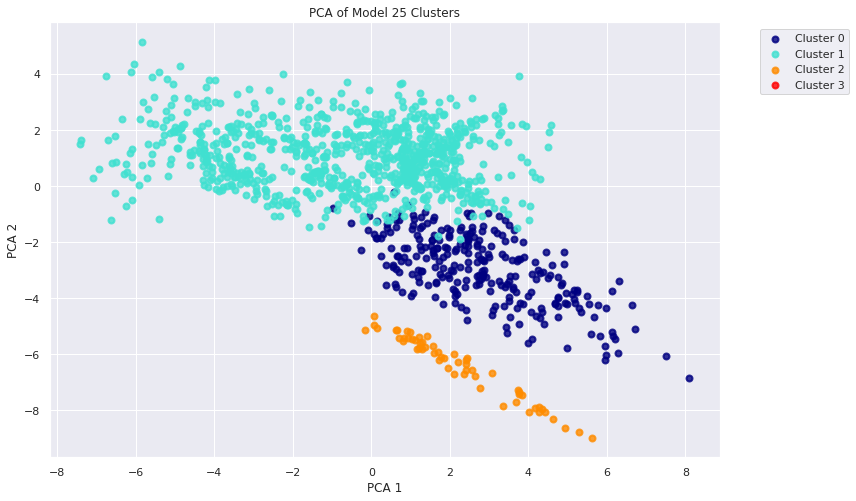

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']
colors = ['navy', 'turquoise', 'darkorange', 'red']
lw = 2
for color,i, target_name in zip(colors, [0,1, 2, 3], target_names):
  plt.scatter(pca_results[model25_clusters == i,0], pca_results[model25_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 25 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model25_clusters, return_counts=True)
counts = counts.reshape(1,4)

#create a dataframe
model25_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1',
'Cluster 2', 'Cluster 3'])

#display counts in each cluster
print(model25_cl_counts_df)
print('Number of Observations in Model 25: ',model25_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2  Cluster 3
0       2516        265        849         57
Number of Observations in Model 25:  3687


**Model 26: DBSCAN with PCA**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Running PCA, 28 is ideal number from previous run through of same data, model 2
pca = PCA(n_components=28, random_state=123)
pca_results = pca.fit_transform(X_std)

In [ ]:
#create instance of model
dbscan = DBSCAN(eps=4, min_samples=20, metric='euclidean')

#fit_transform data
model26_clusters = dbscan.fit_predict(pca_results)

#Silhouette Score
model26_sscore = metrics.silhouette_score(pca_results, model26_clusters, metric='euclidean')
print('Silhouette Score for Model 26: ', model26_sscore)
print()
#Calinski Harabasz Score
model26_chscore = metrics.calinski_harabasz_score(pca_results, model26_clusters)
print('Calinski Harbasz Score for Model 26: ', model26_chscore)

Silhouette Score for Model 26:  0.008946050415127102

Calinski Harbasz Score for Model 26:  68.4888375975173


Explained Variance Ratio (2 Compoenents):  [0.36610697 0.1466383 ]


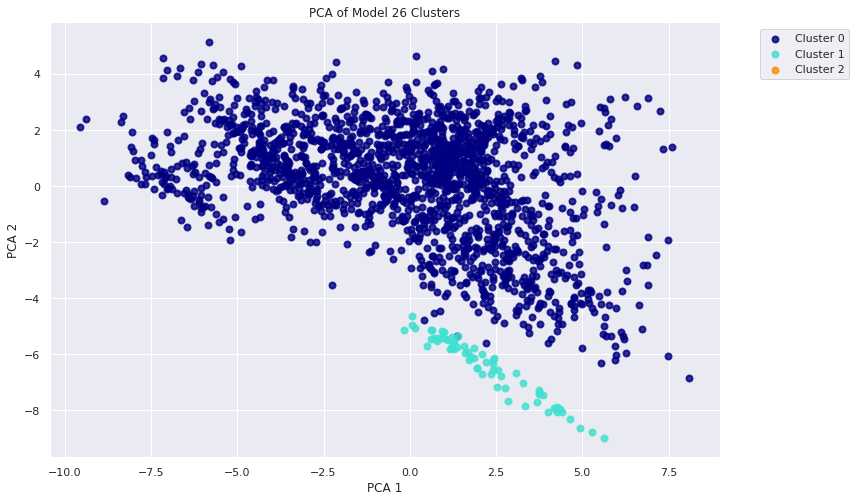

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(pca_results)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2,3], target_names):
  plt.scatter(pca_results[model26_clusters == i,0], pca_results[model26_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 26 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model26_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model26_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 3'])

#display counts in each cluster
print(model26_cl_counts_df)
print('Number of Observations in Model 26: ',model26_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 3
0       1832       1791         64
Number of Observations in Model 26:  3687


DBSCAN is continuously performing lower than the KMeans clustering models of the same dataframes, so further testing is not necessary on DBSCAN. 

**Model 27: Gaussian Mixture Models Clustering All Numeric Data**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
model27_clusters = gmm_cluster.fit_predict(X_std)

#Silhouette Score
model27_sscore = metrics.silhouette_score(X_std, model27_clusters, metric='euclidean')
print('Silhouette Score for Model 27: ', model27_sscore)
print()
#Calinski Harabasz Score
model27_chscore = metrics.calinski_harabasz_score(X_std, model27_clusters)
print('Calinski Harbasz Score for Model 27: ', model27_chscore)

Silhouette Score for Model 27:  0.0077491342192716325

Calinski Harbasz Score for Model 27:  105.56317339478743


Explained Variance Ratio (2 Compoenents):  [0.34894756 0.13976537]


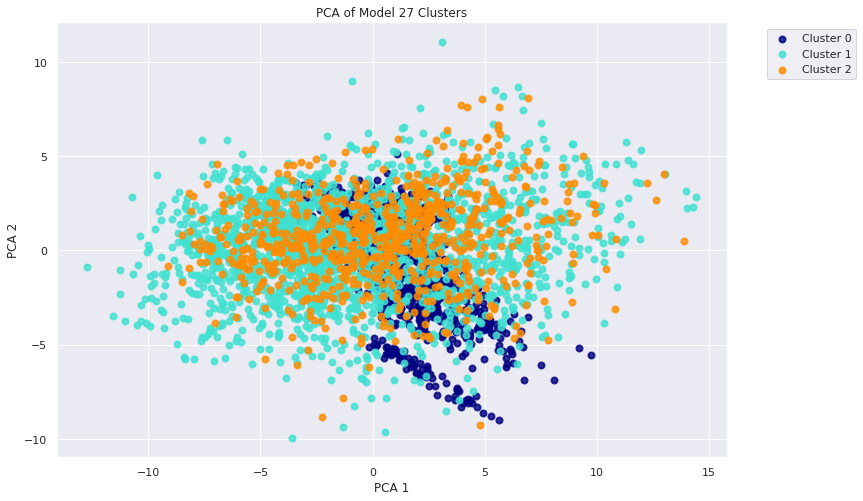

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model27_clusters == i,0], pca_results[model27_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 27 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model27_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model27_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model27_cl_counts_df)
print('Number of Observations in Model 27: ',model27_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        964       1956        767
Number of Observations in Model 27:  3687


**Model 28: GMM with PCA**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Running PCA on 28 Components, found this as ideal number in model 2
pca = PCA(n_components=28, random_state=123)
pca_results = pca.fit_transform(X_std)

In [ ]:
#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model28_clusters = gmm_cluster.fit_predict(pca_results)

#Silhouette Score
model28_sscore = metrics.silhouette_score(pca_results, model28_clusters, metric='euclidean')
print('Silhouette Score for Model 28: ', model28_sscore)
print()
#Calinski Harabasz Score
model28_chscore = metrics.calinski_harabasz_score(pca_results, model28_clusters)
print('Calinski Harbasz Score for Model 28: ', model28_chscore)

Silhouette Score for Model 28:  -0.019654029626718642

Calinski Harbasz Score for Model 28:  182.75573034486172


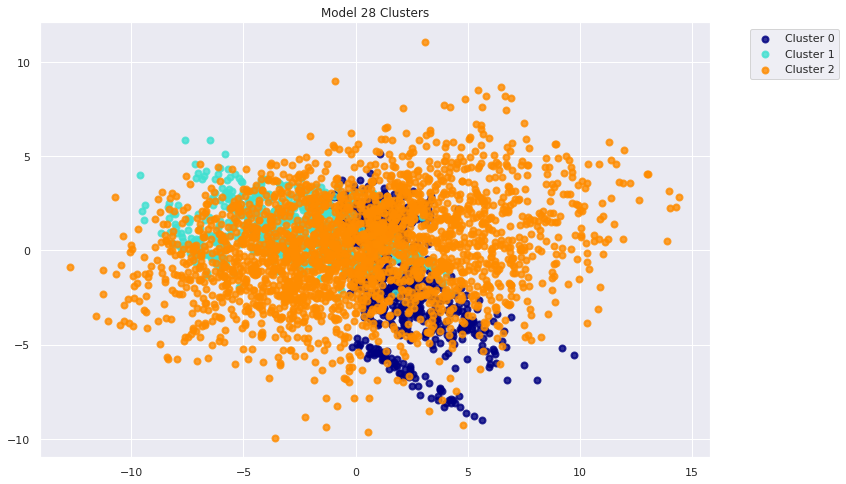

In [ ]:
#plot results
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model28_clusters == i, 0], pca_results[model28_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 28 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model28_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model28_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model28_cl_counts_df)
print('Number of Observations in Model 28: ',model28_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        701        688       2298
Number of Observations in Model 28:  3687


**Model 29: Gaussian Mixture Models Clustering Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
model29_clusters = gmm_cluster.fit_predict(X_std)

#Silhouette Score
model29_sscore = metrics.silhouette_score(X_std, model29_clusters, metric='euclidean')
print('Silhouette Score for Model 29: ', model29_sscore)
print()
#Calinski Harabasz Score
model29_chscore = metrics.calinski_harabasz_score(X_std, model29_clusters)
print('Calinski Harbasz Score for Model 29: ', model29_chscore)

Silhouette Score for Model 29:  0.0072339054149175444

Calinski Harbasz Score for Model 29:  192.86172526416001


Explained Variance Ratio (2 Compoenents):  [0.34188531 0.13691726]


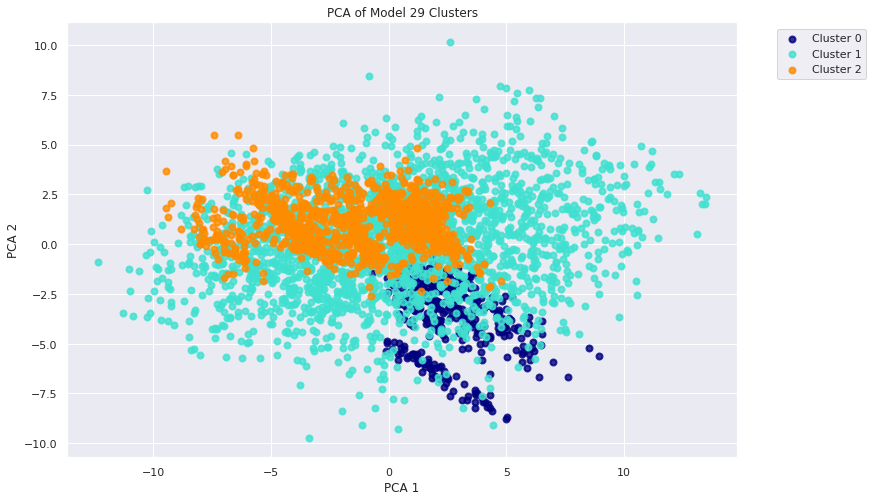

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model29_clusters == i,0], pca_results[model29_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 29 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model29_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model29_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model29_cl_counts_df)
print('Number of Observations in Model 29: ',model29_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        369       2303       1015
Number of Observations in Model 29:  3687


**Model 30: GMM with PCA on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Running PCA on 30 Components, found this as ideal number earlier for same data
pca = PCA(n_components=30, random_state=123)
pca_results = pca.fit_transform(X_std)

In [ ]:
#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model30_clusters = gmm_cluster.fit_predict(pca_results)

#Silhouette Score
model30_sscore = metrics.silhouette_score(pca_results, clusters, metric='euclidean')
print('Silhouette Score for Model 30: ', model30_sscore)
print()
#Calinski Harabasz Score
model30_chscore = metrics.calinski_harabasz_score(pca_results, model30_clusters)
print('Calinski Harbasz Score for Model 30: ', model30_chscore)

Silhouette Score for Model 30:  0.13827671851341955

Calinski Harbasz Score for Model 30:  206.62157121749294


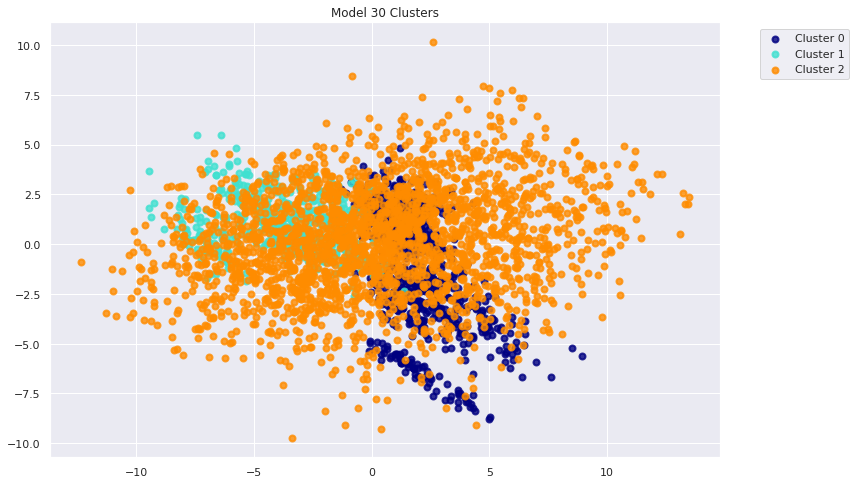

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model30_clusters == i, 0], pca_results[model30_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 30 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model30_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model30_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model30_cl_counts_df)
print('Number of Observations in Model 30: ',model30_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        786        605       2296
Number of Observations in Model 30:  3687


**Model 31: Gaussian Mixture Models Clustering Lower Associated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
model31_clusters = kmeans.fit_predict(X)

#Silhouette Score
model31_sscore = metrics.silhouette_score(X_std, model31_clusters, metric='euclidean')
print('Silhouette Score for Model 31: ', model31_sscore)
print()
#Calinski Harabasz Score
model31_chscore = metrics.calinski_harabasz_score(X_std, model31_clusters)
print('Calinski Harbasz Score for Model 31: ', model31_chscore)

Silhouette Score for Model 31:  0.020644892940940178

Calinski Harbasz Score for Model 31:  82.09197799718002


Explained Variance Ratio (2 Compoenents):  [0.28965774 0.13141593]


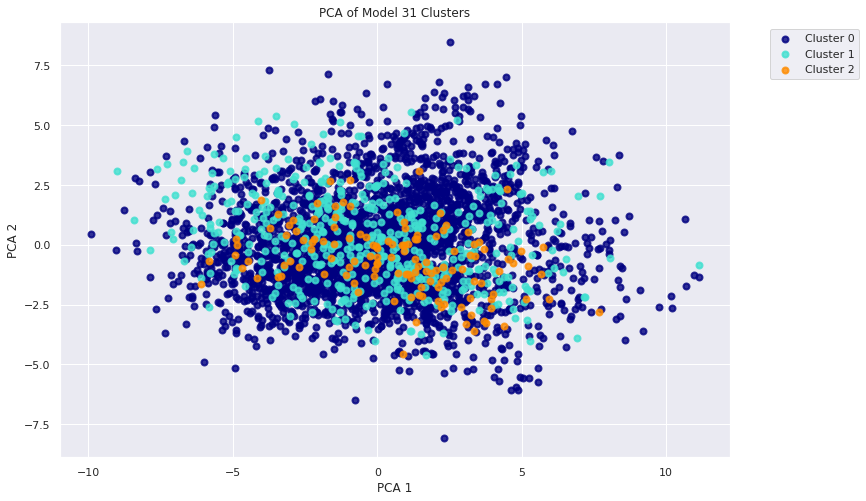

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model31_clusters == i,0], pca_results[model31_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 31 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model31_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model31_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model31_cl_counts_df)
print('Number of Observations in Model 31: ',model31_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       3042        513        132
Number of Observations in Model 31:  3687


**Model 32: GMM with PCA on Lower Associated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Running PCA on 23 Components, found this as ideal number earlier for same data
pca = PCA(n_components=23, random_state=123)
pca_results = pca.fit_transform(X_std)

In [ ]:
#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model32_clusters = gmm_cluster.fit_predict(pca_results)

#Silhouette Score
model32_sscore = metrics.silhouette_score(pca_results, model32_clusters, metric='euclidean')
print('Silhouette Score for Model 32: ', model32_sscore)
print()
#Calinski Harabasz Score
model32_chscore = metrics.calinski_harabasz_score(pca_results, model32_clusters)
print('Calinski Harbasz Score for Model 32 ', model32_chscore)

Silhouette Score for Model 32:  0.028823308832591148

Calinski Harbasz Score for Model 32  97.11384679662851


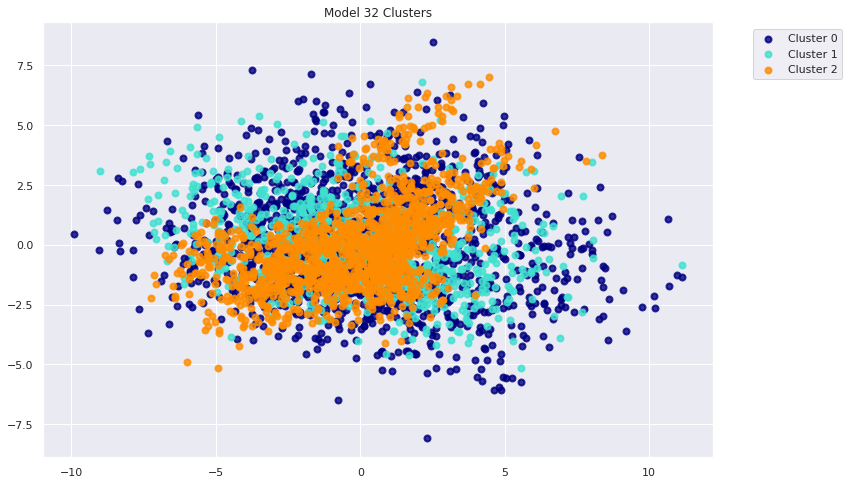

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model32_clusters == i, 0], pca_results[model32_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 32 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model32_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model32_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model32_cl_counts_df)
print('Number of Observations in Model 32: ',model32_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1485        835       1367
Number of Observations in Model 32:  3687


**Model 33: Gaussian Mixture Models Clustering Lower Associated Cleaned Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
model33_clusters = kmeans.fit_predict(X_std)

#Silhouette Score
model33_sscore = metrics.silhouette_score(X_std, model33_clusters, metric='euclidean')
print('Silhouette Score for Model 33: ', model33_sscore)
print()
#Calinski Harabasz Score
model33_chscore = metrics.calinski_harabasz_score(X_std, model33_clusters)
print('Calinski Harbasz Score for Model 33: ', model33_chscore)

Silhouette Score for Model 33:  0.12810516799669222

Calinski Harbasz Score for Model 33:  629.5408639983622


Explained Variance Ratio (2 Compoenents):  [0.29759388 0.12628928]


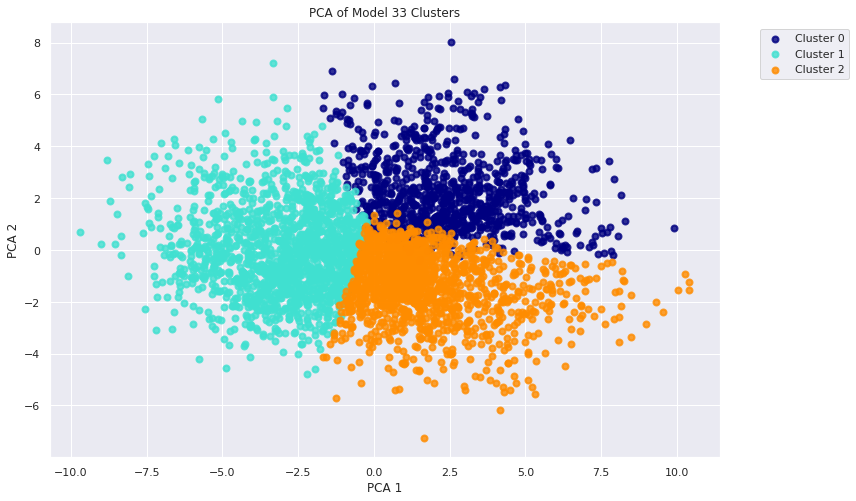

In [ ]:
#Run PCA to plot data
pca = PCA(n_components=2, random_state=123)
pca_results = pca.fit_transform(X_std)

#percentage of variance explained for chosen components:
print('Explained Variance Ratio (2 Compoenents): ', pca.explained_variance_ratio_)

#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color,i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model33_clusters == i,0], pca_results[model33_clusters==i,1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('PCA of Model 33 Clusters')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model33_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model33_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model33_cl_counts_df)
print('Number of Observations in Model 33: ',model33_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        870       1464       1353
Number of Observations in Model 33:  3687


**Model 34: GMM with PCA on Lower Associated Cleaned Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#Running PCA on 24 Components, found this as ideal number earlier for same data
pca = PCA(n_components=24, random_state=123)
pca_results = pca.fit_transform(X_std)

In [ ]:
#create instance of model
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model34_clusters = gmm_cluster.fit_predict(pca_results)

#Silhouette Score
model34_sscore = metrics.silhouette_score(pca_results, model34_clusters, metric='euclidean')
print('Silhouette Score for Model 34: ', model34_sscore)
print()
#Calinski Harabasz Score
model34_chscore = metrics.calinski_harabasz_score(pca_results, model34_clusters)
print('Calinski Harbasz Score for Model 34 ', model34_chscore)

Silhouette Score for Model 34:  0.028263668967382426

Calinski Harbasz Score for Model 34  101.84444935031743


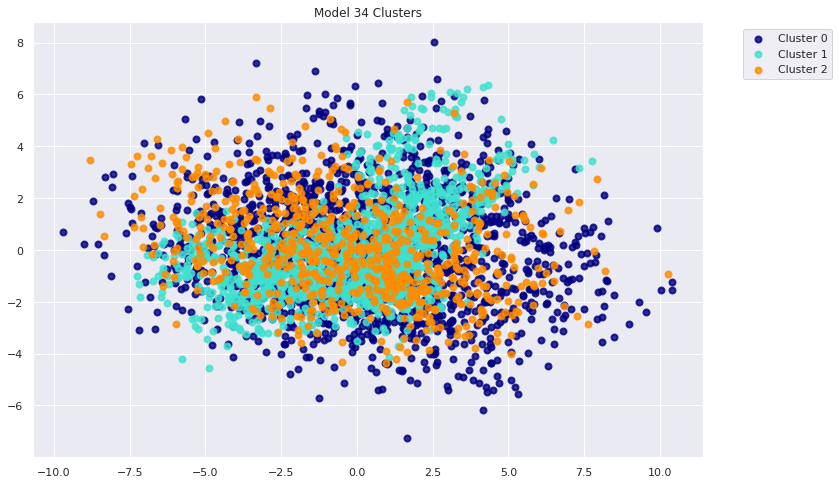

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(pca_results[model34_clusters == i, 0], pca_results[model34_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 34 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model34_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model34_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model34_cl_counts_df)
print('Number of Observations in Model 34: ',model34_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1623       1347        717
Number of Observations in Model 34:  3687


**Model 35 GMM Clustering with 2 Component t-SNE Dimensionality Reduction**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.023s...
[t-SNE] Computed neighbors for 3687 samples in 0.862s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 43.950125
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.468613
[t-SNE] KL divergence after 500 iterations: 1.333223


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model35_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model35_sscore = metrics.silhouette_score(tsne_results, clusters, metric='euclidean')
print('Silhouette Score for Model 35: ', model35_sscore)
print()
#Calinski Harabasz Score
model35_chscore = metrics.calinski_harabasz_score(tsne_results, model35_clusters )
print('Calinski Harbasz Score for Model 35: ', model35_chscore)

Silhouette Score for Model 35:  0.08086093

Calinski Harbasz Score for Model 35:  2736.505526713781


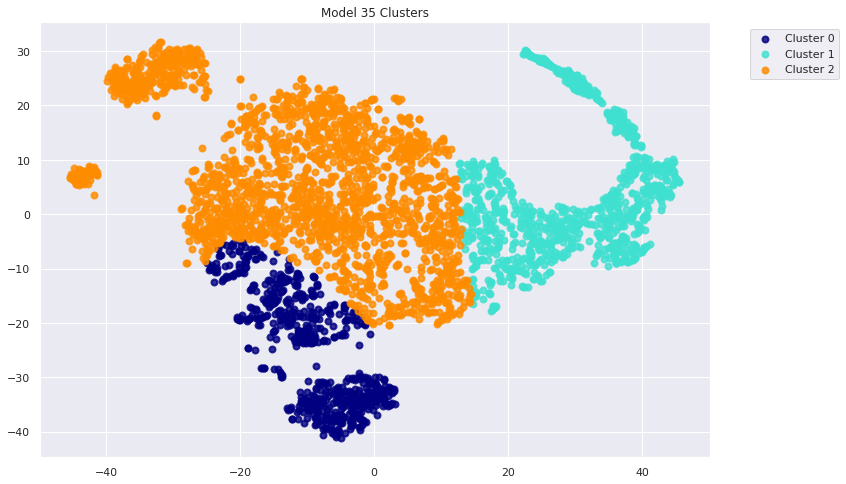

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model35_clusters == i, 0], tsne_results[model35_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 35 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model35_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model35_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model35_cl_counts_df)
print('Number of Observations in Model 35: ',model35_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        638        997       2052
Number of Observations in Model 35:  3687


**Model 36: GMM with 2 Component t-SNE Dimensionality Reduction on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.021s...
[t-SNE] Computed neighbors for 3687 samples in 1.500s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.986978
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.890594
[t-SNE] KL divergence after 500 iterations: 1.586420
t-SNE done! Time elapsed: 19.379623651504517 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model36_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model36_sscore = metrics.silhouette_score(tsne_results, clusters, metric='euclidean')
print('Silhouette Score for Model 36: ', model36_sscore)
print()
#Calinski Harabasz Score
model36_chscore = metrics.calinski_harabasz_score(tsne_results, model36_clusters )
print('Calinski Harbasz Score for Model 36: ', model36_chscore)

Silhouette Score for Model 36:  0.2918193

Calinski Harbasz Score for Model 36:  3195.44746761672


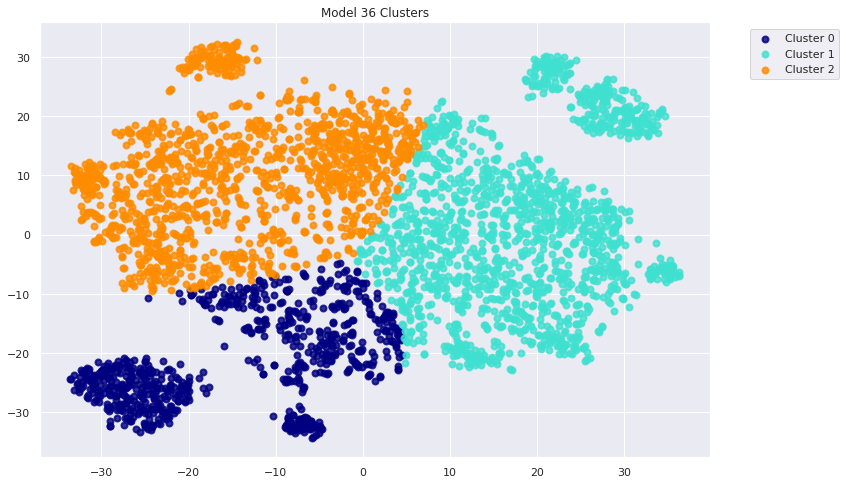

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model36_clusters == i, 0], tsne_results[model36_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 36 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model36_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model36_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model36_cl_counts_df)
print('Number of Observations in Model 36: ',model36_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        757       1567       1363
Number of Observations in Model 36:  3687


**Model 37 GMM Clustering with Lower Correlated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.016s...
[t-SNE] Computed neighbors for 3687 samples in 0.962s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.664779
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.390793
[t-SNE] KL divergence after 500 iterations: 1.687913


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model37_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model37_sscore = metrics.silhouette_score(tsne_results, clusters, metric='euclidean')
print('Silhouette Score for Model 37: ', model37_sscore)
print()
#Calinski Harabasz Score
model37_chscore = metrics.calinski_harabasz_score(tsne_results, model37_clusters )
print('Calinski Harbasz Score for Model 37: ', model37_chscore)

Silhouette Score for Model 37:  0.23628601

Calinski Harbasz Score for Model 37:  2540.344680977359


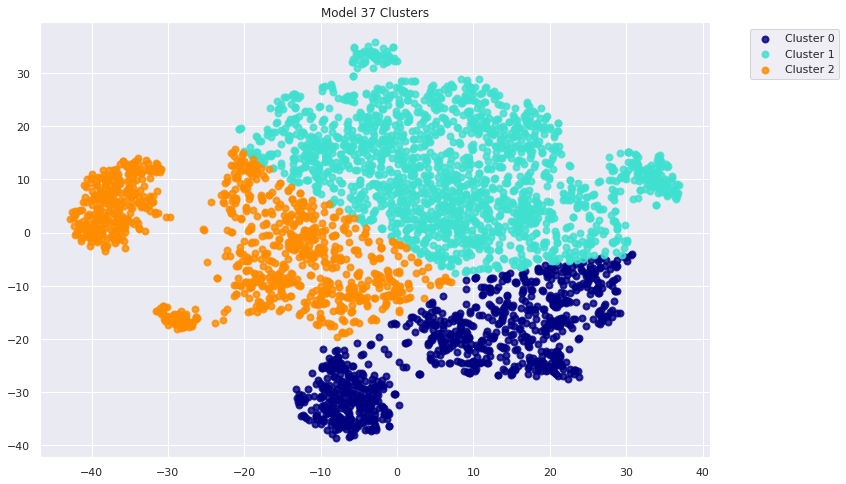

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model37_clusters == i, 0], tsne_results[model37_clusters == i, 1], color = color, alpha=.8, 
              lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 37 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model37_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model37_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model37_cl_counts_df)
print('Number of Observations in Model 37: ',model37_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        904       1778       1005
Number of Observations in Model 37:  3687


**Model 38: GMM with 2 Component t-SNE Dimensionality Reduction on Lower Asspcoated Cleaned Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.032s...
[t-SNE] Computed neighbors for 3687 samples in 1.021s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.692832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.080231
[t-SNE] KL divergence after 500 iterations: 1.672923
t-SNE done! Time elapsed: 19.272862195968628 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model38_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model38_sscore = metrics.silhouette_score(tsne_results, model38_clusters, metric='euclidean')
print('Silhouette Score for Model 38: ', model38_sscore)
print()
#Calinski Harabasz Score
model38_chscore = metrics.calinski_harabasz_score(tsne_results, model38_clusters )
print('Calinski Harbasz Score for Model 38: ', model38_chscore)

Silhouette Score for Model 38:  0.3928238

Calinski Harbasz Score for Model 38:  3039.763715540841


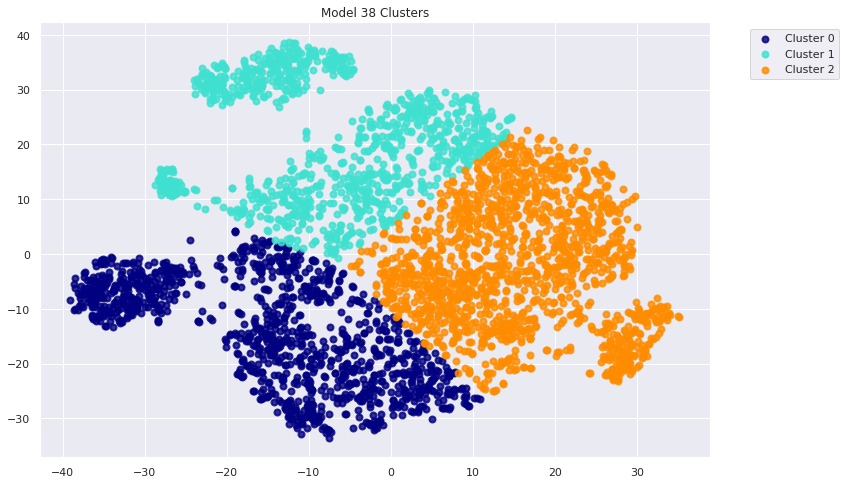

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model38_clusters == i, 0], tsne_results[model38_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 38 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model38_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model38_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model38_cl_counts_df)
print('Number of Observations in Model 38: ',model38_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1152       1052       1483
Number of Observations in Model 38:  3687


**Model 39 GMM Clustering with 3 Component t-SNE Dimensionality Reduction**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.025s...
[t-SNE] Computed neighbors for 3687 samples in 0.852s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 43.950125
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.725815
[t-SNE] KL divergence after 500 iterations: 1.143667


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model39_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model39_sscore = metrics.silhouette_score(tsne_results, clusters, metric='euclidean')
print('Silhouette Score for Model 39: ', model39_sscore)
print()
#Calinski Harabasz Score
model39_chscore = metrics.calinski_harabasz_score(tsne_results, model39_clusters )
print('Calinski Harbasz Score for Model 39: ', model39_chscore)

Silhouette Score for Model 39:  0.09901708

Calinski Harbasz Score for Model 39:  1918.5817484571128


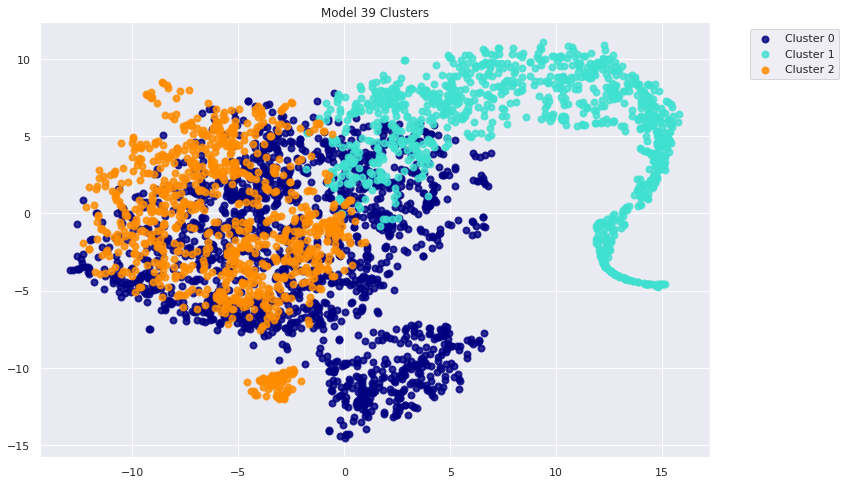

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model39_clusters == i, 0], tsne_results[model39_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 39 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model39_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model39_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model39_cl_counts_df)
print('Number of Observations in Model 39: ',model39_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1710       1019        958
Number of Observations in Model 39:  3687


**Model 40: GMM with 3 Component t-SNE Dimensionality Reduction on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.031s...
[t-SNE] Computed neighbors for 3687 samples in 1.487s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.986978
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.006767
[t-SNE] KL divergence after 500 iterations: 1.407917
t-SNE done! Time elapsed: 73.37317991256714 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model40_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model40_sscore = metrics.silhouette_score(tsne_results, clusters, metric='euclidean')
print('Silhouette Score for Model 40: ', model40_sscore)
print()
#Calinski Harabasz Score
model40_chscore = metrics.calinski_harabasz_score(tsne_results, model36_clusters )
print('Calinski Harbasz Score for Model 40: ', model40_chscore)

Silhouette Score for Model 40:  0.26165095

Calinski Harbasz Score for Model 40:  2092.4354639475264


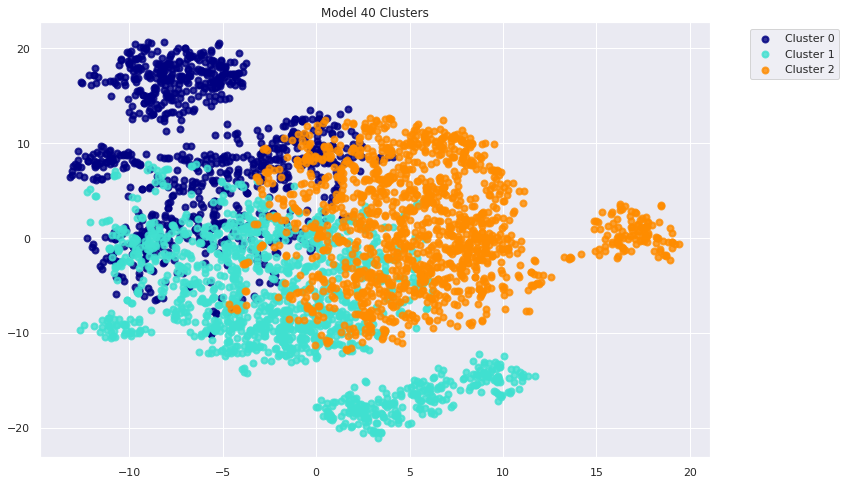

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model40_clusters == i, 0], tsne_results[model40_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 40 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model40_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model40_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model40_cl_counts_df)
print('Number of Observations in Model 40: ',model40_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0        915       1388       1384
Number of Observations in Model 40:  3687


**Model 41 GMM Clustering with 3 Component t-SNE Lower Correlated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.015s...
[t-SNE] Computed neighbors for 3687 samples in 0.975s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.664779
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.435318
[t-SNE] KL divergence after 500 iterations: 1.503309


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model41_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model41_sscore = metrics.silhouette_score(tsne_results, clusters, metric='euclidean')
print('Silhouette Score for Model 41: ', model41_sscore)
print()
#Calinski Harabasz Score
model41_chscore = metrics.calinski_harabasz_score(tsne_results, model37_clusters )
print('Calinski Harbasz Score for Model 41: ', model41_chscore)

Silhouette Score for Model 41:  0.19792764

Calinski Harbasz Score for Model 41:  1547.225857973971


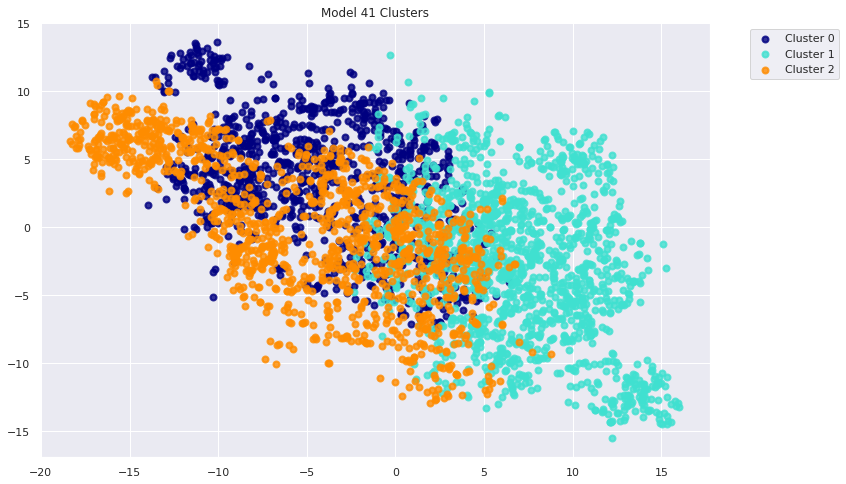

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model41_clusters == i, 0], tsne_results[model41_clusters == i, 1], color = color, alpha=.8, 
              lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 41 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model41_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model41_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model41_cl_counts_df)
print('Number of Observations in Model 41: ',model41_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1015       1450       1222
Number of Observations in Model 41:  3687


**Model 42: GMM with 3 Component t-SNE Dimensionality Reduction on Lower Asspcoated Cleaned Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=500, random_state=123)

#fit_transform data
tsne_results = tsne.fit_transform(X_std)

print('t-SNE done! Time elapsed: {} seconds.'.format(time.time() - time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3687 samples in 0.033s...
[t-SNE] Computed neighbors for 3687 samples in 1.022s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3687
[t-SNE] Computed conditional probabilities for sample 2000 / 3687
[t-SNE] Computed conditional probabilities for sample 3000 / 3687
[t-SNE] Computed conditional probabilities for sample 3687 / 3687
[t-SNE] Mean sigma: 1.692832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.157974
[t-SNE] KL divergence after 500 iterations: 1.475605
t-SNE done! Time elapsed: 65.87625122070312 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)

#'predictions' for new data
model42_clusters = gmm_cluster.fit_predict(tsne_results)

#Silhouette Score
model42_sscore = metrics.silhouette_score(tsne_results, model42_clusters, metric='euclidean')
print('Silhouette Score for Model 42: ', model42_sscore)
print()
#Calinski Harabasz Score
model42_chscore = metrics.calinski_harabasz_score(tsne_results, model42_clusters )
print('Calinski Harbasz Score for Model 42: ', model42_chscore)

Silhouette Score for Model 42:  0.29235864

Calinski Harbasz Score for Model 42:  1800.2056607582383


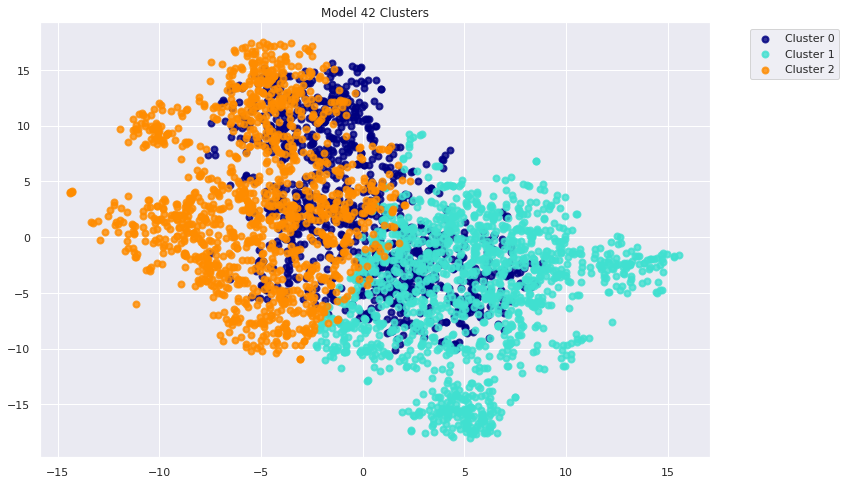

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(tsne_results[model42_clusters == i, 0], tsne_results[model42_clusters == i, 1], 
    color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 42 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model42_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model42_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model42_cl_counts_df)
print('Number of Observations in Model 42: ',model42_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1053       1340       1294
Number of Observations in Model 42:  3687


**Model 43: GMM with UMAP Dimensionality Reduction**

In [ ]:
#set features
X = il_num_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model43_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model43_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.30315136909485 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model43_clusters = gmm_cluster.fit_predict(umap_results)
#Silhouette Score
model43_sscore = metrics.silhouette_score(umap_results, model43_clusters, metric='euclidean')
print('Silhouette Score for Model 43: ', model43_sscore)
print()
#Calinski Harabasz Score
model43_chscore = metrics.calinski_harabasz_score(umap_results, model43_clusters )
print('Calinski Harbasz Score for Model 43: ', model43_chscore)

Silhouette Score for Model 43:  0.3517326

Calinski Harbasz Score for Model 43:  2872.154980171394


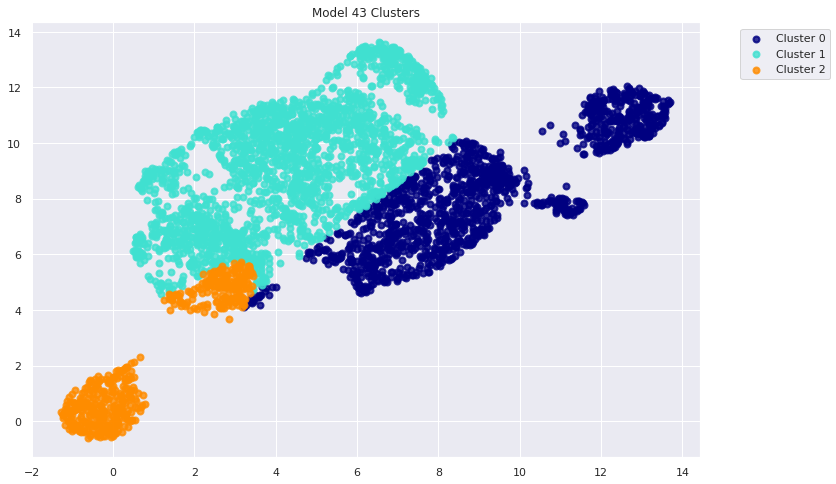

In [ ]:
#plot results
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(umap_results[model43_clusters == i, 0], umap_results[model43_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 43 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model43_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model43_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model43_cl_counts_df)
print('Number of Observations in Model 43: ',model43_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1269       1923        495
Number of Observations in Model 43:  3687


**Model 44: GMM with UMAP Dimensionality Reduction on Cleaned Data**

In [ ]:
#set features
X = cleaned_data.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model44_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model44_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.4306640625 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model44_clusters = gmm_cluster.fit_predict(umap_results)
#Silhouette Score
model44_sscore = metrics.silhouette_score(umap_results, clusters, metric='euclidean')
print('Silhouette Score for Model 44: ', model44_sscore)
print()
#Calinski Harabasz Score
model44_chscore = metrics.calinski_harabasz_score(umap_results, model44_clusters )
print('Calinski Harbasz Score for Model 44: ', model44_chscore)

Silhouette Score for Model 44:  0.067064635

Calinski Harbasz Score for Model 44:  2305.922559031711


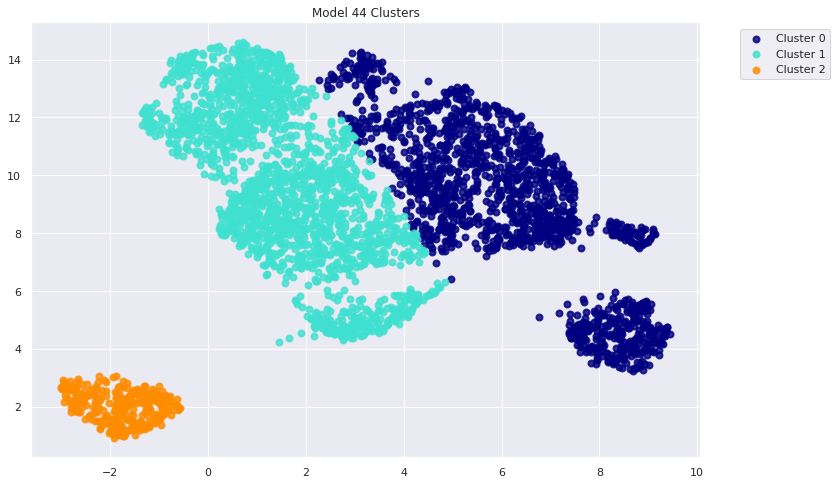

In [ ]:
#plot results
plt.figure(figsize=(12,8))
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(umap_results[model44_clusters == i, 0], umap_results[model44_clusters == i, 1], color = color, alpha=.8, 
              lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 44 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model44_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model44_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model44_cl_counts_df)
print('Number of Observations in Model 44: ',model44_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1529       1852        306
Number of Observations in Model 44:  3687


**Model 45: GMM with UMAP Dimensionality Reduction on Less Correlated Data**

In [ ]:
#set features
X = corr_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model45_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model45_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 17.76854395866394 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model45_clusters = gmm_cluster.fit_predict(umap_results)
#Silhouette Score
model45_sscore = metrics.silhouette_score(umap_results, clusters, metric='euclidean')
print('Silhouette Score for Model 45: ', model45_sscore)
print()
#Calinski Harabasz Score
model45_chscore = metrics.calinski_harabasz_score(umap_results, model45_clusters )
print('Calinski Harbasz Score for Model 45: ', model45_chscore)

Silhouette Score for Model 45:  0.063205495

Calinski Harbasz Score for Model 45:  3093.8987781881697


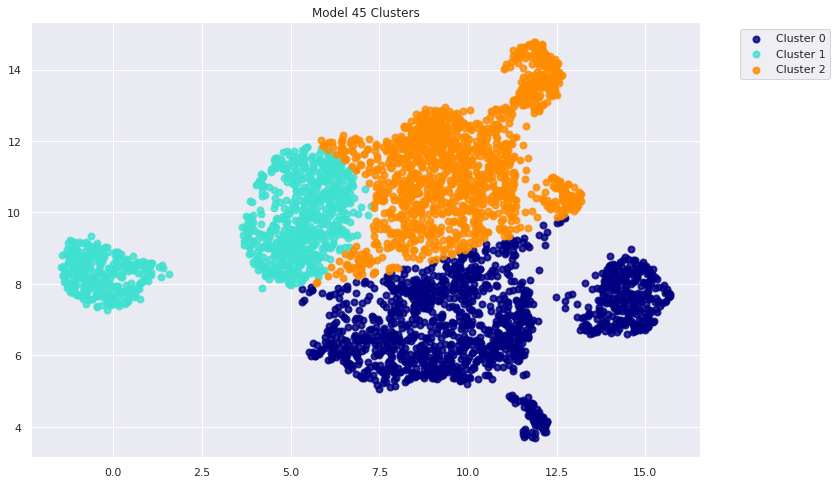

In [ ]:
#plot results
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(umap_results[model45_clusters == i, 0], umap_results[model45_clusters == i, 1], 
      color = color, alpha=.8, lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 45 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model45_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model45_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model45_cl_counts_df)
print('Number of Observations in Model 45: ',model45_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1402        947       1338
Number of Observations in Model 45:  3687


**Model 46: GMM with UMAP Dimensionality Reduction on Less Correlated Cleaned Data**

In [ ]:
#set features
X = corr_cleaned_data_df.values

#scale/standardize data
scaler = StandardScaler()
X_std=scaler.fit_transform(X)

time_start = time.time()

#create instance of model
model46_umap = umap.UMAP(n_neighbors=15, min_dist=0.3, metric = 'correlation', random_state=123)

#fit_transform data
umap_results = model46_umap.fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds.'.format(time.time() - time_start))

UMAP done! Time elapsed: 18.15664029121399 seconds.


In [ ]:
#create instance of model 
gmm_cluster = GaussianMixture(n_components=3, random_state=123)
#'predictions' for new data
model46_clusters = gmm_cluster.fit_predict(umap_results)
#Silhouette Score
model46_sscore = metrics.silhouette_score(umap_results, model46_clusters, metric='euclidean')
print('Silhouette Score for Model 46: ', model46_sscore)
print()
#Calinski Harabasz Score
model46_chscore = metrics.calinski_harabasz_score(umap_results, model46_clusters )
print('Calinski Harbasz Score for Model 46: ', model46_chscore)

Silhouette Score for Model 46:  0.3843468

Calinski Harbasz Score for Model 46:  2728.964839635193


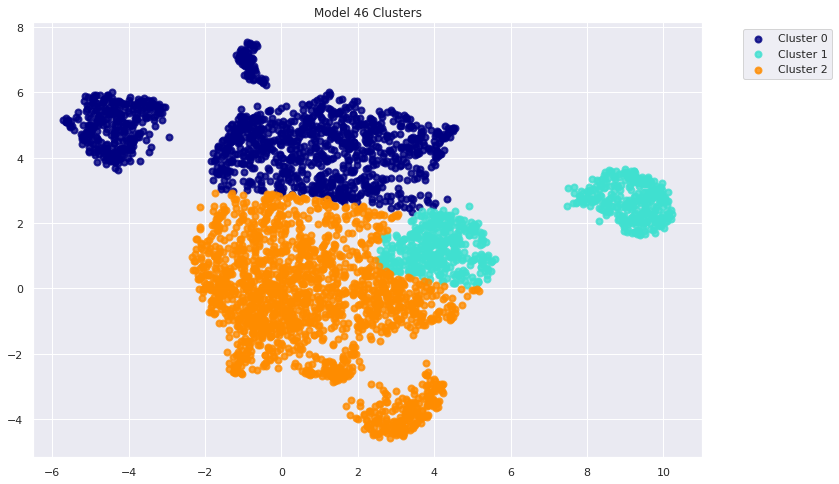

In [ ]:
#plot results
plt.figure(figsize=(12,8))
colors = ['navy', 'turquoise', 'darkorange']
lw = 2
target_names = ['Cluster 0', 'Cluster 1', 'Cluster 2']
for color, i, target_name in zip(colors, [0,1,2], target_names):
  plt.scatter(umap_results[model46_clusters == i, 0], umap_results[model46_clusters == i, 1], color = color, alpha=.8, 
              lw=lw, label = target_name)

plt.legend(loc = 'best', shadow = False, scatterpoints=1)
plt.legend(bbox_to_anchor=(1.05, 1), loc = 2, borderaxespad=0.6)
plt.title('Model 46 Clusters')
plt.show()

In [ ]:
#calculating the counts of the cluster
unique, counts = np.unique(model46_clusters, return_counts=True)
counts = counts.reshape(1,3)

#create a dataframe
model46_cl_counts_df = pd.DataFrame(counts, columns=['Cluster 0', 'Cluster 1', 'Cluster 2'])

#display counts in each cluster
print(model46_cl_counts_df)
print('Number of Observations in Model 46: ',model46_cl_counts_df.values.sum())

   Cluster 0  Cluster 1  Cluster 2
0       1278        691       1718
Number of Observations in Model 46:  3687


# **Model Comparisons**

In [ ]:
results_dict = {'Model':range(1,47),
'Inertia':[model1_inertia, model2_inertia, model3_inertia, model4_inertia, 
model5_inertia, model6_inertia, model7_inertia, model8_inertia, model9_inertia, 
model10_inertia, model11_inertia, model12_inertia, model13_inertia, model14_inertia, 
model15_inertia, model16_inertia, model17_inertia, model18_inertia, model19_inertia, 
model20_inertia, 'NaN', 'NaN','NaN', 'NaN', 'NaN', 'NaN','NaN', 'NaN', 'NaN',
'NaN', 'NaN', 'NaN', 'NaN','NaN', 'NaN','NaN', 'NaN', 'NaN', 'NaN','NaN', 'NaN', 
'NaN', 'NaN','NaN', 'NaN','NaN'],
'Silhouette Score':[model1_sscore, model2_sscore, model3_sscore, model4_sscore, 
model5_sscore, model6_sscore, model7_sscore, model8_sscore, model9_sscore, 
model10_sscore, model11_sscore, model12_sscore, model13_sscore, model14_sscore, 
model15_sscore, model16_sscore, model17_sscore, model18_sscore, 
model19_sscore, model20_sscore, model21_sscore, model22_sscore, model23_sscore,
model24_sscore, model25_sscore, model26_sscore, model27_sscore, model28_sscore, 
model29_sscore, model30_sscore, model31_sscore, model32_sscore,model33_sscore, 
model34_sscore, model35_sscore, model36_sscore, model37_sscore,model38_sscore,
model39_sscore, model40_sscore, model41_sscore, model42_sscore, model43_sscore,
model44_sscore,model45_sscore, model46_sscore], 
'Calinski Harbasz Score':[model1_chscore,model2_chscore,model3_chscore,
model4_chscore,model5_chscore,model6_chscore,model7_chscore,model8_chscore,
model9_chscore,model10_chscore,model11_chscore,model12_chscore,model13_chscore,
model14_chscore,model15_chscore,model16_chscore,model17_chscore,model18_chscore,
model19_chscore,model20_chscore,model21_chscore,model22_chscore,model23_chscore,
model24_chscore,model25_chscore,model26_chscore,model27_chscore,model28_chscore,
model29_chscore,model30_chscore,model31_chscore,model32_chscore,model33_chscore,
model34_chscore,model35_chscore,model36_chscore,model37_chscore,model38_chscore,
model39_chscore,model40_chscore,model41_chscore,model42_chscore,model43_chscore,
model44_chscore,model45_chscore,model46_chscore]}

results_df = pd.DataFrame(results_dict)

results_df

,Model,Inertia,Silhouette Score,Calinski Harbasz Score
0,1,130251,0.157640,765.058722
1,2,121637,0.166059,818.838952
2,3,130332,0.159181,763.440401
3,4,121749,0.167820,816.871436
4,5,89354.5,0.109477,590.185487
5,6,83614.5,0.116467,630.504471
6,7,90679.5,0.128105,629.540864
7,8,84735.6,0.135113,672.438478
8,9,835386,0.396429,536.451274
9,10,795465,0.407726,577.500246


In [ ]:
#df of model cluster counts
model_cluster_counts = [model10_cl_counts_df, model20_cl_counts_df, 
model3_cl_counts_df, model4_cl_counts_df, model5_cl_counts_df, 
model6_cl_counts_df, model7_cl_counts_df, model8_cl_counts_df, 
model9_cl_counts_df, model10_cl_counts_df, model11_cl_counts_df, 
model12_cl_counts_df, model13_cl_counts_df, model14_cl_counts_df,
model15_cl_counts_df, model16_cl_counts_df, model17_cl_counts_df,
model18_cl_counts_df, model19_cl_counts_df, model20_cl_counts_df, 
model21_cl_counts_df, model22_cl_counts_df, model23_cl_counts_df, 
model24_cl_counts_df, model25_cl_counts_df, model26_cl_counts_df,
model27_cl_counts_df, model28_cl_counts_df, model29_cl_counts_df, 
model30_cl_counts_df, model31_cl_counts_df, model32_cl_counts_df, 
model33_cl_counts_df, model34_cl_counts_df, model35_cl_counts_df, 
model36_cl_counts_df, model37_cl_counts_df, model38_cl_counts_df, 
model39_cl_counts_df, model40_cl_counts_df, model41_cl_counts_df, 
model42_cl_counts_df, model43_cl_counts_df, model44_cl_counts_df, 
model45_cl_counts_df, model46_cl_counts_df]

model_cluster_counts_df = pd.concat(model_cluster_counts)

model_cluster_counts_df['Model'] = range(1,47)

model_cluster_counts_df

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Model
0,1589,916,1182.0,NaN,1
0,777,1326,1584.0,NaN,2
0,1370,1550,767.0,NaN,3
0,1555,766,1366.0,NaN,4
0,1422,977,1288.0,NaN,5
0,1424,975,1288.0,NaN,6
0,870,1464,1353.0,NaN,7
0,861,1359,1467.0,NaN,8
0,1133,1555,999.0,NaN,9
0,1589,916,1182.0,NaN,10


In [ ]:
#Assign Cluster number column to original df
illinois_df['cluster'] = model18_clusters
illinois_df.head(8)

,ï»¿Contract,school_id,report_school_id,school_name,location,student_response_rate,teacher_response_rate,student_n,teacher_n,acno,cdis,clar,colb,colr,data,emhl,engg,engl,grit,humr,inf3,innv,ins3,math,peer,perc,pgmc,pnfl,pres,prs2,prt4,prti,pssm,qpd2,refd,rigr,safe,scie,scmt,sdis,...,range_data,range_emhl,range_engg,range_engl,range_grit,range_humr,range_inf3,range_innv,range_ins3,range_math,range_peer,range_perc,range_pgmc,range_pnfl,range_pres,range_prs2,range_prt4,range_prti,range_pssm,range_qpd2,range_refd,range_rigr,range_safe,range_scie,range_scmt,range_sdis,range_socz,range_ssaf,range_stdy,range_trpa,range_trpr,range_trte,range_trts,range_tsaf,range_E_ldr,range_E_tch,range_E_fam,range_E_env,range_E_ins,cluster
0,ISBE,3753,070161630022008,21st Century Primary Center,240 S Orchard Dr Park Forest IL 60466,0.0,56.5,2,23,43.239193,76.0,26.424749,96.000000,83.0,99.000000,23.521739,48.973244,47.256484,14.775920,45.217391,49.0,93.0,96.0,53.904899,33.545151,41.651297,78.0,93.0,44.786744,34.501672,61.000000,46.0,28.862876,93.0,99.0,20.207358,31.172911,45.785953,59.0,99.0,...,10,3,5,5,2,5,5,10,10,6,4,5,8,10,5,4,7,5,3,10,10,3,4,5,6,10,10,5,3,6,7,10,5,5,8,9,7,4,5,1
1,ISBE,1818,500821870261014,7th Grade Academy,1900 Mousette Ln Cahokia IL 62206,52.2,50.0,232,18,53.000000,8.0,7.000000,24.083551,9.0,43.300261,2.000000,99.000000,69.000000,31.000000,24.000000,31.0,1.0,33.0,67.000000,19.000000,54.000000,61.0,19.0,68.000000,29.000000,27.443864,1.0,26.000000,57.0,26.0,25.000000,1.000000,30.000000,21.0,4.0,...,5,1,10,7,4,3,4,1,4,7,2,6,7,2,7,3,3,1,3,6,3,3,1,4,3,1,5,2,4,3,4,6,4,1,5,4,3,4,6,2
2,ISBE,1819,500821870261015,8th Grade Academy,1900 Mousette Ln Cahokia IL 62206,90.2,85.0,246,20,23.000000,1.0,1.000000,2.000000,1.0,47.000000,20.000000,44.000000,49.000000,20.000000,14.000000,18.0,1.0,9.0,44.000000,4.000000,18.000000,41.0,3.0,42.000000,16.000000,1.000000,1.0,13.000000,22.0,1.0,1.000000,1.000000,10.000000,1.0,1.0,...,5,3,5,5,3,2,2,1,1,5,1,2,5,1,5,2,1,1,2,3,1,1,1,2,1,1,1,3,2,1,4,1,3,1,3,1,1,2,4,2
3,ISBE,2027,070162180160007,A B Shepard High Sch (Campus),13049 S Ridgeland Ave Palos Heights IL 60463,78.3,70.9,1741,182,73.000000,70.0,66.000000,61.000000,41.0,63.000000,39.000000,86.000000,57.000000,28.000000,59.000000,16.0,42.0,45.0,61.000000,60.000000,70.000000,45.0,57.0,60.000000,49.000000,40.000000,56.0,40.000000,64.0,55.0,46.000000,40.000000,66.000000,50.0,50.0,...,7,4,9,6,3,6,2,5,5,7,7,8,5,6,7,5,5,6,5,7,6,5,5,7,6,6,10,5,7,6,5,5,8,5,4,6,5,6,6,1
4,ISBE,4036,060160960022001,A F Ames Elem School,86 Southcote Rd Riverside IL 60546,99.9,80.0,134,40,89.000000,87.0,26.424749,56.000000,57.0,80.000000,23.521739,48.973244,90.000000,14.775920,45.217391,48.0,80.0,42.0,89.000000,33.545151,68.000000,72.0,76.0,71.000000,34.501672,72.000000,52.0,28.862876,60.0,69.0,20.207358,68.000000,45.785953,61.0,97.0,...,9,3,5,10,2,5,5,9,5,9,4,7,8,8,8,4,8,6,3,7,7,3,7,5,7,10,10,5,3,9,5,6,9,6,6,6,8,8,9,1
5,ISBE,1450,340491870262008,A J Katzenmaier Academy,1829 Kennedy Dr North Chicago IL 60064,54.5,99.9,396,30,69.000000,45.0,54.213793,55.000000,44.0,66.000000,47.577586,64.967241,99.000000,31.589655,62.384483,37.0,32.0,90.0,79.000000,62.053448,87.000000,77.0,39.0,88.000000,54.417241,21.000000,28.0,54.267241,76.0,77.0,43.455172,29.000000,53.292894,43.0,30.0,...,7,5,7,10,4,7,4,4,10,8,7,9,8,4,9,6,3,3,6,8,8,5,3,6,5,4,8,7,6,2,8,6,6,1,8,6,3,7,8,2
6,ISBE,2984,560990860052011,A O Marshall Elem School,319 Harwood St Joliet IL 60432,99.9,97.0,149,33,99.000000,84.0,38.067391,57.000000,8.0,73.000000,32.078261,54.195652,86.000000,19.976087,52.623913,25.0,10.0,12.0,70.000000,45.134783,77.000000,37.0,22.0,72.000000,42.204348,33.000000,30.0,37.593478,37.0,27.0,29.091304,54.000000,47.406114,1.0,31.0,...,8,4,6,9,2,6,3,2,2,8,5,8,4,3,8,5,4,4,4,4,3,3,6,5,1,4,7,6,4,3,1,2,10,2,3,3,3,9,7,2
7,ISBE,4590,56099365U261003,A Vito Martinez Middle School,590 Belmont Dr Romeoville IL 60446,93.6,82.5,793,63,46.000000,62.0,37.000000,73.000000,42.0,99.000000,45.000000,73.000000,81.000000,9.000000,51.000000,4